## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'agriVision-full' 
TRANSFORM = 'gabor'
CHANNEL = 'blue'
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
blue_gabor_full_agriVision.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'd:\\new research\\hierarchical-bayesian-model-validation\\results\\case-studies\\agriVision\\full\\gabor\\blue'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 262144000,
 1: 262144000,
 2: 262144000,
 3: 262144000,
 4: 262144000,
 5: 262144000,
 6: 262144000,
 7: 262144000,
 8: 262144000,
 9: 262144000,
 10: 262144000,
 11: 262144000,
 12: 262144000,
 13: 262144000,
 14: 262144000,
 15: 262144000,
 16: 262144000,
 17: 262144000,
 18: 262144000,
 19: 262144000,
 20: 262144000,
 21: 262144000,
 22: 262144000,
 23: 262144000,
 24: 262144000,
 25: 262144000,
 26: 262144000,
 27: 262144000,
 28: 262144000,
 29: 262144000,
 30: 262144000,
 31: 262144000,
 32: 262144000,
 33: 262144000,
 34: 262144000,
 35: 262144000,
 36: 262144000,
 37: 262144000,
 38: 262144000,
 39: 262144000,
 40: 262144000,
 41: 262144000}

Running 12760 CDFs


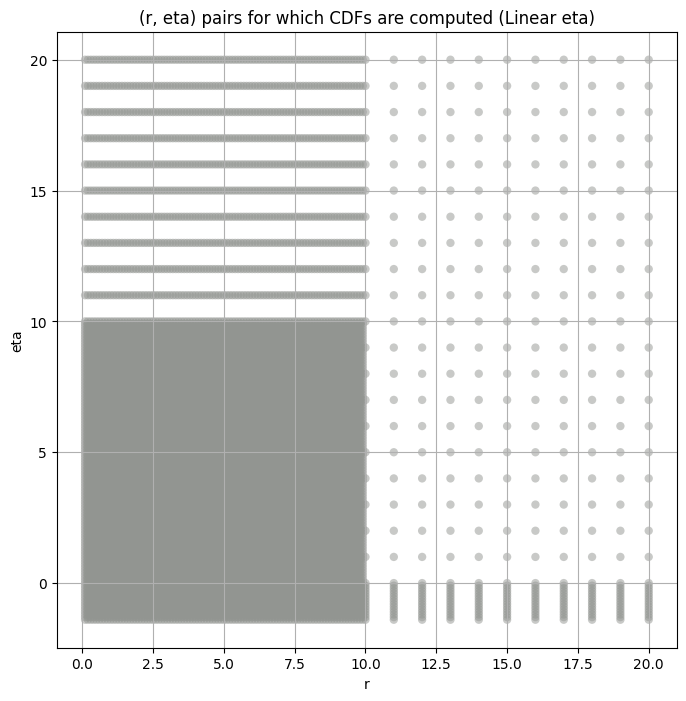

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,122.512850,39.769505,721.071700,689.621150,8.335084,762.91406,262144000.0,"(2.0, 0.5, 0.044)"
1,41.206413,19.952644,273.712800,776.613460,5.031142,803.78830,262144000.0,"(2.0, 0.5, 0.065)"
2,31.351840,10.314682,229.798840,1246.370600,4.091756,876.93860,262144000.0,"(2.0, 0.5, 0.096)"
3,22.116690,6.198631,92.711860,510.675540,8.659283,620.26135,262144000.0,"(2.0, 0.5, 0.141)"
4,5.817891,1.947129,38.298820,865.975200,8.834655,852.49660,262144000.0,"(2.0, 0.5, 0.208)"
5,0.948849,0.431888,5.817474,648.051760,7.456698,749.99900,262144000.0,"(2.0, 0.5, 0.306)"
6,0.544168,0.224286,3.753008,738.979430,10.107155,794.04407,262144000.0,"(2.0, 0.5, 0.45)"
7,96.786000,44.159317,881.038800,1494.333400,6.239370,873.81110,262144000.0,"(2.0, 1.0, 0.044)"
8,51.278526,25.238693,393.370060,982.398000,6.040555,813.75590,262144000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,122.512850,122.512848,62.852482,52.029259,43.660259
1,41.206413,41.206413,27.406546,24.977846,22.505976
2,31.351840,31.351839,13.554227,12.196302,11.140398
3,22.116690,22.116690,10.568641,8.291812,6.811898
4,5.817891,5.817891,2.980297,2.564496,2.208565
5,0.948849,0.948849,0.636404,0.568758,0.499081
6,0.544168,0.544168,0.340480,0.300706,0.258707
7,96.786000,96.786003,59.898071,54.414635,48.499115
8,51.278526,51.278526,34.460594,31.568470,28.343752


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.024664421597124286 122.51285


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.009201036153878475 62.85248


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.004935319625646417 52.02926


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.0028282591816238267 43.66026
Number of samples: 100000, Without approximation : 262144000.0


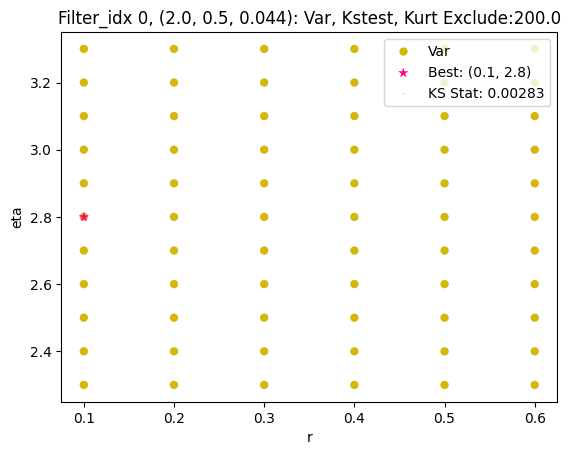

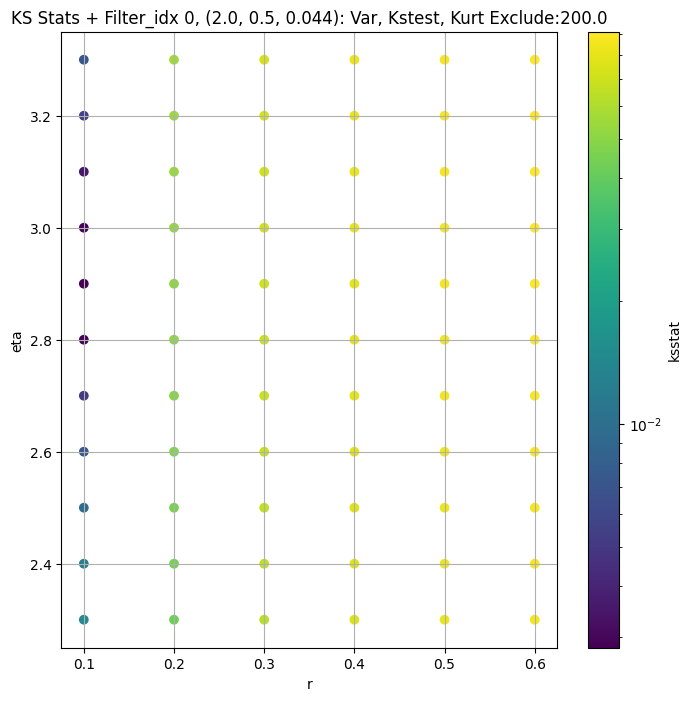

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.011519939044988527 41.206413


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.0013705878412765826 27.406546


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.0017952091119408653 24.977846


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.0031613501331499982 22.505976
Number of samples: 100000, Without approximation : 262144000.0


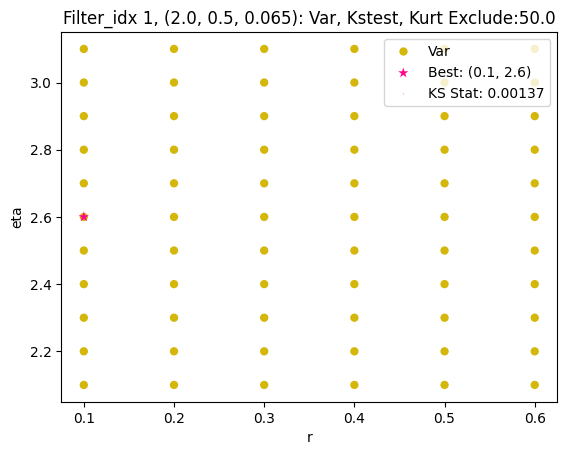

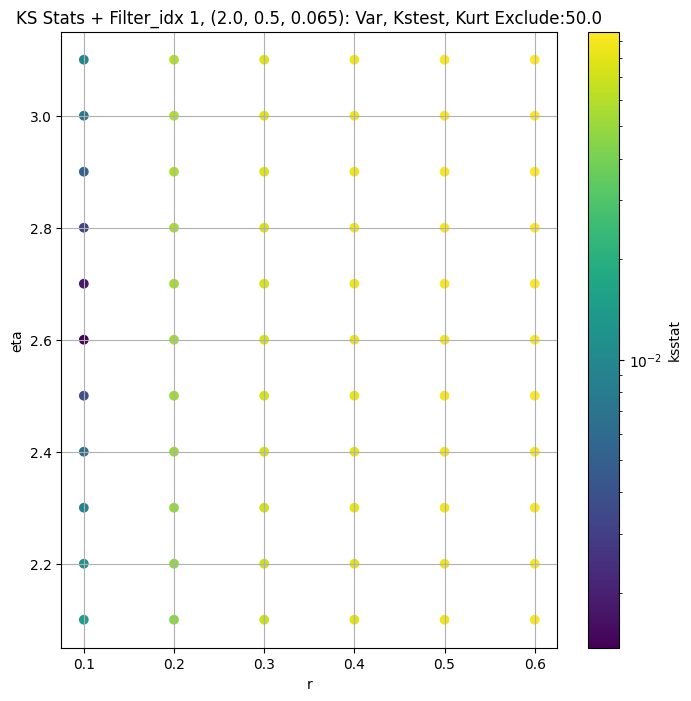

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.020458850951303308 31.35184


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.001530538268676107 13.554227


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.00222938529447142 12.196302


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.004060085809592606 11.140398
Number of samples: 100000, Without approximation : 262144000.0


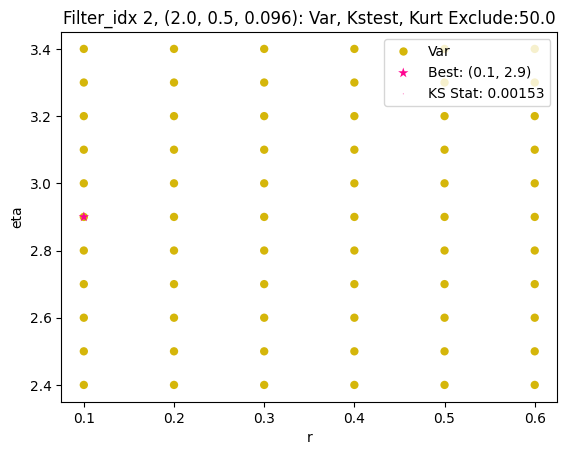

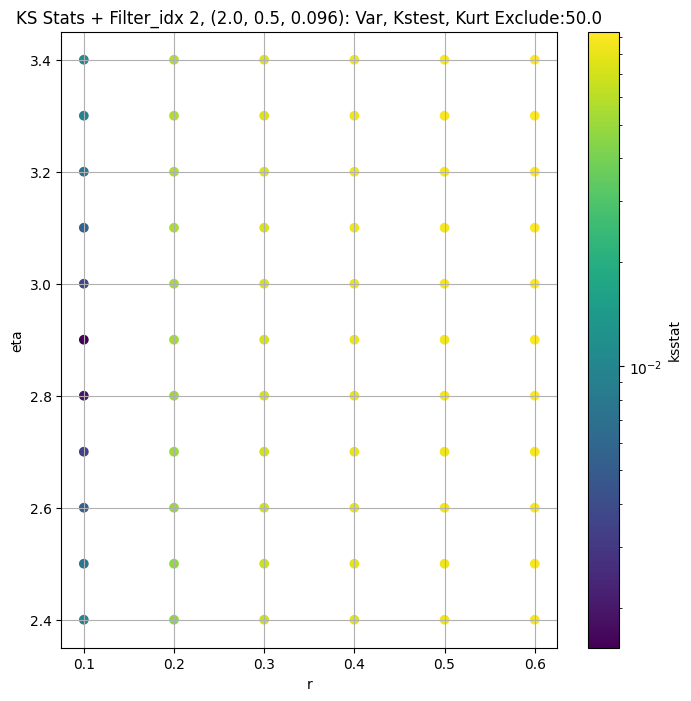

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.025004856627673155 22.11669


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.009310294697476906 10.568641


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.003485619491613856 8.291812


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.0026844985777239785 6.8118978
Number of samples: 100000, Without approximation : 262144000.0


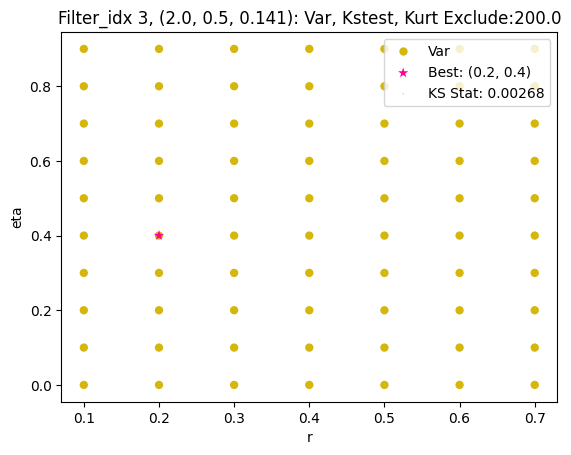

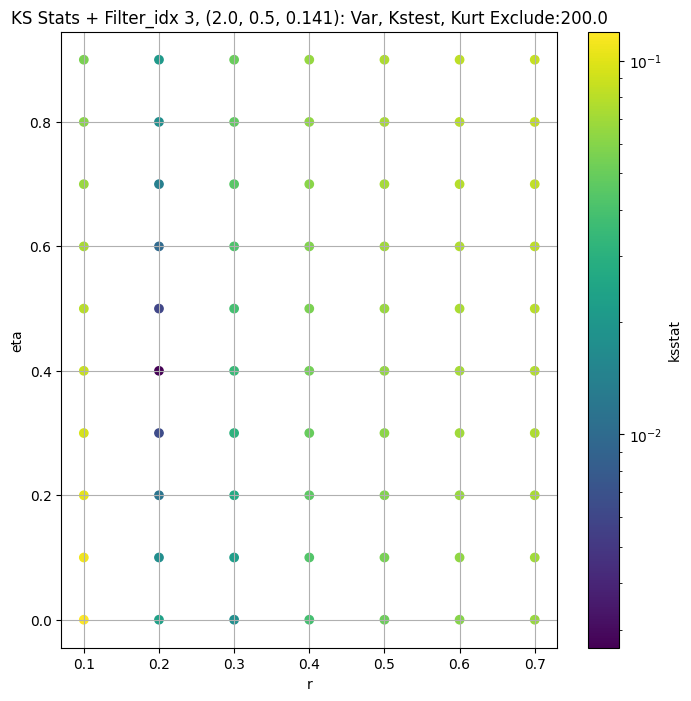

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.02165125941275453 5.817891


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.0069149299869264436 2.980297


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.004186515388176826 2.5644963


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.0032639864926207185 2.208565
Number of samples: 100000, Without approximation : 262144000.0


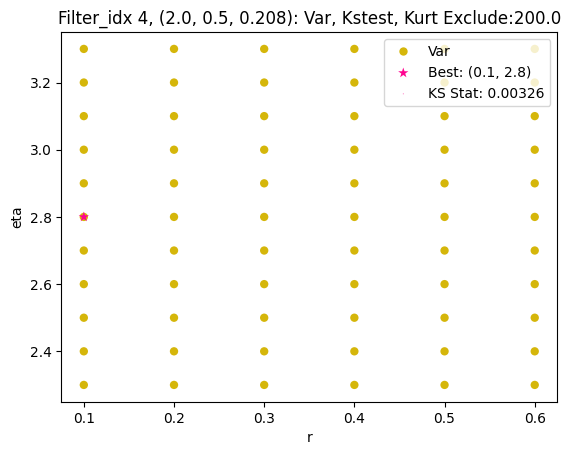

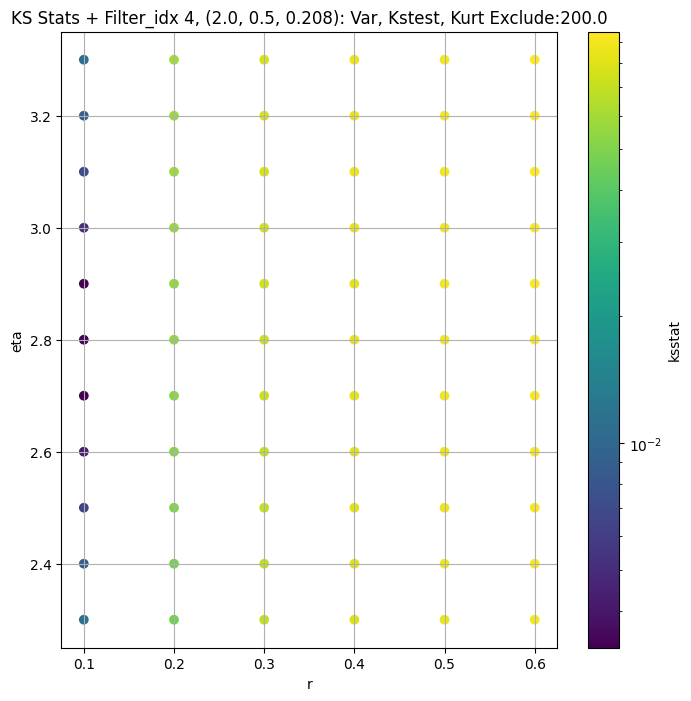

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.016948500175516745 0.9488489


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.008913611889109316 0.6364044


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.006073522629339301 0.5687585


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.003788829422539164 0.4990813
Number of samples: 100000, Without approximation : 262144000.0


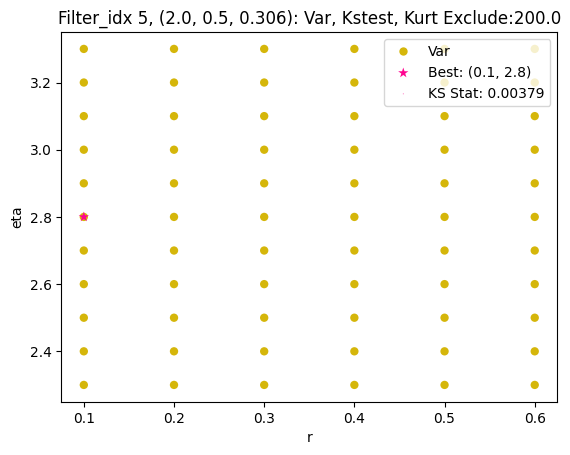

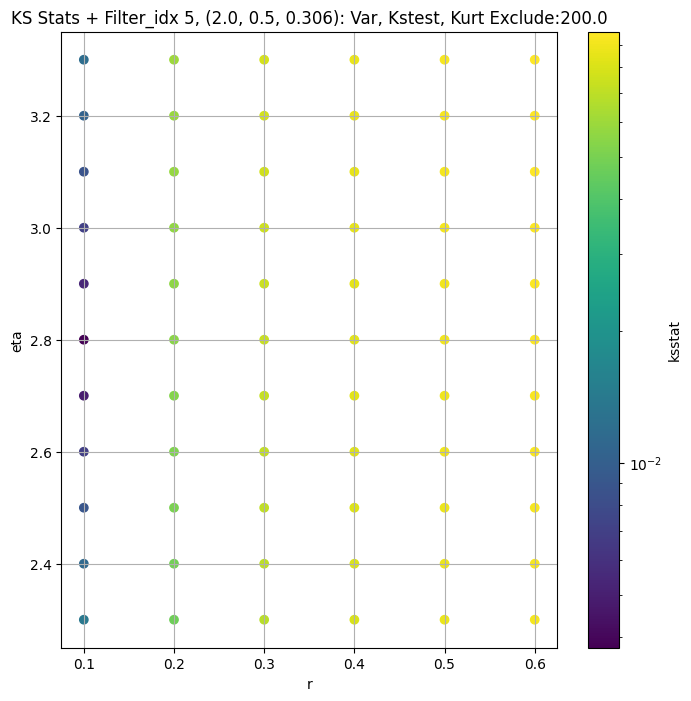

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.019858751290090196 0.5441682


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.009085902848096183 0.3404801


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.006514925627250867 0.30070615


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.0034855020035184925 0.25870714
Number of samples: 100000, Without approximation : 262144000.0


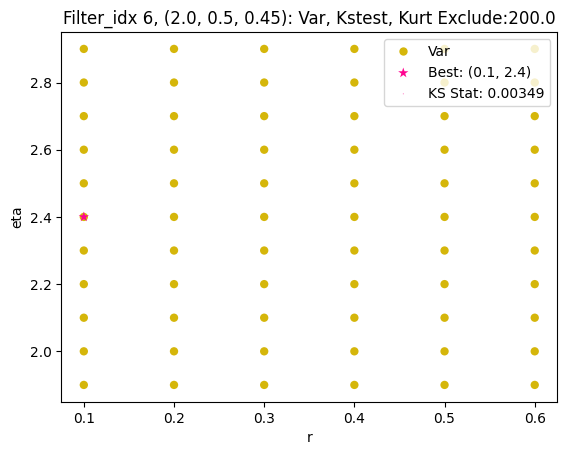

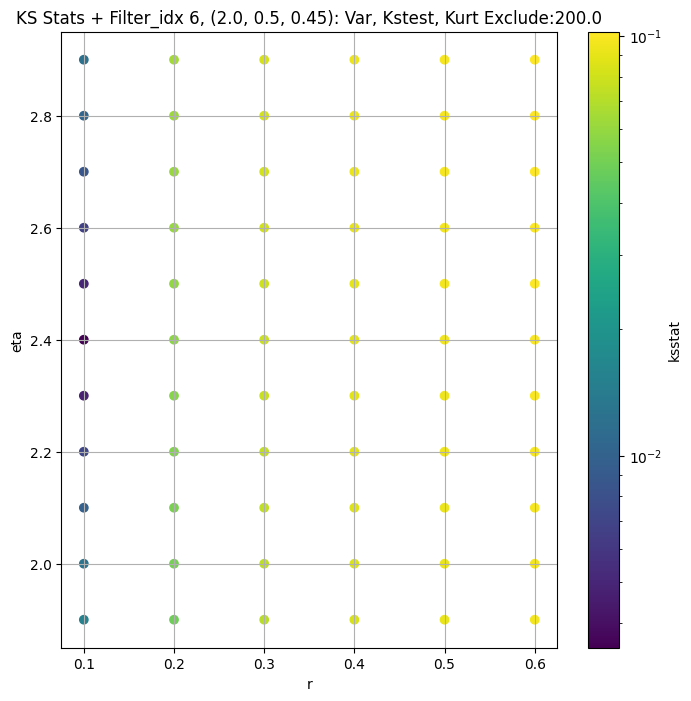

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.015374269554331133 96.786


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.003971882362160298 59.89807


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.0015875864288894537 54.414635


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.003038850998696163 48.499115
Number of samples: 100000, Without approximation : 262144000.0


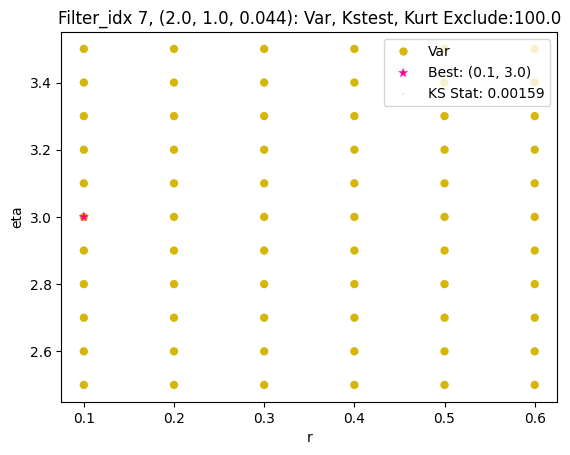

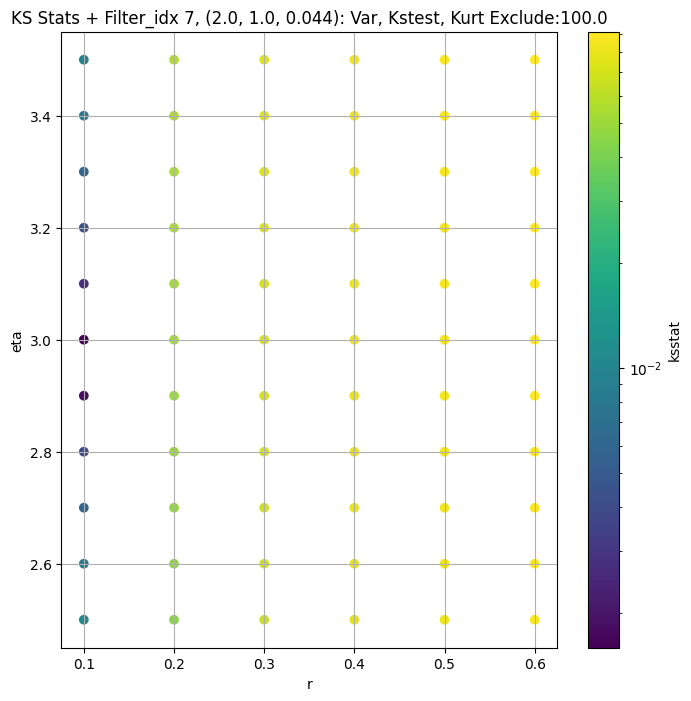

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.0121575920428173 51.278526


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.0023473685287024315 34.460594


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.0020188070463902363 31.56847


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.0031635686250055476 28.343752
Number of samples: 100000, Without approximation : 262144000.0


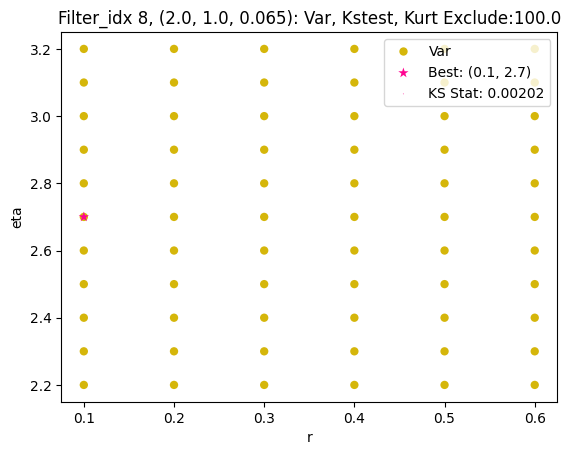

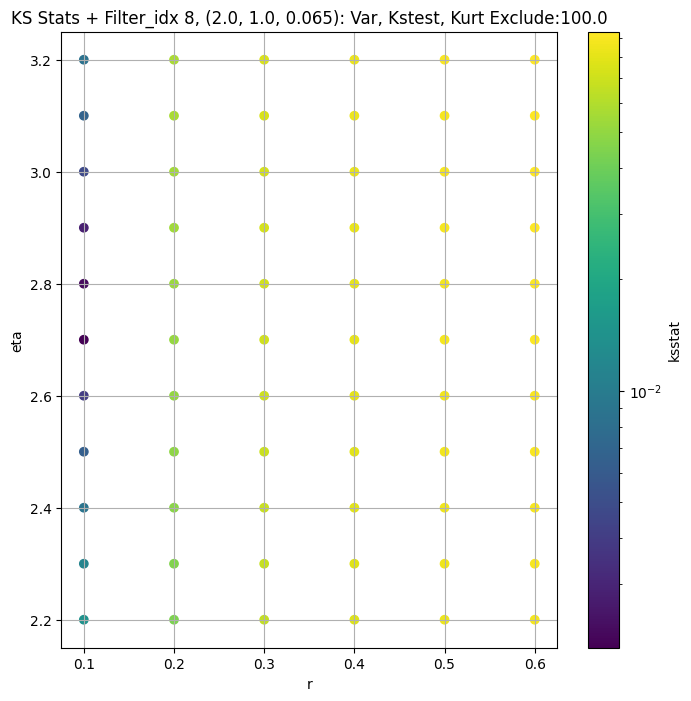

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.01515417368928397 31.001406


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.003173692871288547 19.020502


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.0016418491089672527 16.932318


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.003109272379318684 15.006648
Number of samples: 100000, Without approximation : 262144000.0


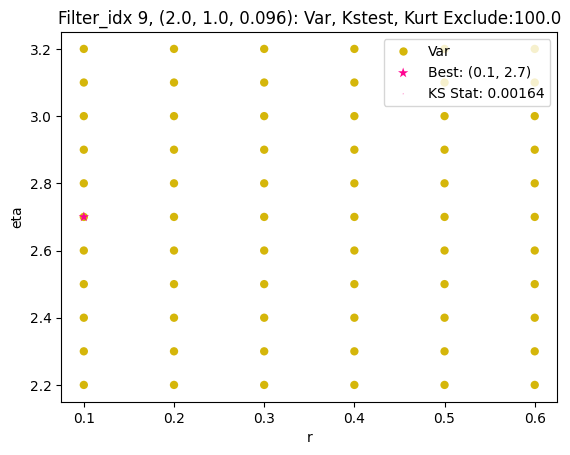

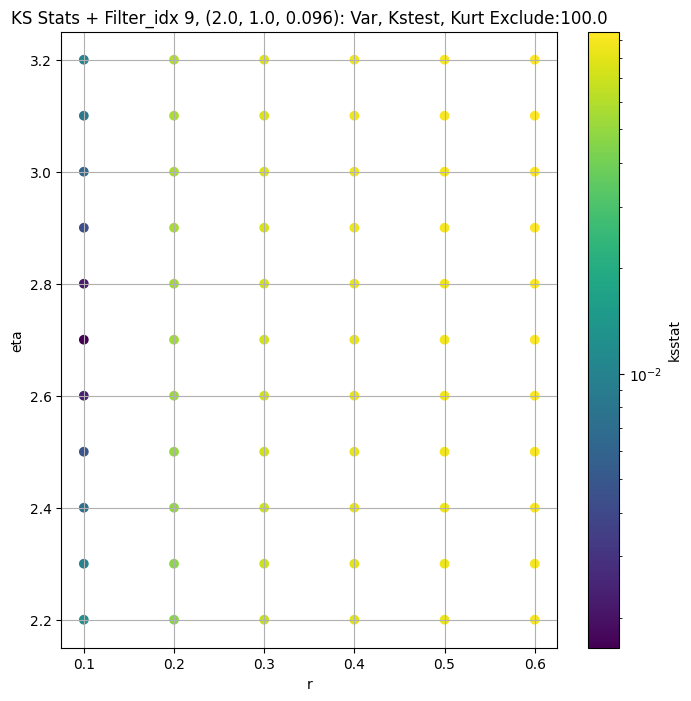

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.0043381275085193904 10.070579


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.0012714170606353825 8.286583


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.002141665541634835 7.7758975


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.0037187901951657443 7.13255
Number of samples: 100000, Without approximation : 262144000.0


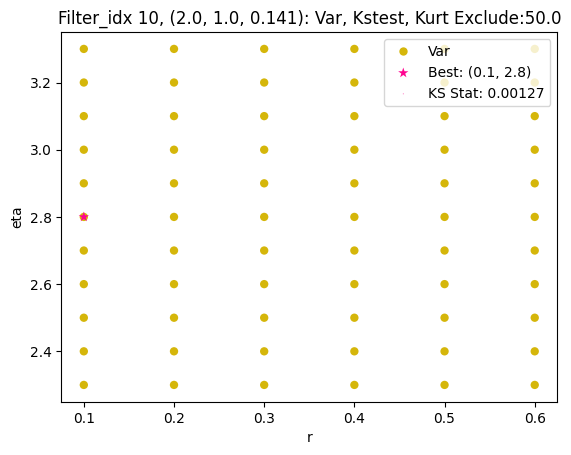

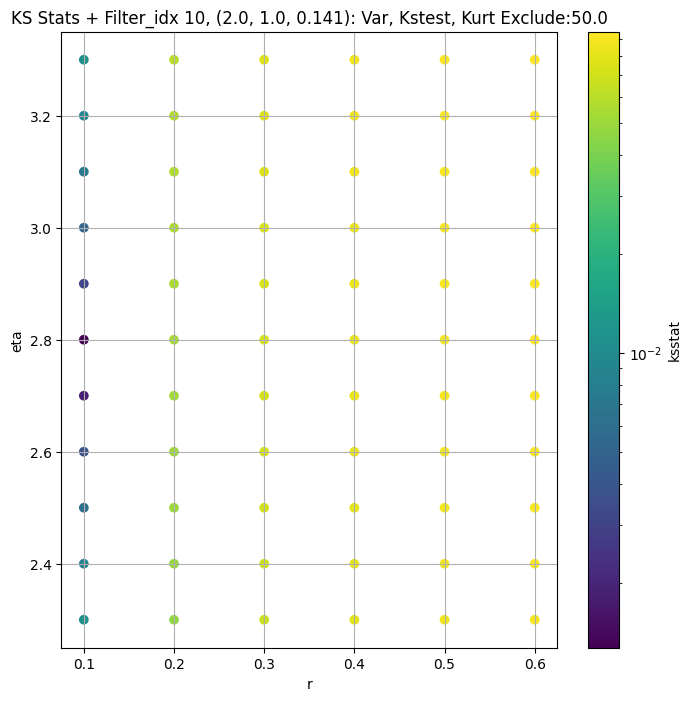

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.010459314922593665 4.6992517


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.0029458013230029972 3.5098374


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.0017244390765911444 3.231768


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.0030907447797221543 2.8987129
Number of samples: 100000, Without approximation : 262144000.0


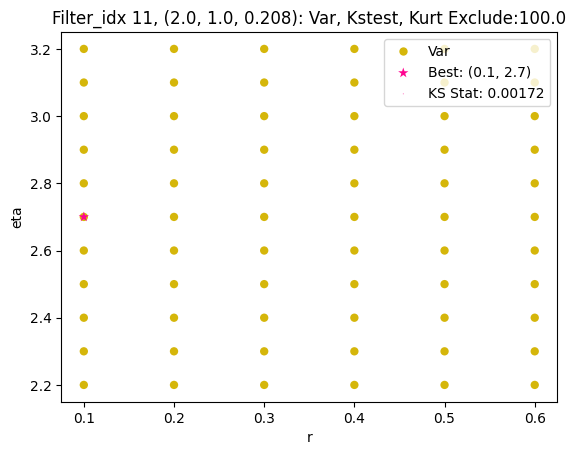

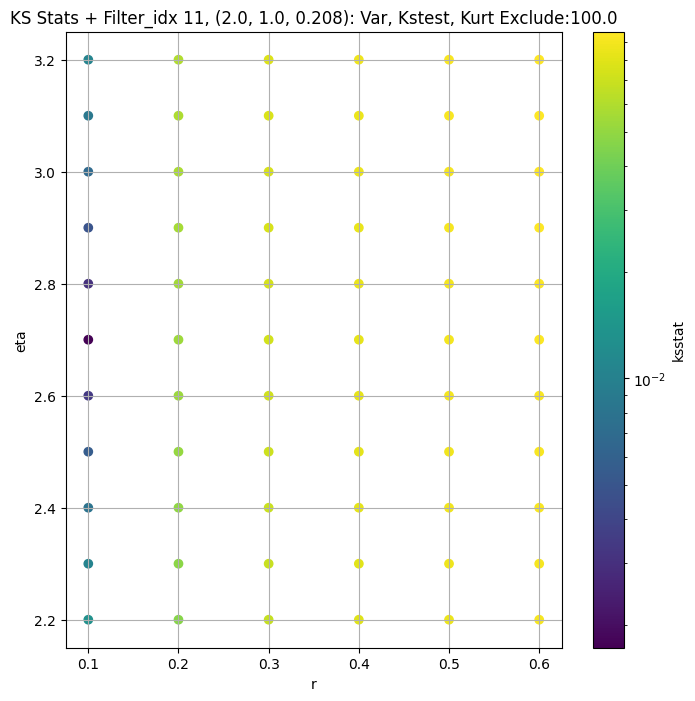

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.021671482392734157 2.0284362


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.006846482828666248 1.0916017


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.0036722945124043616 0.9448181


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.003123503086255308 0.8193546
Number of samples: 100000, Without approximation : 262144000.0


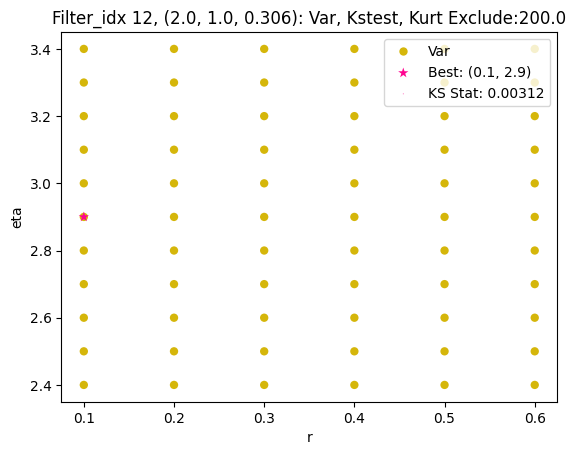

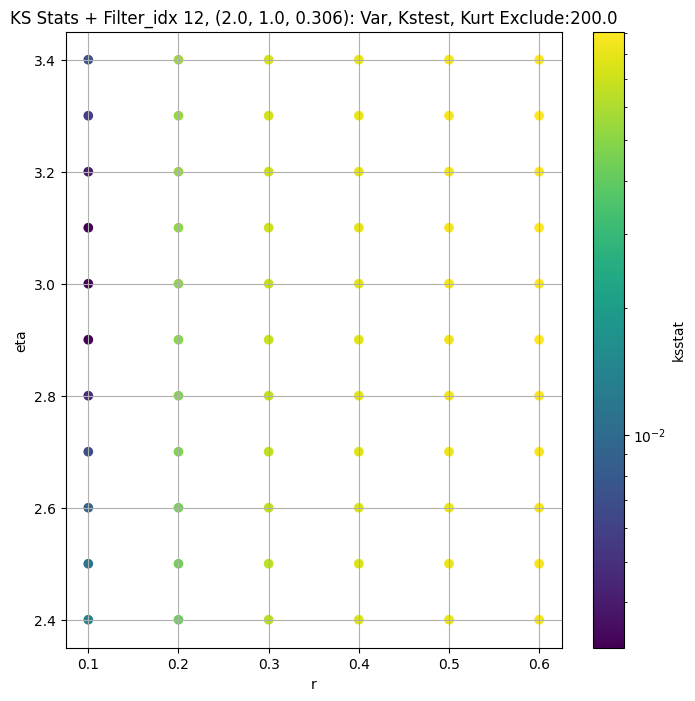

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.027325451220322927 0.861887


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.012383091203676866 0.40190193


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.009014483494516168 0.33720613


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.004787436571079717 0.27893844
Number of samples: 100000, Without approximation : 262144000.0


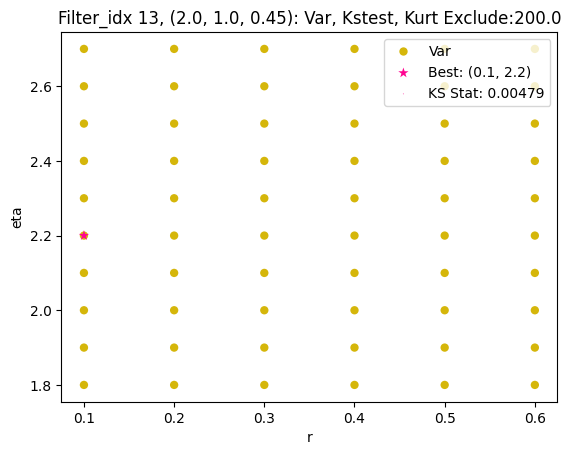

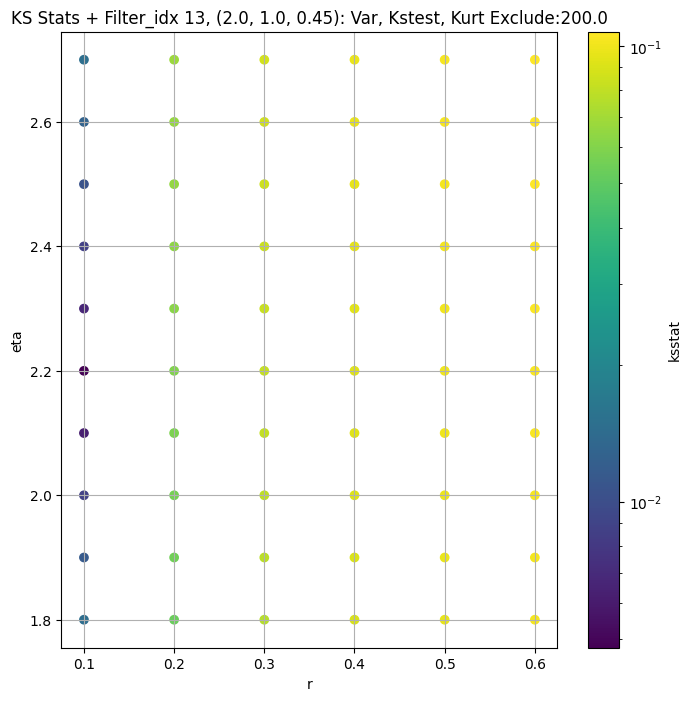

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.01924097710878142 106.59744


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.0069740117389772704 61.392414


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.0031091762778228116 53.852955


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.002924795878353592 46.65258
Number of samples: 100000, Without approximation : 262144000.0


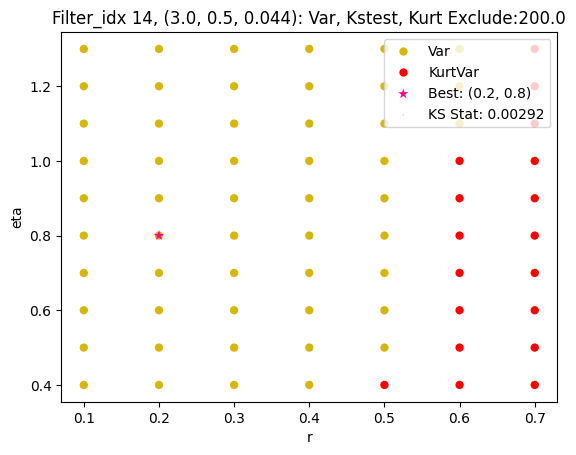

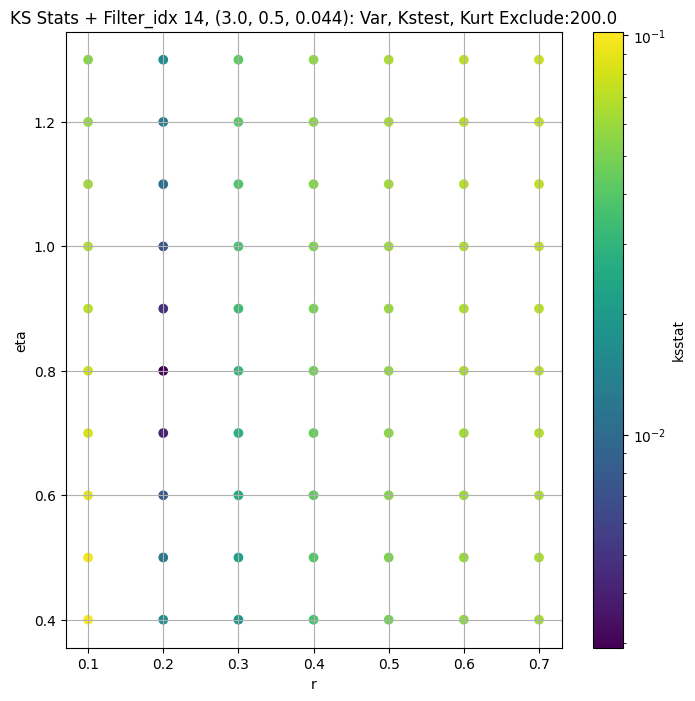

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.021835278951863532 65.65461


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.006893383469745981 35.19546


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.003052207717291644 29.77132


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.0026541536510793495 25.185068
Number of samples: 100000, Without approximation : 262144000.0


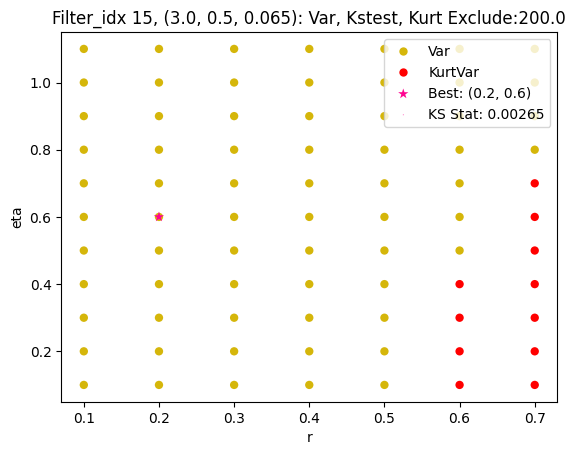

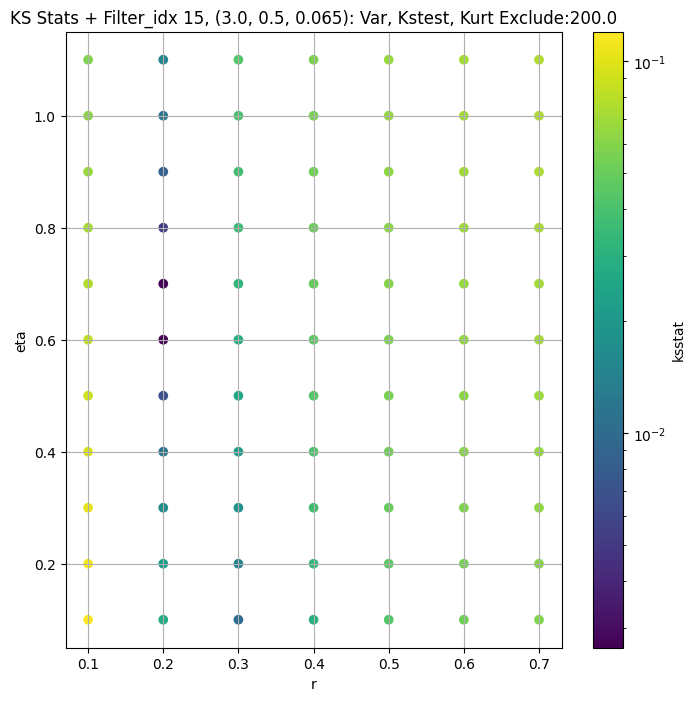

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.008167356810000803 21.175714


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.0013760071441978328 15.653151


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.0016093708621119545 14.4540615


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.003208893134830363 13.059568
Number of samples: 100000, Without approximation : 262144000.0


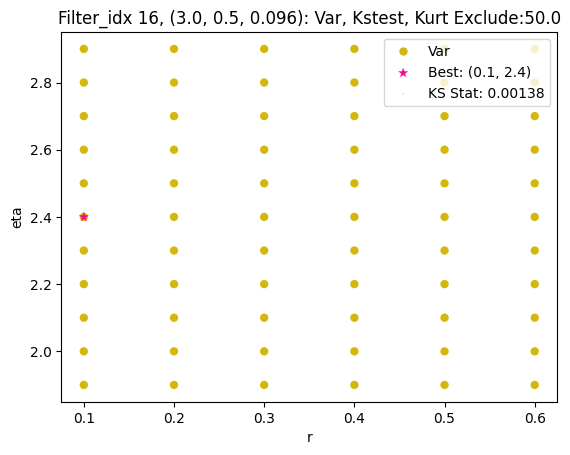

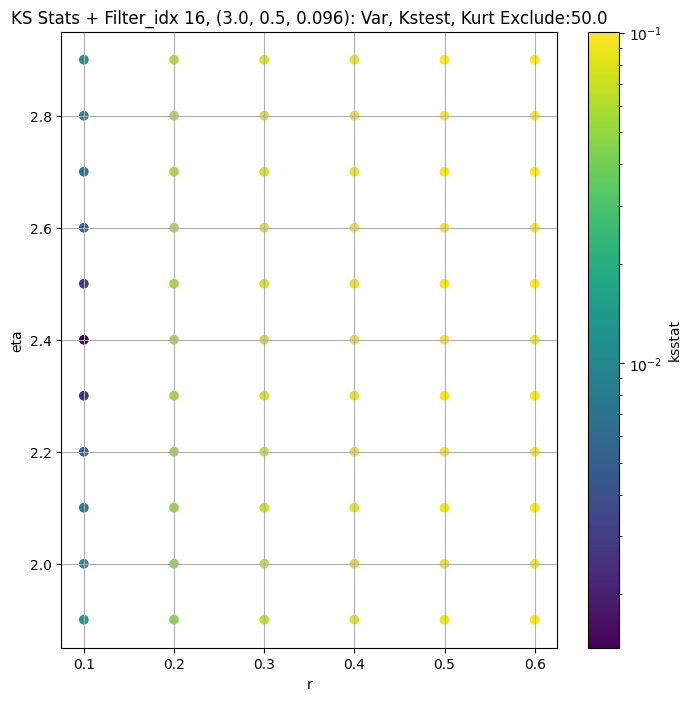

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.004309961385331018 7.996752


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.002614439989069073 6.850294


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.0035881595824244356 6.42876


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.004357312766781751 5.867854
Number of samples: 100000, Without approximation : 262144000.0


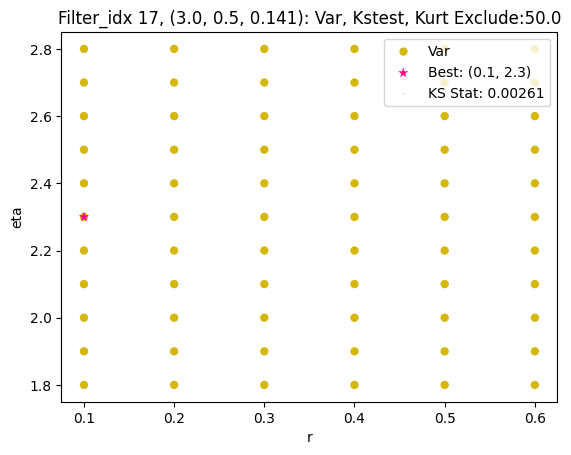

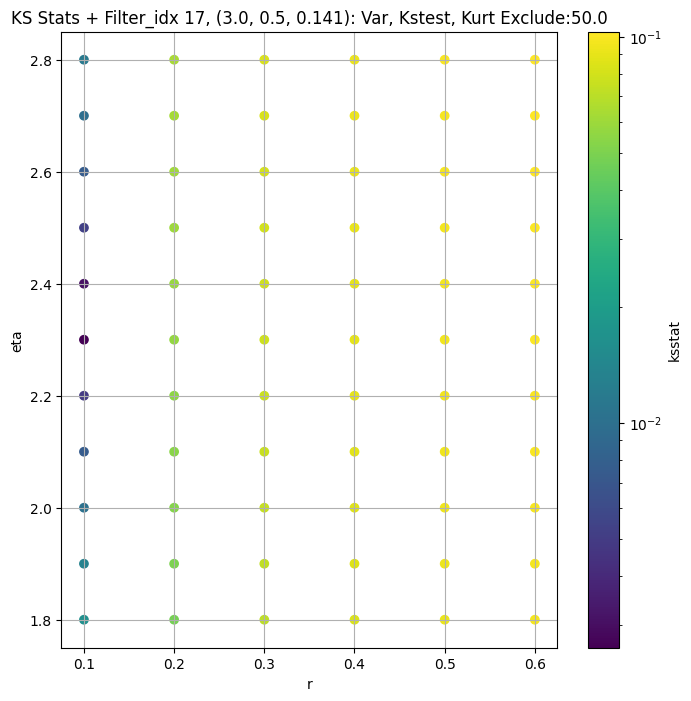

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.02188858187349174 4.184376


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.010115709584278196 2.520762


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.006944475803335612 2.190691


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.003173406965632758 1.85027
Number of samples: 100000, Without approximation : 262144000.0


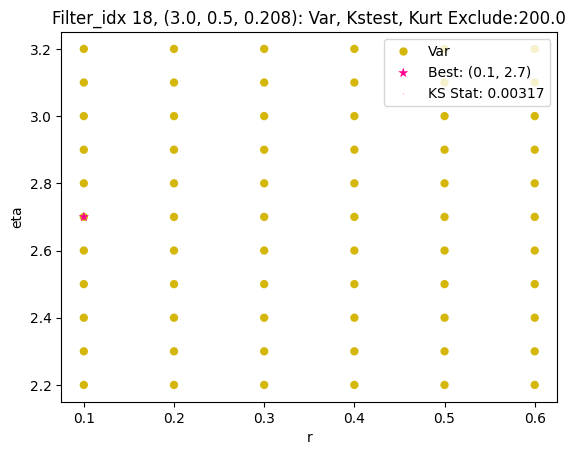

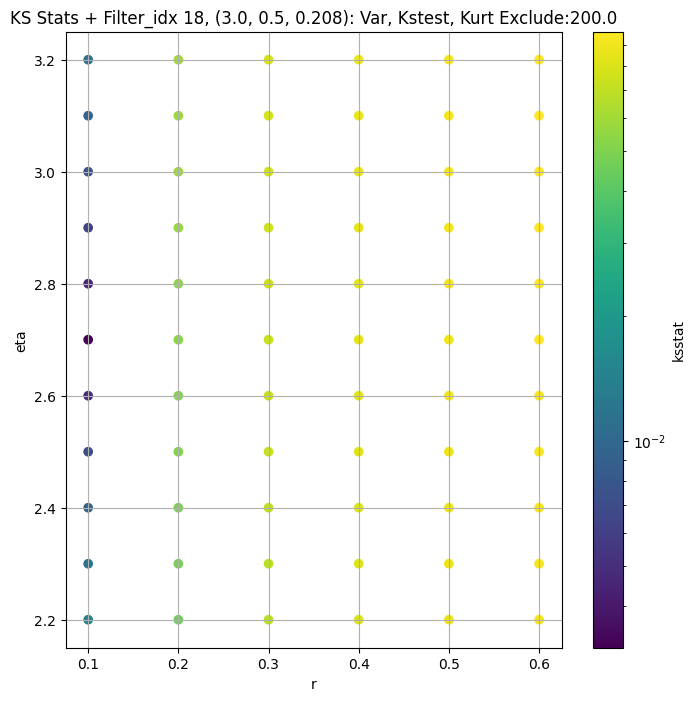

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.025013830114033686 1.3095968


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.014592289672860415 0.7765264


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.011796869035617275 0.6614713


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.00797594181763725 0.54589754
Number of samples: 100000, Without approximation : 262144000.0


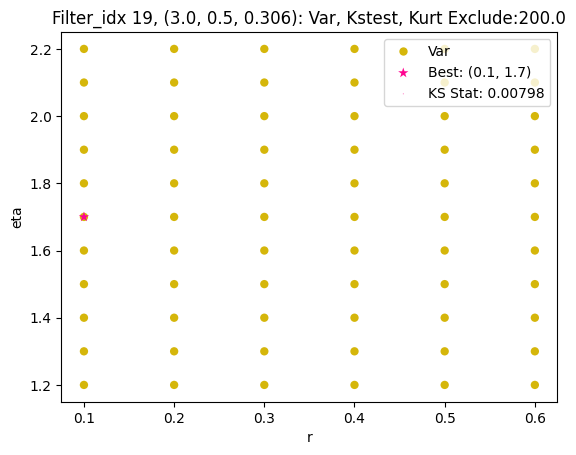

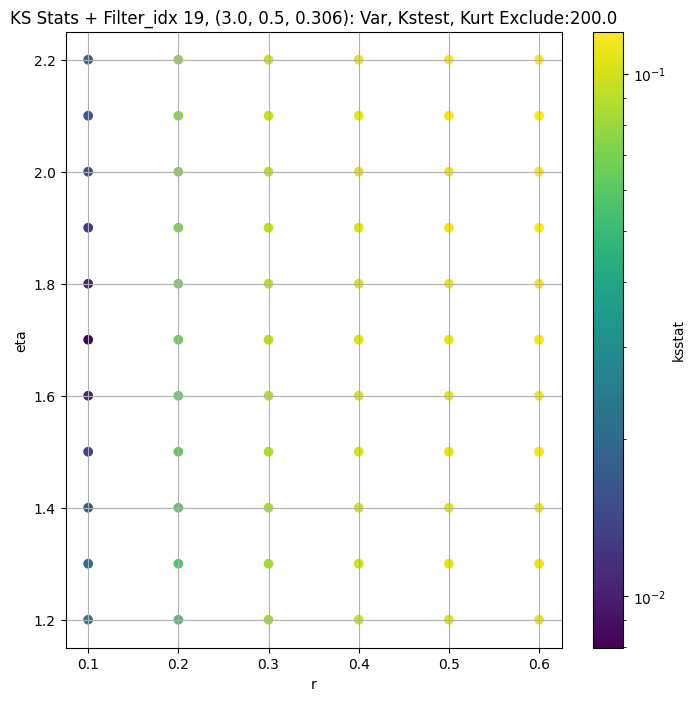

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.0314896122875058 0.3795602


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.014398343270276726 0.1696254


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.011952428495878811 0.14493728


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.0088613620890865 0.12059588
Number of samples: 100000, Without approximation : 262144000.0


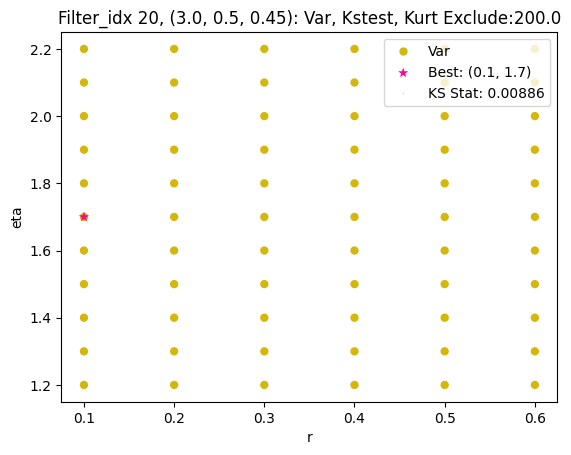

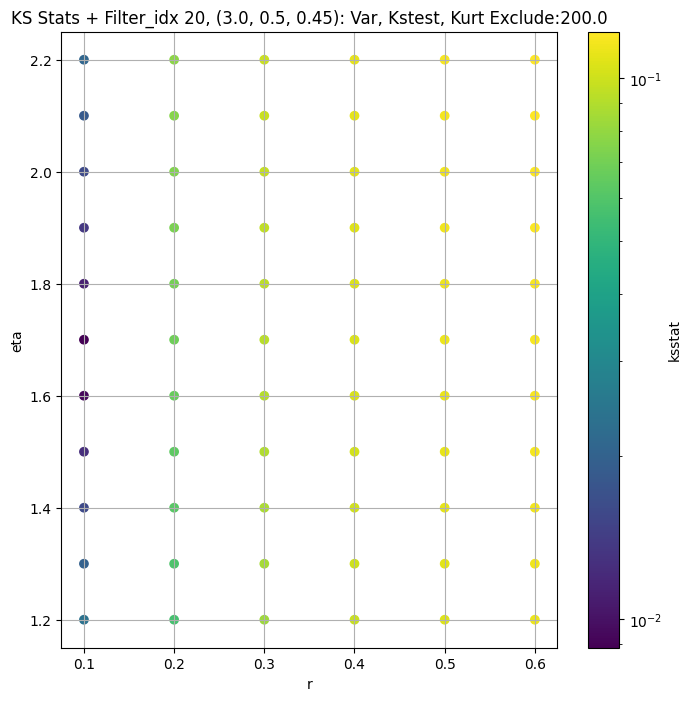

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.015417681765344887 90.02466


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.005570202666134408 61.04054


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.0026650256880321327 54.491344


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.0030316373503361804 47.712257
Number of samples: 100000, Without approximation : 262144000.0


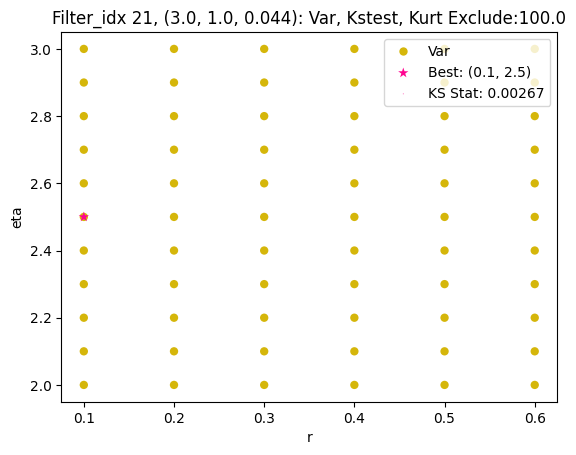

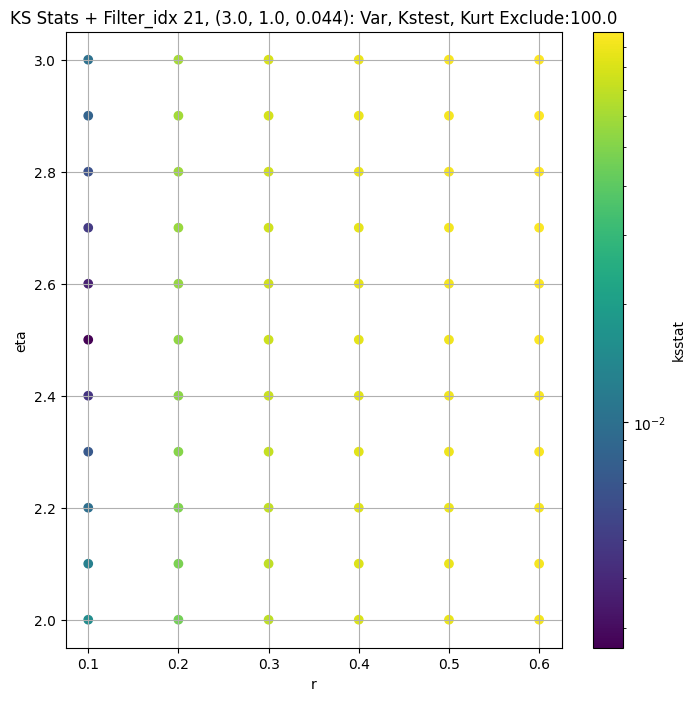

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.02123305120286023 69.35093


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.007256804465464506 38.160877


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.0032655565922214136 33.32173


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.0027807932572784244 28.551712
Number of samples: 100000, Without approximation : 262144000.0


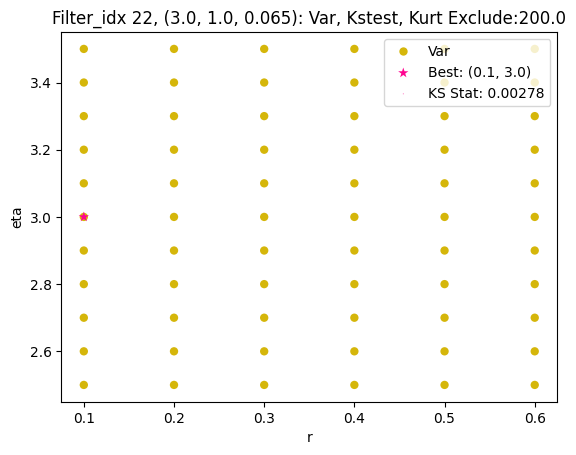

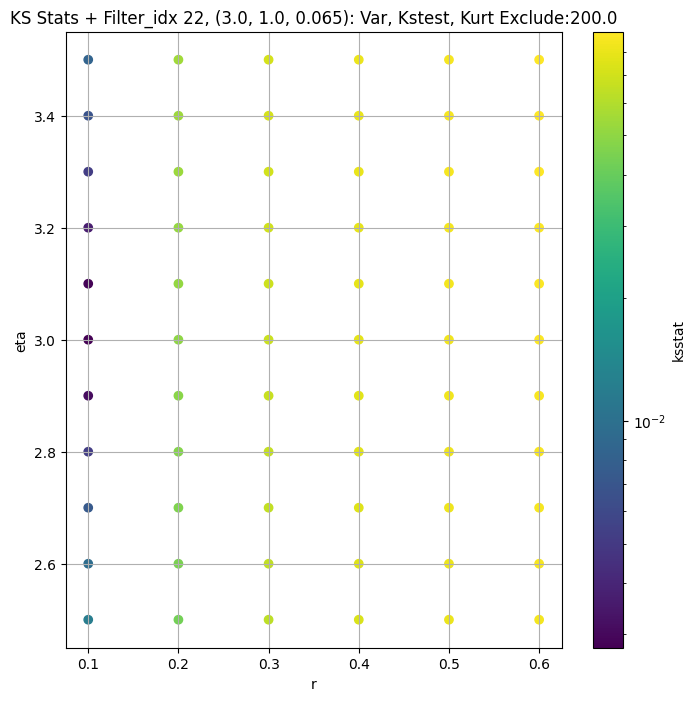

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.029831504469727932 59.833294


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.004970647568603437 20.31887


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.001675707756114031 17.292667


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.0031292746148166017 15.125155
Number of samples: 100000, Without approximation : 262144000.0


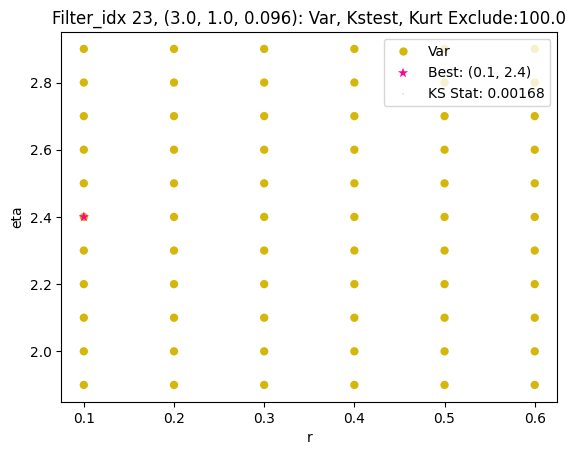

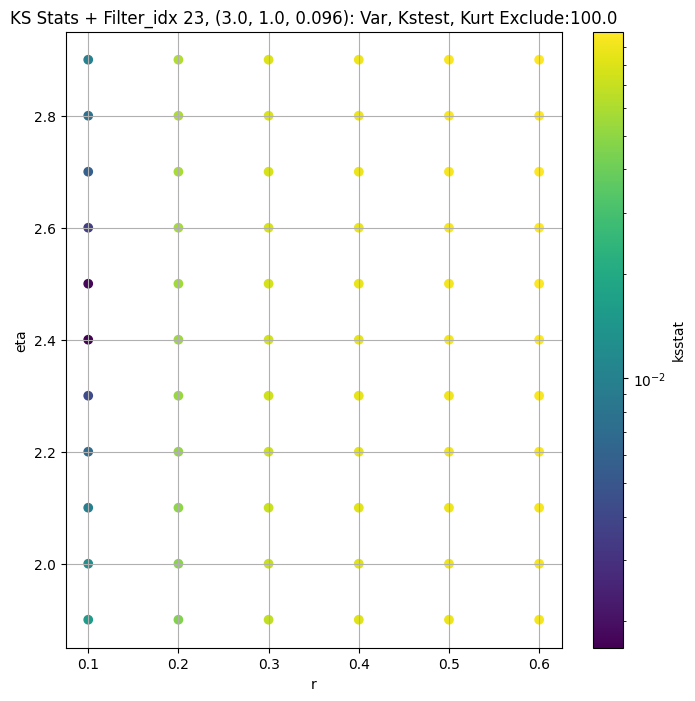

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.017094323034880454 14.663283


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.0058025558690286 8.517215


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.0026571560440473985 7.4585247


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.0038862938476300624 6.6337376
Number of samples: 100000, Without approximation : 262144000.0


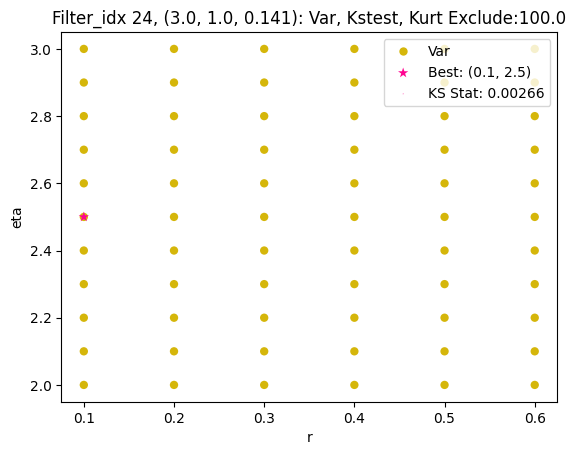

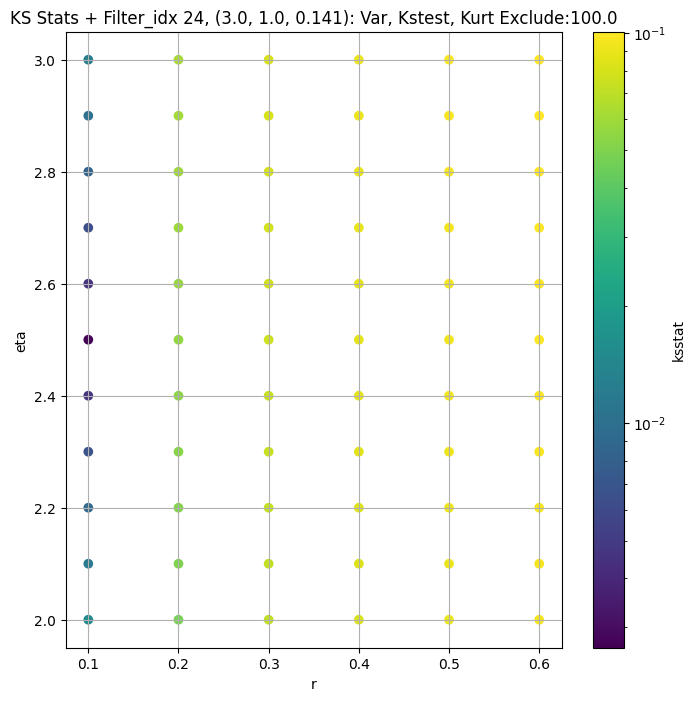

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.03429778427452035 10.27314


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.015503819270242025 3.9656105


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.009171272602801372 2.9757764


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.0036703237401849442 2.3014154
Number of samples: 100000, Without approximation : 262144000.0


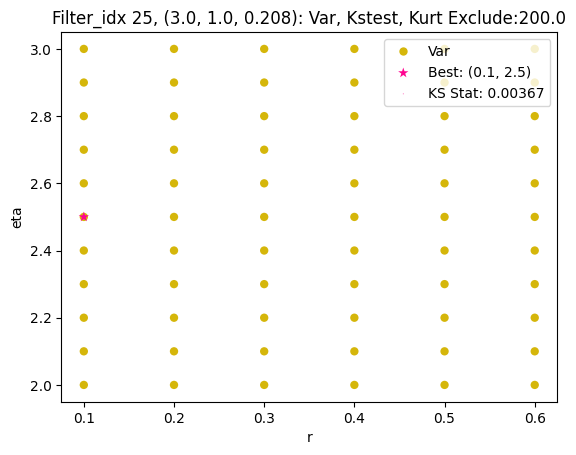

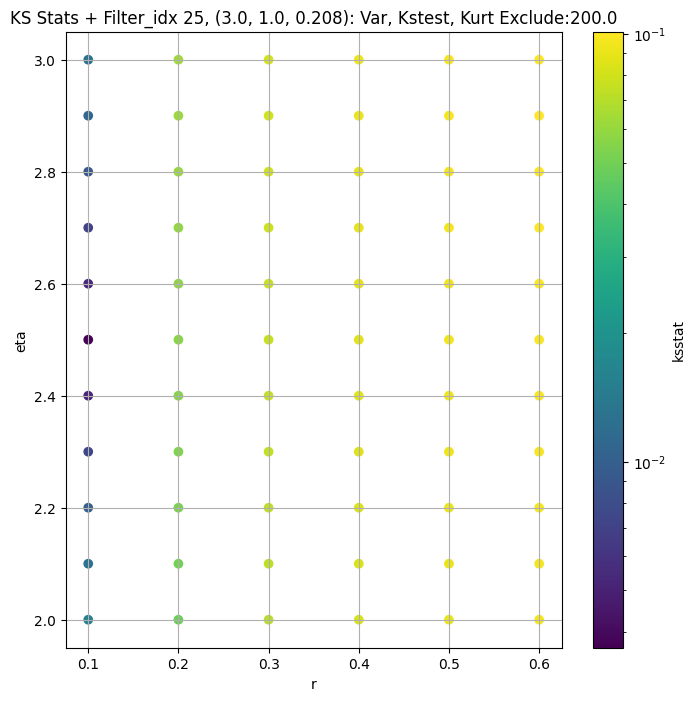

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.02129457577302718 1.2712631


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.007310677388531417 0.66225064


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.005577596842308352 0.5937251


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.003975215707963886 0.52461517
Number of samples: 100000, Without approximation : 262144000.0


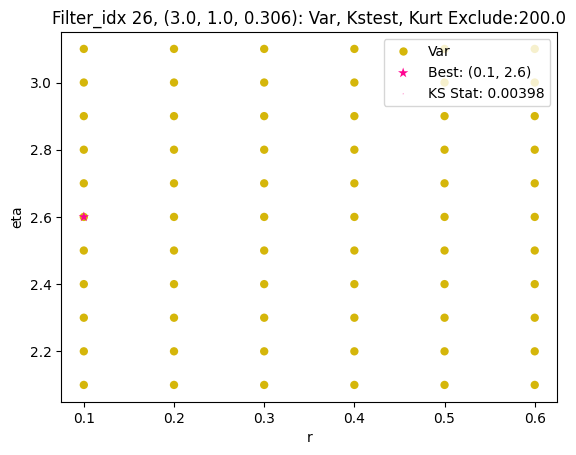

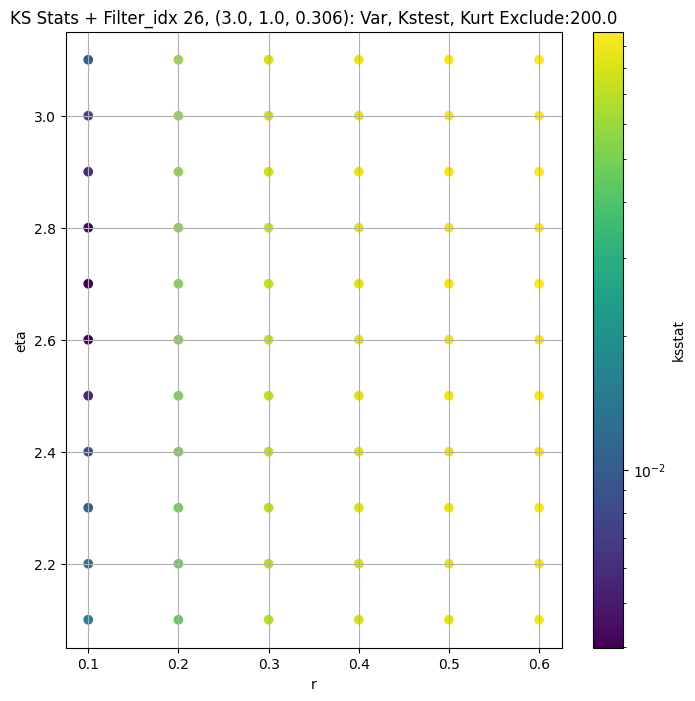

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.027910845582934718 0.2943504


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.011564463858054735 0.13274539


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.008919252207482353 0.115688294


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.006260956600969342 0.09992444
Number of samples: 100000, Without approximation : 262144000.0


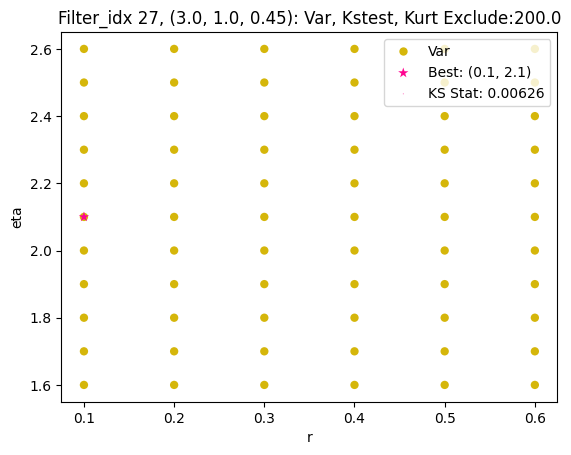

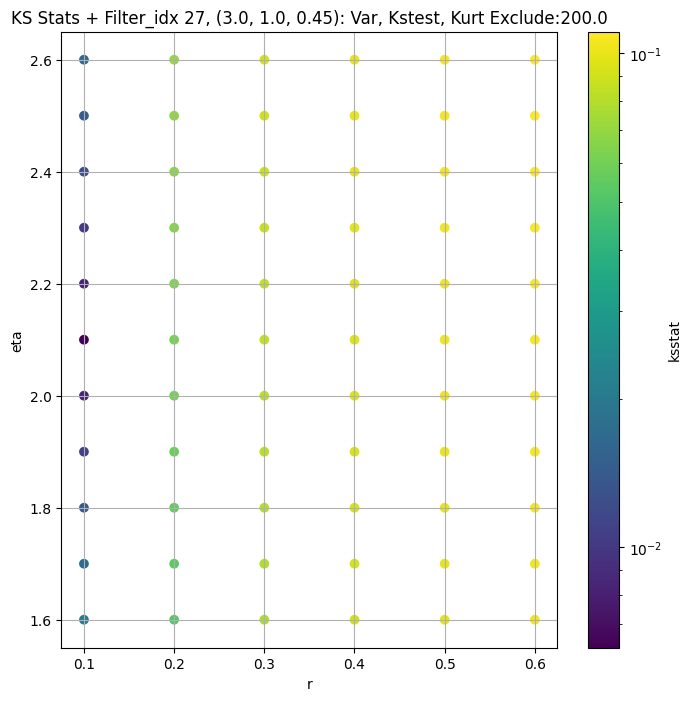

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.01150631661009982 72.07771


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.0020333582896074343 50.397446


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.001596028959345656 46.2383


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.0032933316782540745 41.800556
Number of samples: 100000, Without approximation : 262144000.0


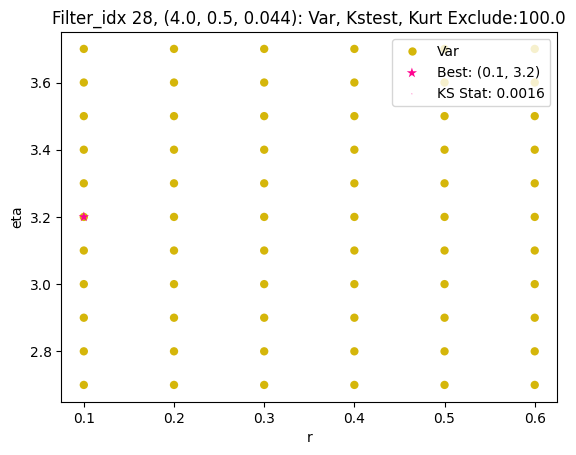

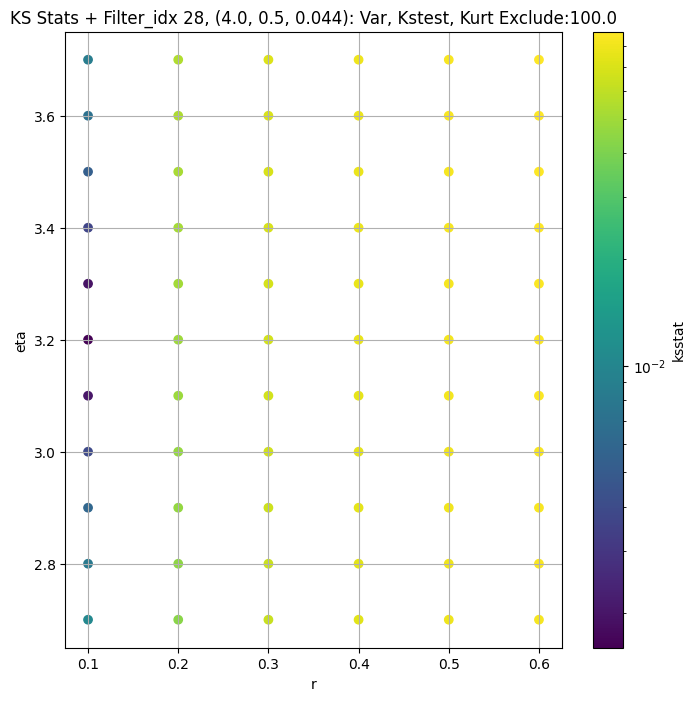

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.014557390654616587 42.39347


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.001781482118537181 25.720173


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.0017130970241207022 23.622921


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.003318589559799582 21.460579
Number of samples: 100000, Without approximation : 262144000.0


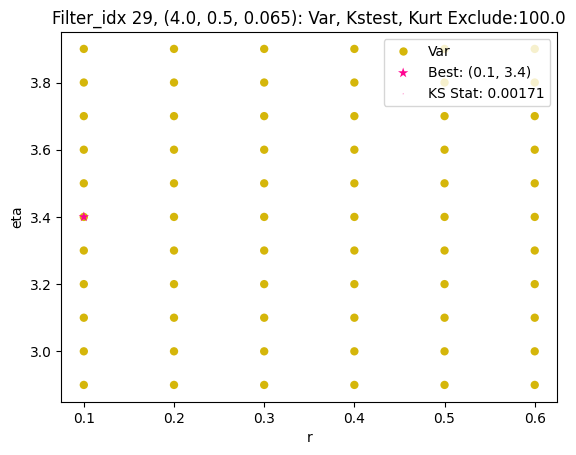

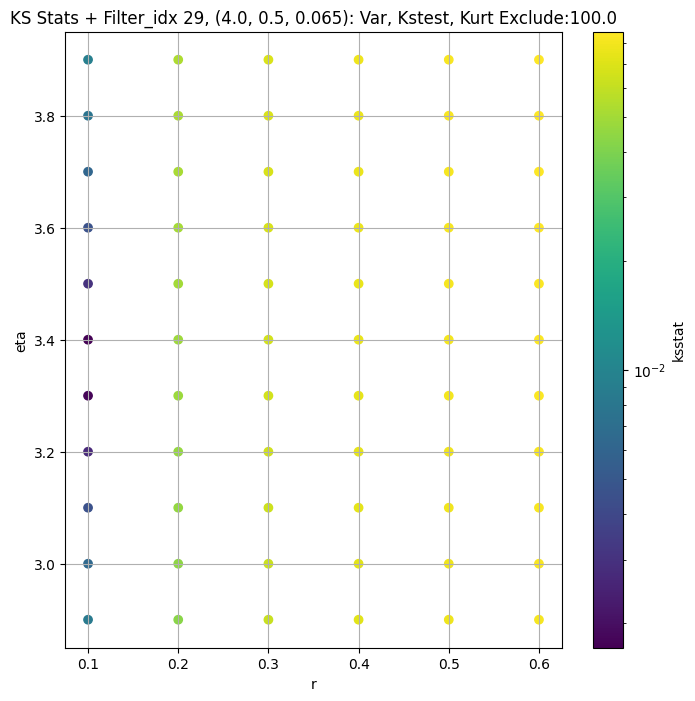

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.0018795056737702653 16.312197


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.002377036185221615 13.547257


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.0027026129483951333 12.8772745


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.00436982649957951 11.980555
Number of samples: 100000, Without approximation : 262144000.0


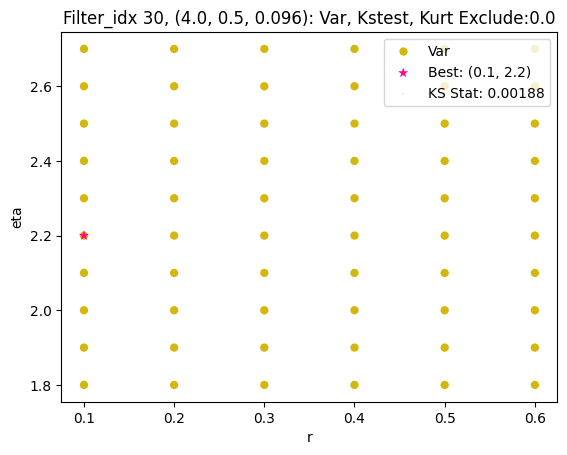

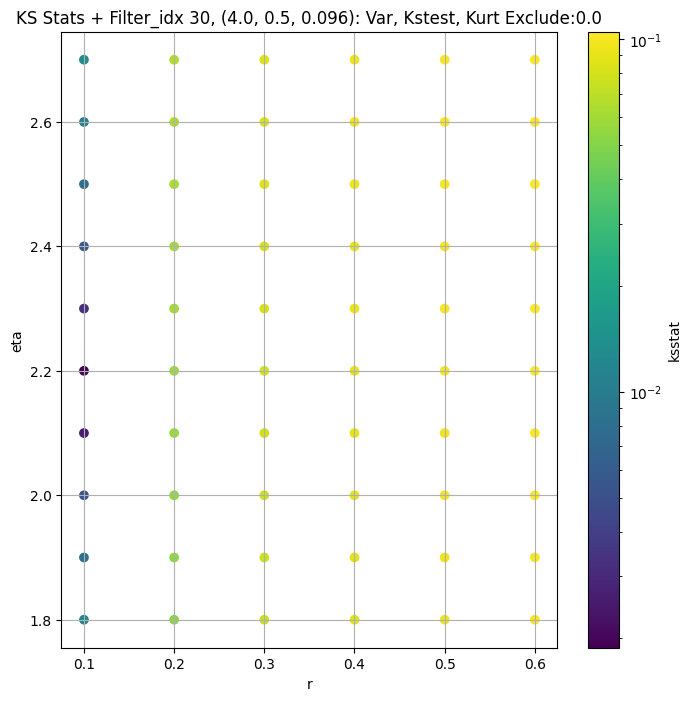

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.032323322632224594 32.59408


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.008917512086796475 9.2620735


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.0047575137898788755 7.7582803


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.004060672204831861 6.667716
Number of samples: 100000, Without approximation : 262144000.0


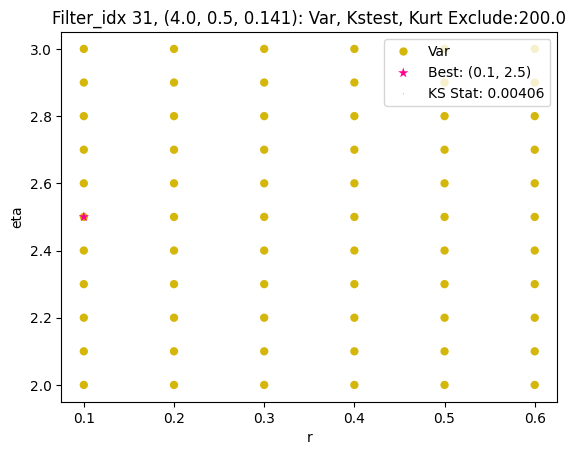

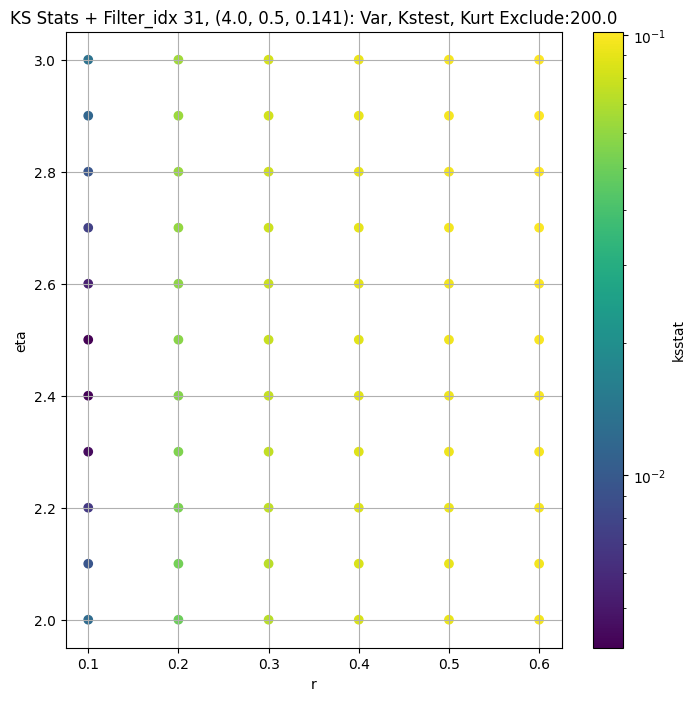

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.025935471669937926 4.7876205


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.01405122046220919 2.6856263


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.009425567776648935 2.2590563


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.006111222357121027 1.8461004
Number of samples: 100000, Without approximation : 262144000.0


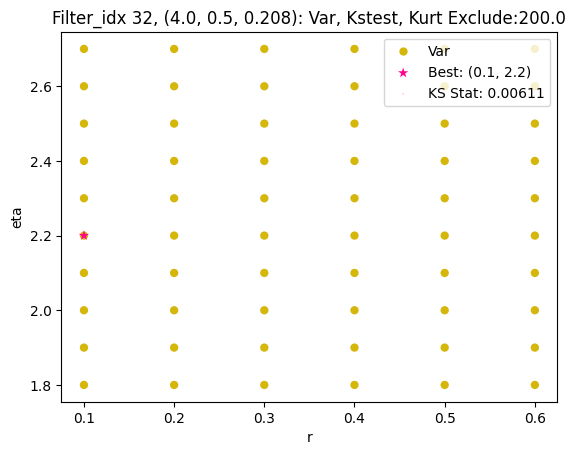

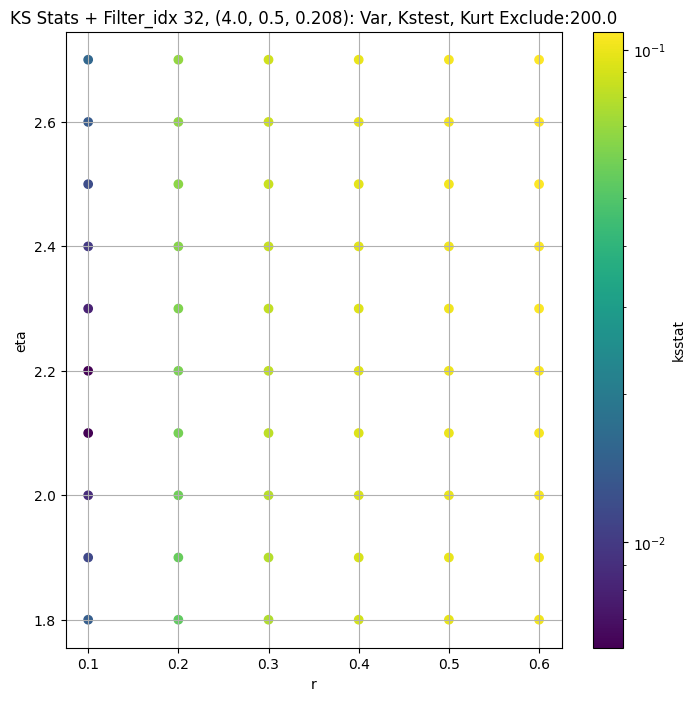

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.022756821791405757 0.9367675


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.012146167181132816 0.56611747


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.010513929714270565 0.49173778


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.006766244148520895 0.4163188
Number of samples: 100000, Without approximation : 262144000.0


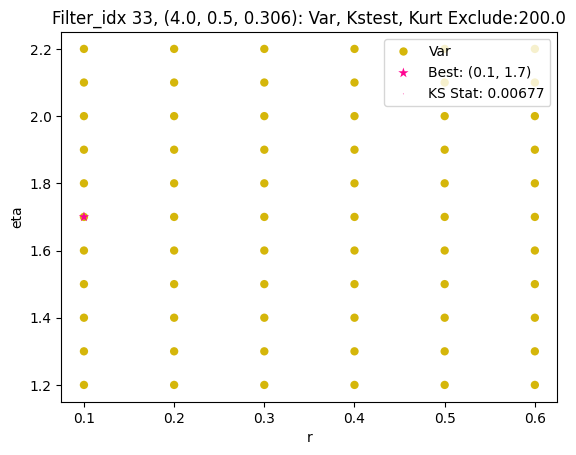

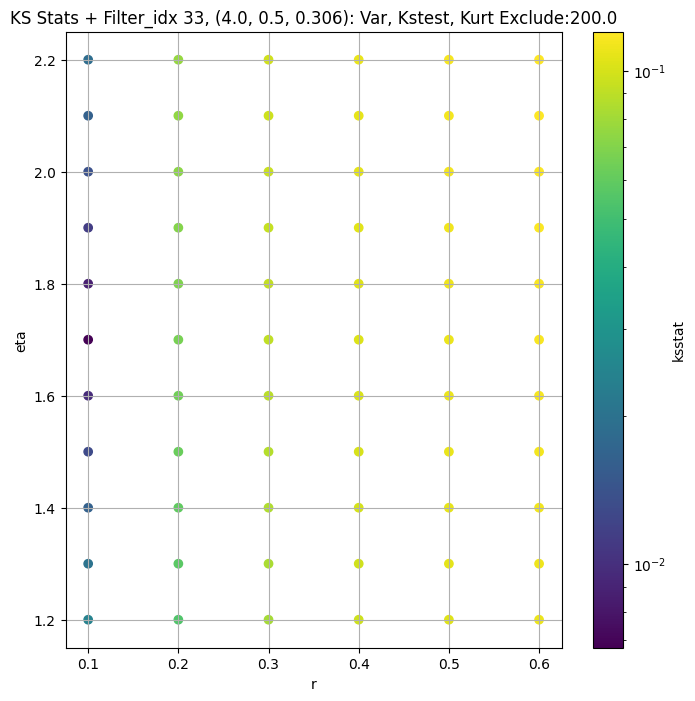

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.016651227131612045 0.08175987


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.009885494897958813 0.058486786


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.008489349983476502 0.05421889


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.006576991392377662 0.048836693
Number of samples: 100000, Without approximation : 262144000.0


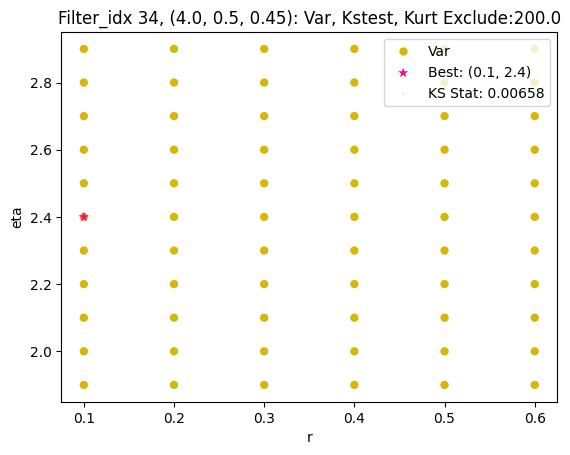

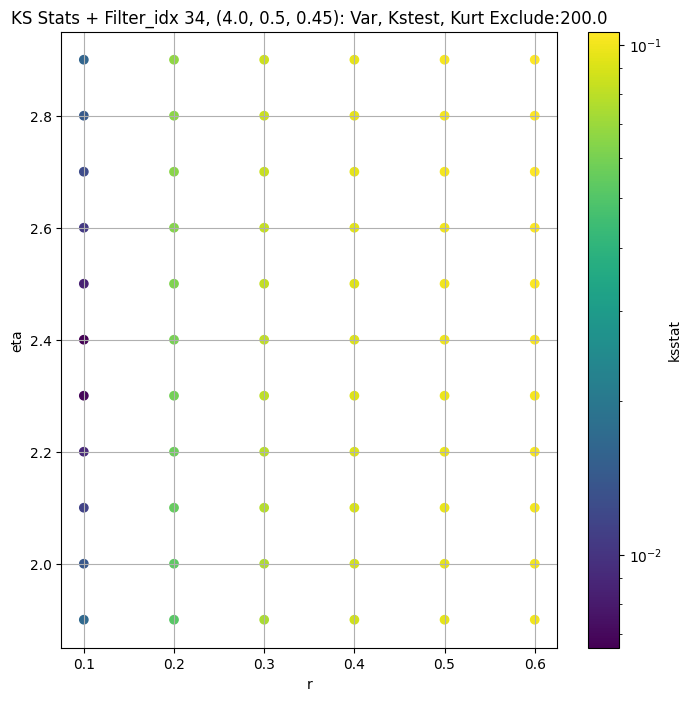

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.026770324468782913 142.07094


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.00988150797492178 63.43262


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.005625493994741659 54.297756


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.0028848718423248876 46.155453
Number of samples: 100000, Without approximation : 262144000.0


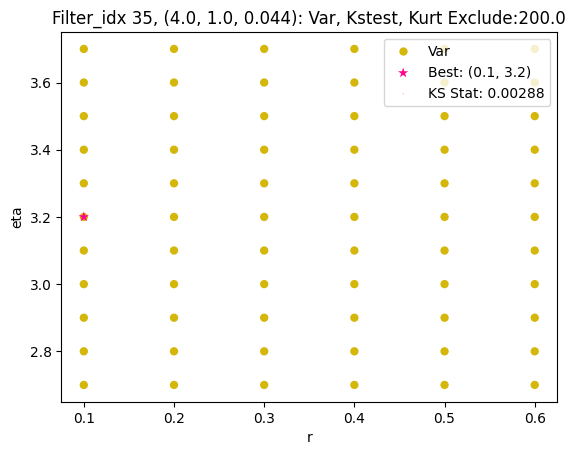

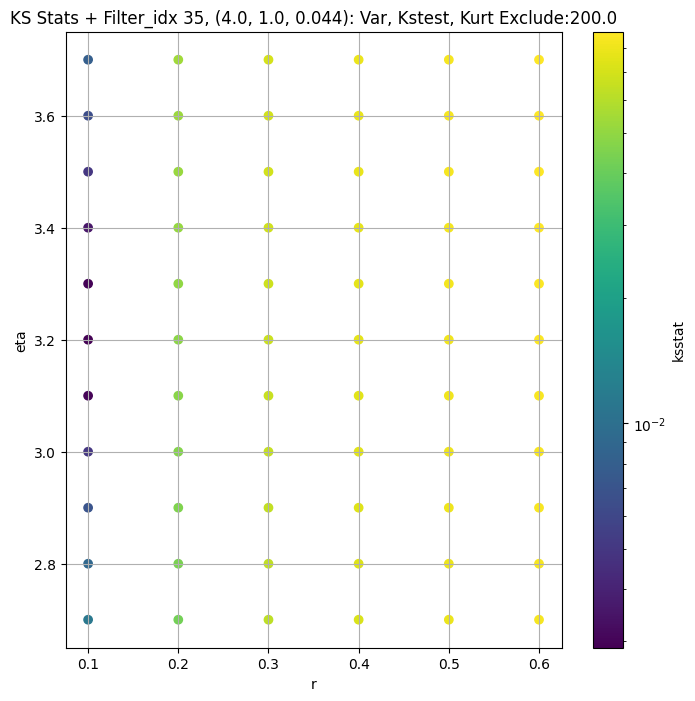

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.015064603471304575 48.49109


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.005269126509664393 31.792852


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.002136945675978996 28.782345


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.003045137950199006 25.414804
Number of samples: 100000, Without approximation : 262144000.0


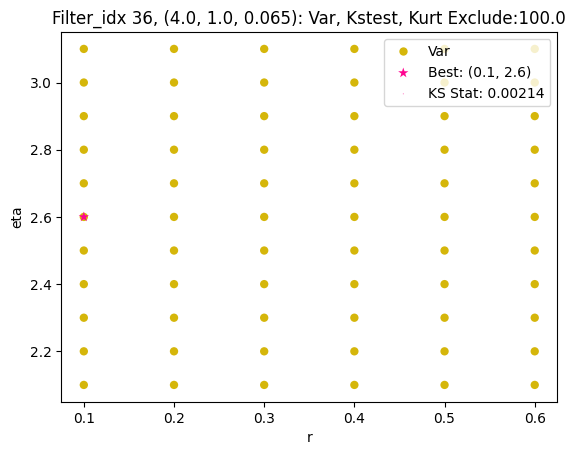

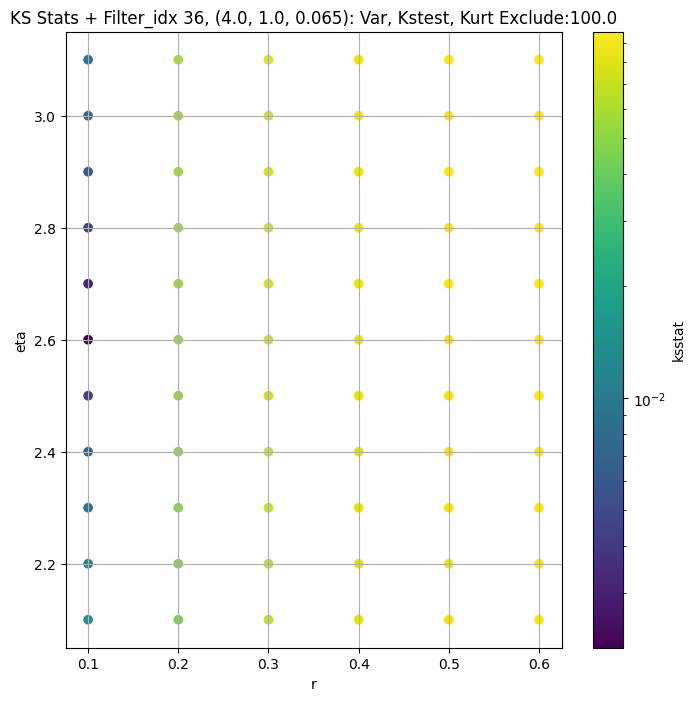

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.00670285115710946 18.180128


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.002330837228644772 15.276776


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.001960485370569684 14.301469


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.0032704171959924595 13.004505
Number of samples: 100000, Without approximation : 262144000.0


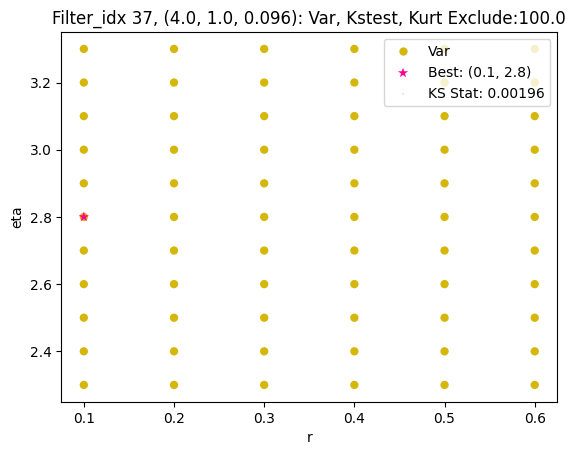

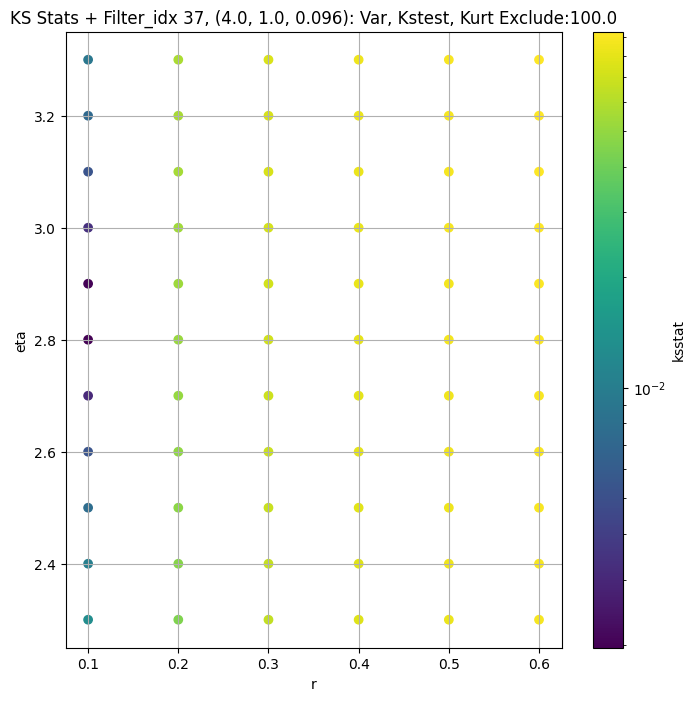

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.03044748272531561 24.82999


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.009218681690463693 8.818991


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.0051718137214876725 7.5853243


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.0036535901426645867 6.5256896
Number of samples: 100000, Without approximation : 262144000.0


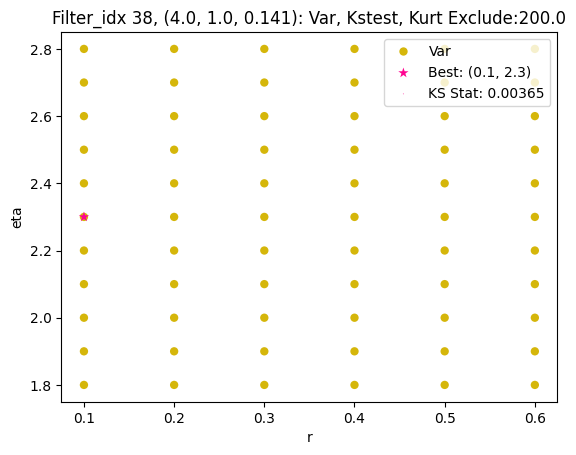

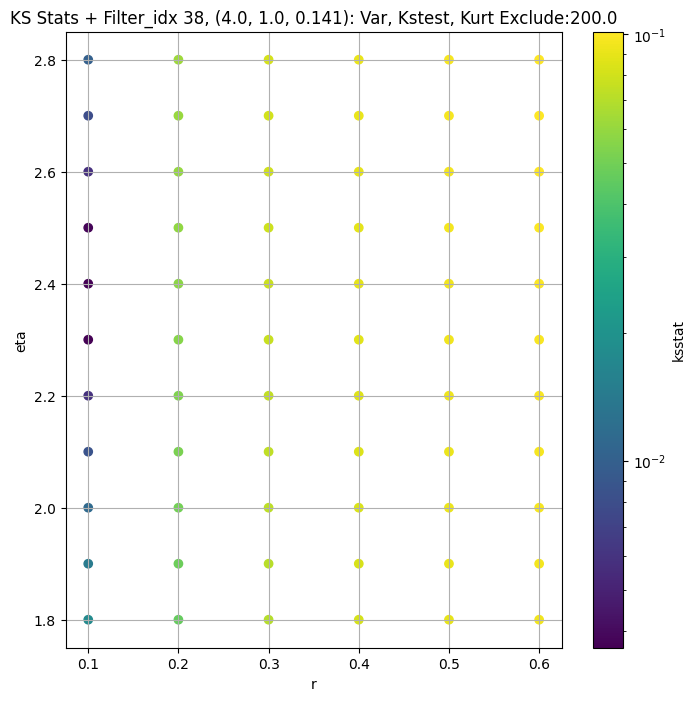

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.03452014099243805 8.022428


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.01368221054794272 2.8249393


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.00810410368186032 2.1864688


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.0032961886424546227 1.78032
Number of samples: 100000, Without approximation : 262144000.0


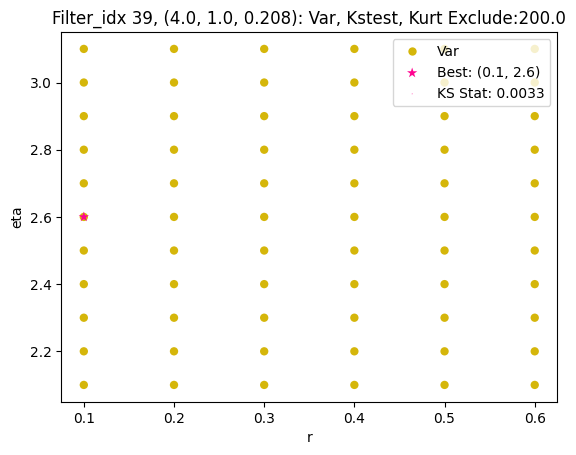

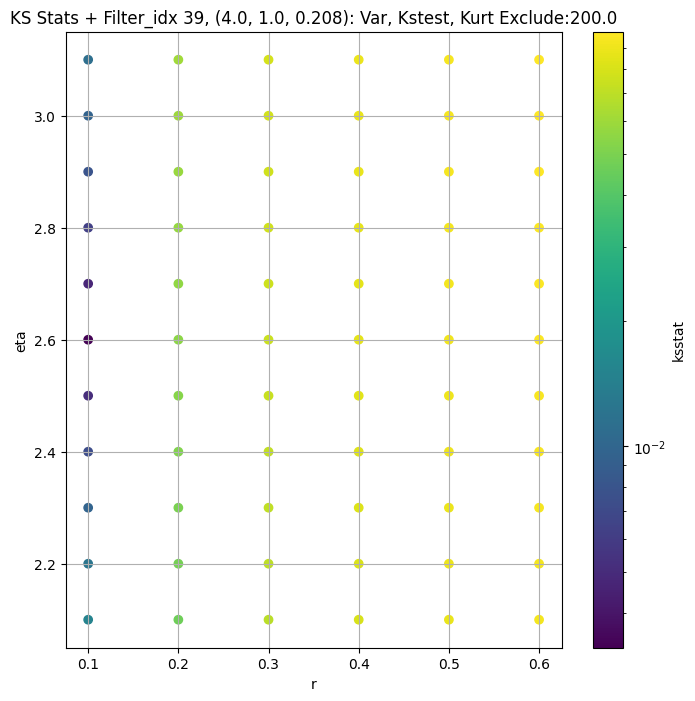

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.020040360530847845 1.0539438


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.009515988292193245 0.58235866


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.007165837954403176 0.508579


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.004055523040633391 0.43885067
Number of samples: 100000, Without approximation : 262144000.0


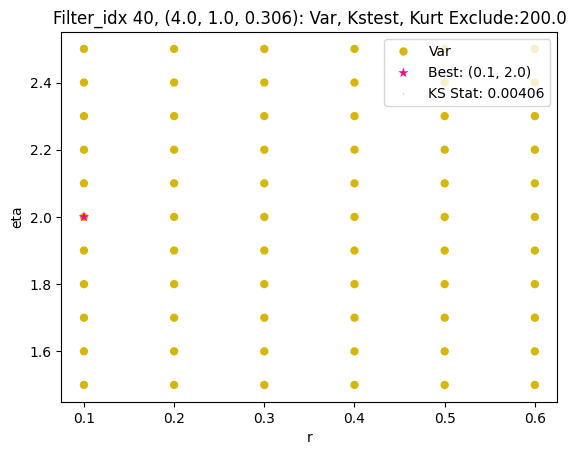

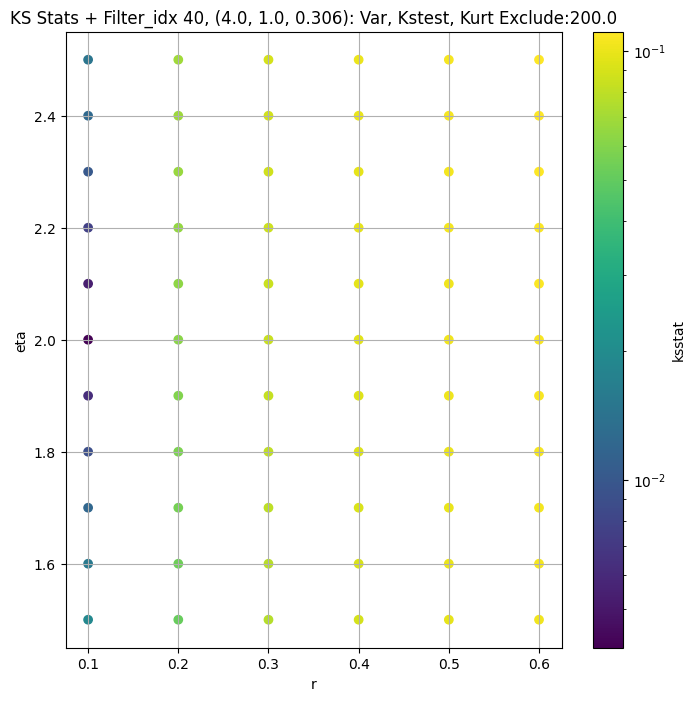

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.021508479597534227 0.116999395


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.010960355042165165 0.06935035


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.0093322704839445 0.06334393


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.007193634598795073 0.056162696
Number of samples: 100000, Without approximation : 262144000.0


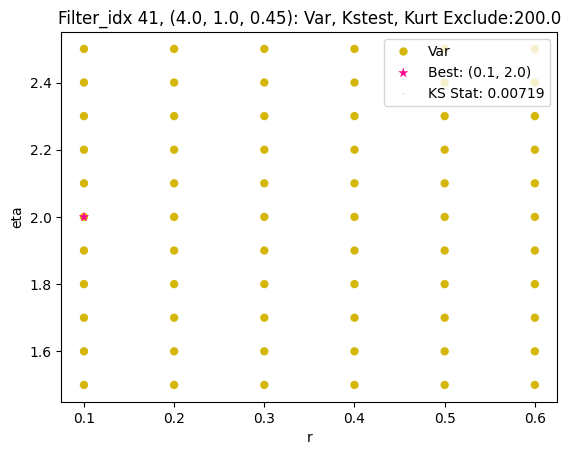

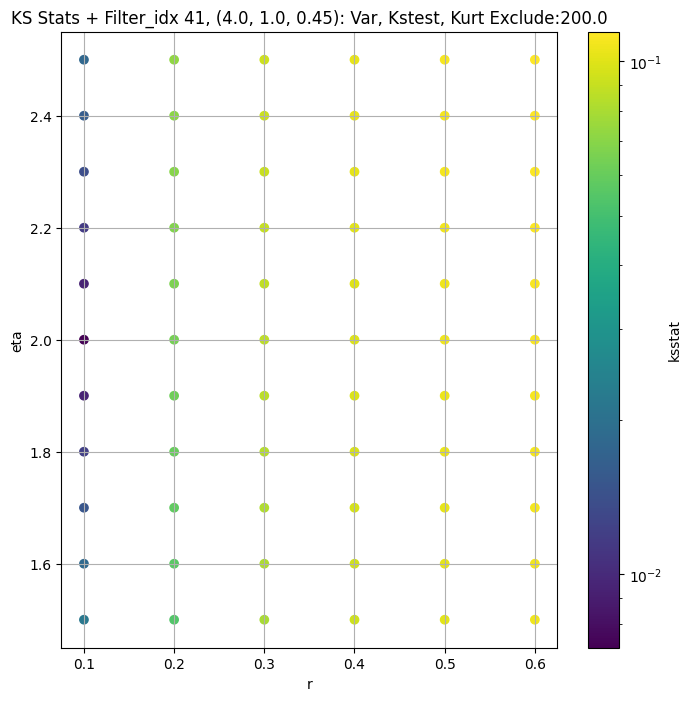

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",122.512850,39.769505,721.071700,689.621150,8.335084,762.91406,262144000.0,"(2.0, 0.5, 0.044)",0.002828,0.1,2.8,7.605296e-16,200.0,43.660260,0.000084
1,"(2.0, 0.5, 0.065)",41.206413,19.952644,273.712800,776.613460,5.031142,803.78830,262144000.0,"(2.0, 0.5, 0.065)",0.001371,0.1,2.6,7.352322e-16,50.0,27.406546,0.000084
2,"(2.0, 0.5, 0.096)",31.351840,10.314682,229.798840,1246.370600,4.091756,876.93860,262144000.0,"(2.0, 0.5, 0.096)",0.001531,0.1,2.9,1.915566e-16,50.0,13.554227,0.000084
3,"(2.0, 0.5, 0.141)",22.116690,6.198631,92.711860,510.675540,8.659283,620.26135,262144000.0,"(2.0, 0.5, 0.141)",0.002684,0.2,0.4,3.518954e-05,200.0,6.811898,0.000084
4,"(2.0, 0.5, 0.208)",5.817891,1.947129,38.298820,865.975200,8.834655,852.49660,262144000.0,"(2.0, 0.5, 0.208)",0.003264,0.1,2.8,3.847158e-17,200.0,2.208565,0.000084
5,"(2.0, 0.5, 0.306)",0.948849,0.431888,5.817474,648.051760,7.456698,749.99900,262144000.0,"(2.0, 0.5, 0.306)",0.003789,0.1,2.8,8.693630e-18,200.0,0.499081,0.000084
6,"(2.0, 0.5, 0.45)",0.544168,0.224286,3.753008,738.979430,10.107155,794.04407,262144000.0,"(2.0, 0.5, 0.45)",0.003486,0.1,2.4,1.089984e-17,200.0,0.258707,0.000084
7,"(2.0, 1.0, 0.044)",96.786000,44.159317,881.038800,1494.333400,6.239370,873.81110,262144000.0,"(2.0, 1.0, 0.044)",0.001588,0.1,3.0,6.266096e-16,100.0,54.414635,0.000084
8,"(2.0, 1.0, 0.065)",51.278526,25.238693,393.370060,982.398000,6.040555,813.75590,262144000.0,"(2.0, 1.0, 0.065)",0.002019,0.1,2.7,6.808280e-16,100.0,31.568470,0.000084


In [12]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [13]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 100 = 300, ksstat: 0.004591515506580678, var: 39.47481918334961


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 75 = 275, ksstat: 0.004101956992729305, var: 40.34096145629883


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 50 = 250, ksstat: 0.0036486071297612277, var: 41.30781936645508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 25 = 225, ksstat: 0.0032047263779186926, var: 42.40250015258789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 0 = 200, ksstat: 0.0028032614663944244, var: 43.66025924682617


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -25 = 175, ksstat: 0.0024455301659012533, var: 45.13351058959961


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -50 = 150, ksstat: 0.0021242181324905296, var: 46.90386199951172


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -75 = 125, ksstat: 0.002859487224756485, var: 49.115760803222656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -100 = 100, ksstat: 0.004194303500422325, var: 52.029258728027344
Number of samples: 100000, Without approximation : 262144000.0


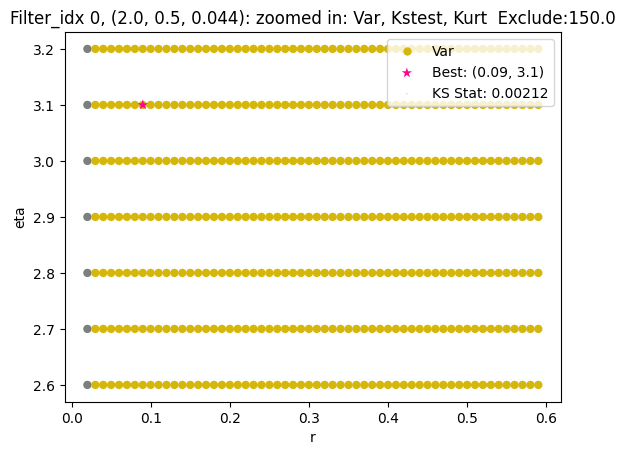

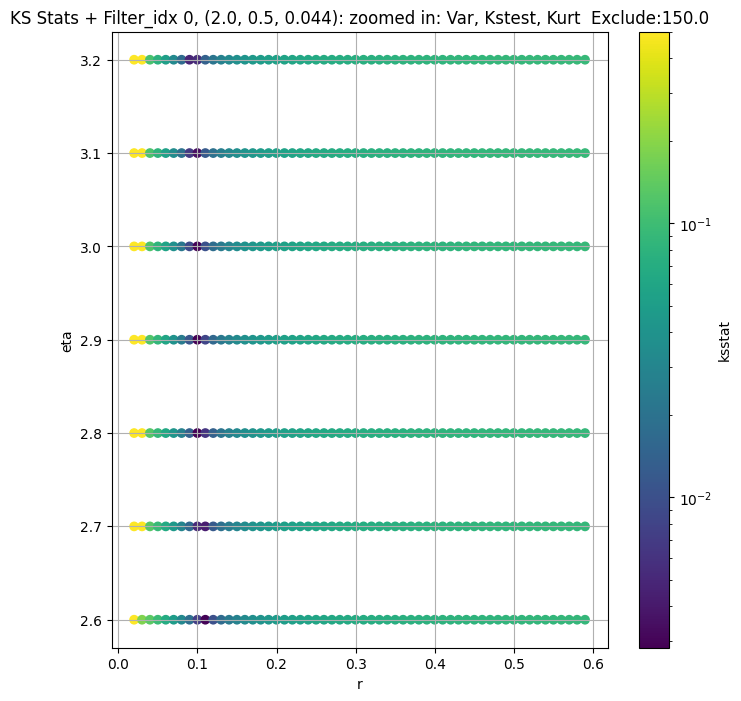

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 100 = 150, ksstat: 0.0032386974104431365, var: 23.54056739807129


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 75 = 125, ksstat: 0.0025728862405207664, var: 24.1888427734375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 50 = 100, ksstat: 0.0015584911085227415, var: 24.977846145629883


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 25 = 75, ksstat: 0.0011098936409245086, var: 25.992033004760742


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 0 = 50, ksstat: 0.0013705878412765826, var: 27.406545639038086


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + -25 = 25, ksstat: 0.0032487380472492403, var: 29.69342613220215


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + -50 = 0, ksstat: 0.010938521720685095, var: 41.20641326904297
Number of samples: 100000, Without approximation : 262144000.0


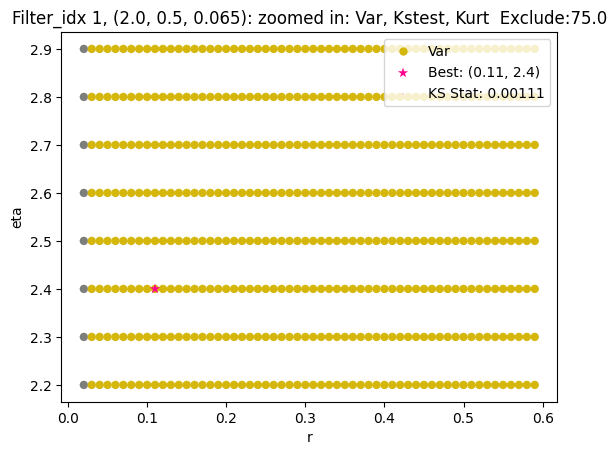

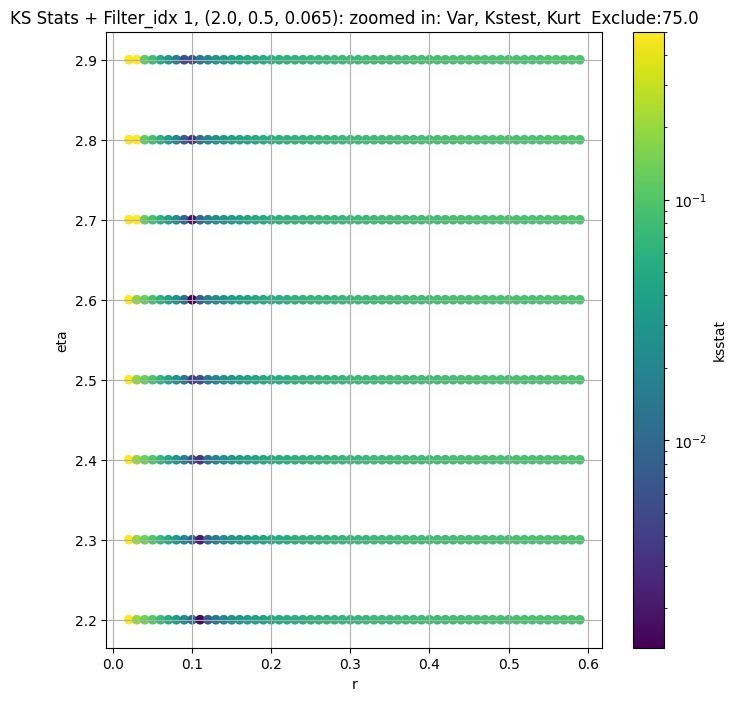

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 100 = 150, ksstat: 0.005257921059800552, var: 11.572253227233887


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 75 = 125, ksstat: 0.004555857502522562, var: 11.84739875793457


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 50 = 100, ksstat: 0.003996332534569366, var: 12.19630241394043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 25 = 75, ksstat: 0.0028564732323853592, var: 12.685317993164062


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + 0 = 50, ksstat: 0.001530538268676107, var: 13.554226875305176


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + -25 = 25, ksstat: 0.0043027399066972935, var: 16.222373962402344


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 50.0 + -50 = 0, ksstat: 0.017887243440296893, var: 31.351839065551758
Number of samples: 100000, Without approximation : 262144000.0


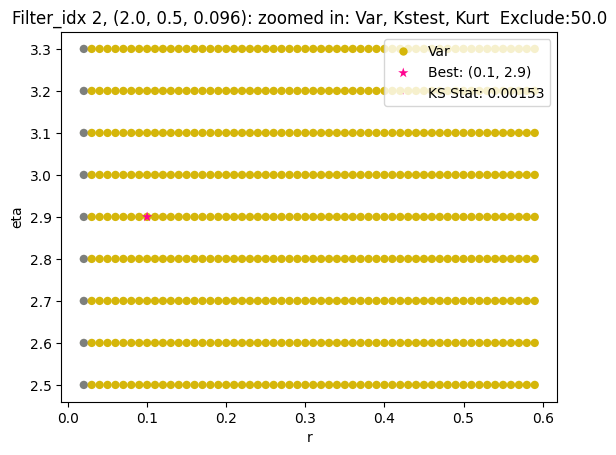

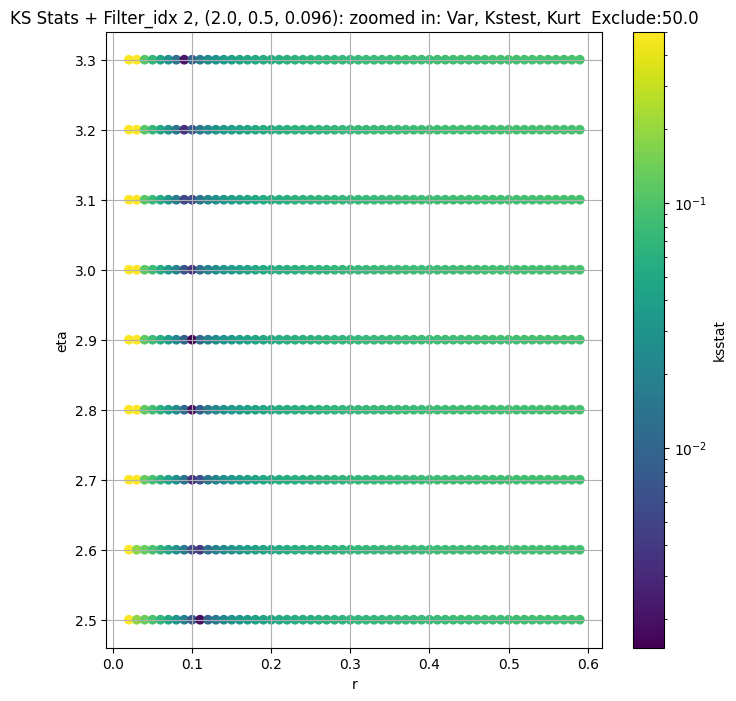

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + 100 = 300, ksstat: 0.004432703921082602, var: 6.135726451873779


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + 75 = 275, ksstat: 0.003951103032103208, var: 6.274855613708496


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + 50 = 250, ksstat: 0.003466987950246043, var: 6.430606365203857


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + 25 = 225, ksstat: 0.0030624032437686077, var: 6.607539653778076


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + 0 = 200, ksstat: 0.0026680848345121966, var: 6.8118977546691895


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + -25 = 175, ksstat: 0.002329800940721549, var: 7.054037094116211


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + -50 = 150, ksstat: 0.0033515655071836292, var: 7.352234363555908


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + -75 = 125, ksstat: 0.003988798466945942, var: 7.741984844207764


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 3, 200.0 + -100 = 100, ksstat: 0.005145247339786718, var: 8.2918119430542
Number of samples: 100000, Without approximation : 262144000.0


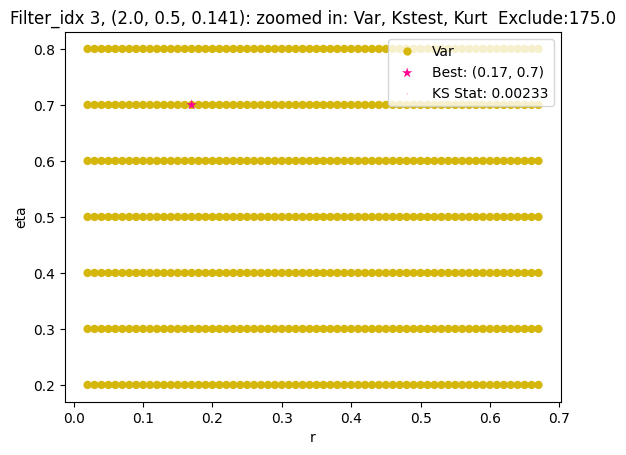

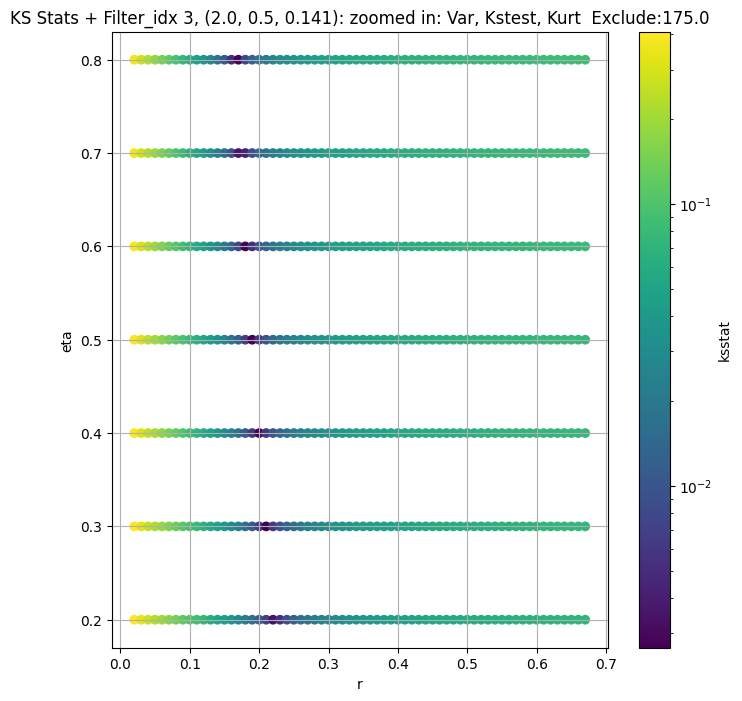

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 100 = 300, ksstat: 0.005274813884619034, var: 2.0142743587493896


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 75 = 275, ksstat: 0.0047611703339287235, var: 2.0556535720825195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 50 = 250, ksstat: 0.004289812813765042, var: 2.101125955581665


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 25 = 225, ksstat: 0.0037689349955026367, var: 2.1516363620758057


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 0 = 200, ksstat: 0.0032125215361030746, var: 2.2085649967193604


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -25 = 175, ksstat: 0.0027019795163615076, var: 2.2738230228424072


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -50 = 150, ksstat: 0.0022550225938706312, var: 2.3505799770355225


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -75 = 125, ksstat: 0.002566997606924304, var: 2.4442484378814697


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -100 = 100, ksstat: 0.003204469068512905, var: 2.5644962787628174
Number of samples: 100000, Without approximation : 262144000.0


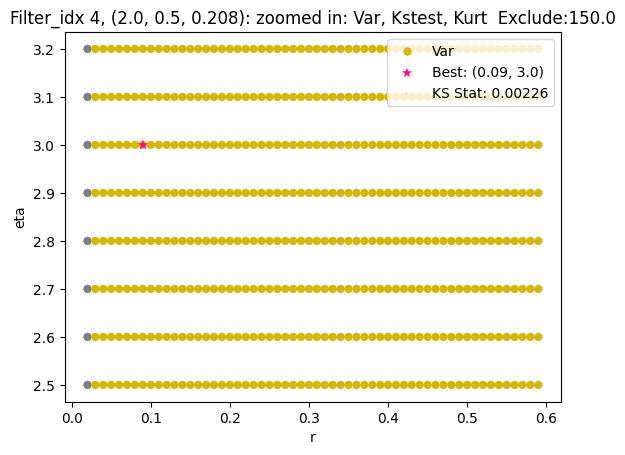

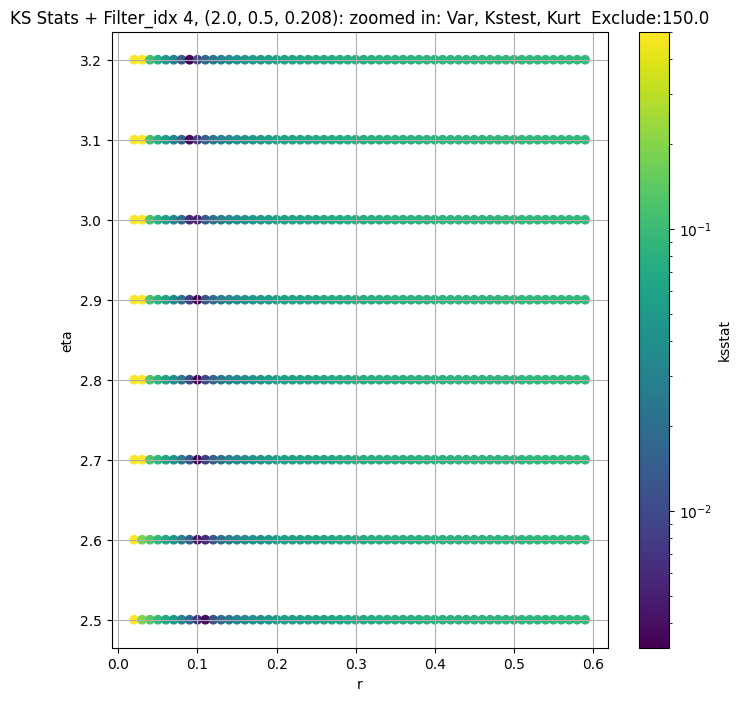

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 100 = 300, ksstat: 0.0055072613649690405, var: 0.45675191283226013


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 75 = 275, ksstat: 0.005111682070358524, var: 0.4659211337566376


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 50 = 250, ksstat: 0.004645042385193376, var: 0.4759155809879303


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 25 = 225, ksstat: 0.004169549340164891, var: 0.48689839243888855


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 0 = 200, ksstat: 0.003788829422539164, var: 0.4990813136100769


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -25 = 175, ksstat: 0.004228509512975986, var: 0.5127567052841187


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -50 = 150, ksstat: 0.005000334699816145, var: 0.5283616781234741


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -75 = 125, ksstat: 0.005029958340016183, var: 0.5466066002845764


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -100 = 100, ksstat: 0.00633183653208147, var: 0.568758487701416
Number of samples: 100000, Without approximation : 262144000.0


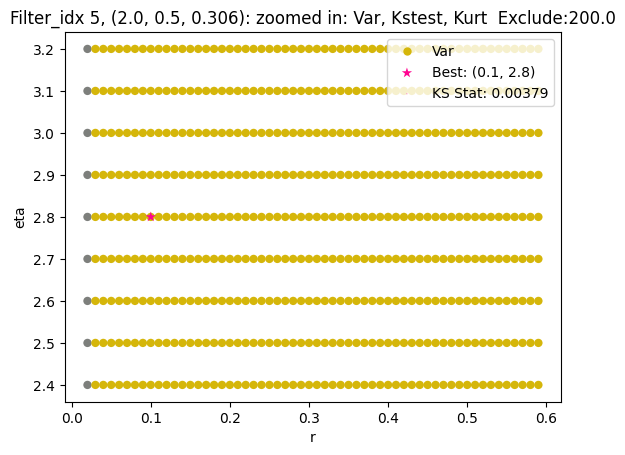

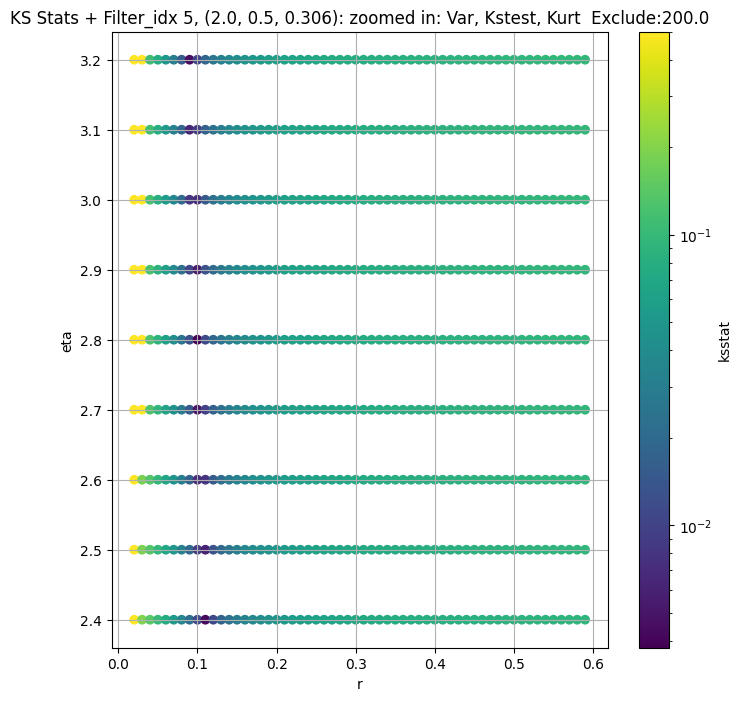

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 100 = 300, ksstat: 0.004999810319067377, var: 0.2339230477809906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 75 = 275, ksstat: 0.004625339249572294, var: 0.23925678431987762


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 50 = 250, ksstat: 0.004218943469111003, var: 0.24508973956108093


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 25 = 225, ksstat: 0.003851224927565955, var: 0.25152644515037537


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 0 = 200, ksstat: 0.0034563992246677486, var: 0.2587071359157562


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -25 = 175, ksstat: 0.0038141327640262013, var: 0.26683637499809265


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -50 = 150, ksstat: 0.004052980451866639, var: 0.2762143909931183


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -75 = 125, ksstat: 0.0053638317196282315, var: 0.2872824966907501


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -100 = 100, ksstat: 0.006216490760266868, var: 0.300706148147583
Number of samples: 100000, Without approximation : 262144000.0


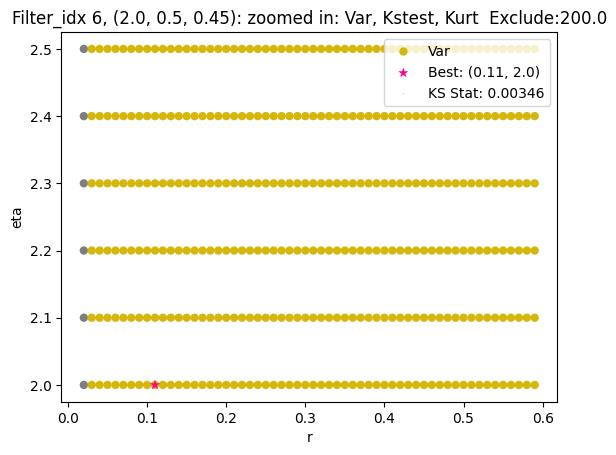

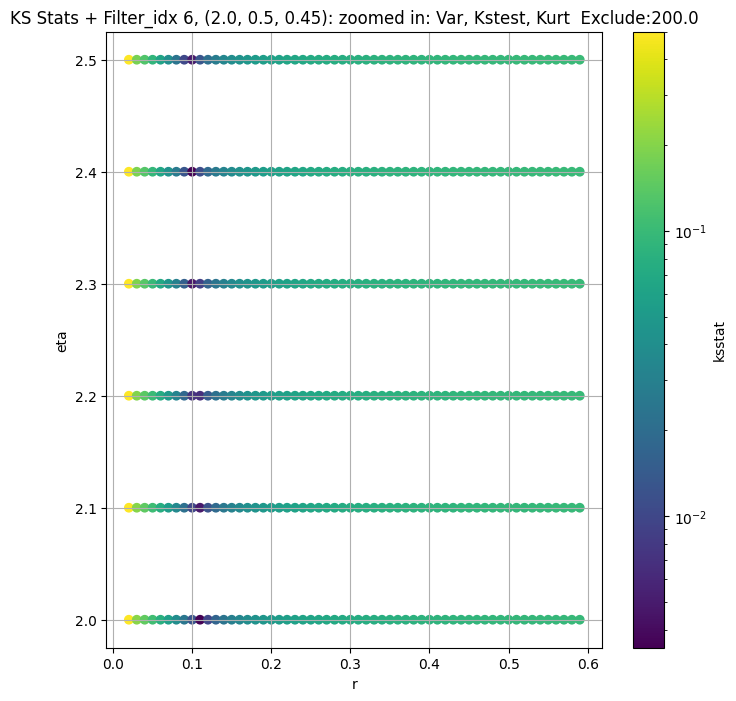

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + 100 = 200, ksstat: 0.003233433044360374, var: 48.499114990234375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + 75 = 175, ksstat: 0.0027432564074478145, var: 49.664485931396484


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + 50 = 150, ksstat: 0.0022611818002988837, var: 50.99354934692383


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + 25 = 125, ksstat: 0.0018753113794210963, var: 52.54524230957031


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + 0 = 100, ksstat: 0.0015875864288894537, var: 54.414634704589844


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + -25 = 75, ksstat: 0.0020346356105014757, var: 56.758060455322266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + -50 = 50, ksstat: 0.0032274442811466852, var: 59.8980712890625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + -75 = 25, ksstat: 0.005341736312889922, var: 64.68287658691406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 100.0 + -100 = 0, ksstat: 0.01397441035956904, var: 96.78600311279297
Number of samples: 100000, Without approximation : 262144000.0


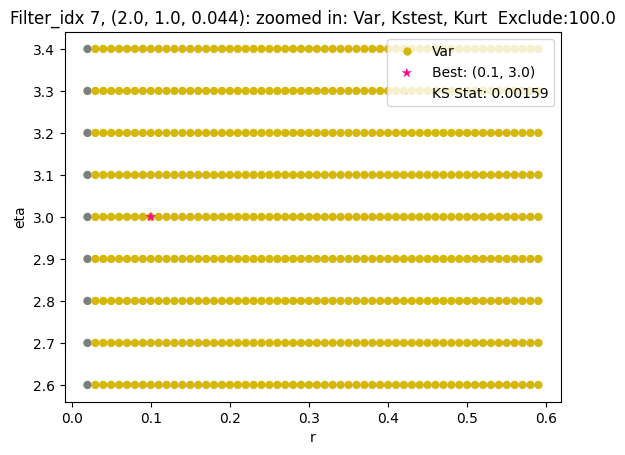

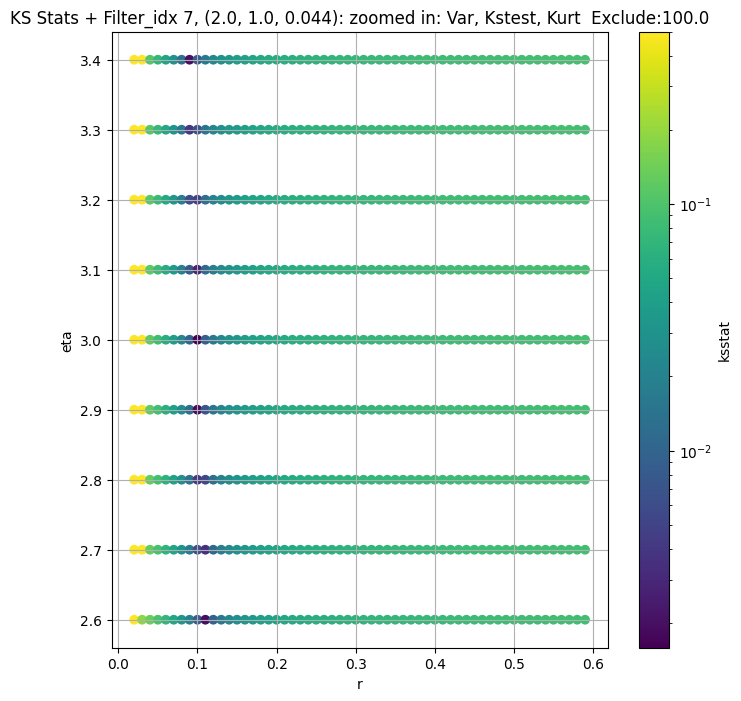

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 100 = 200, ksstat: 0.0038239015669014886, var: 28.343751907348633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 75 = 175, ksstat: 0.0032247911016640707, var: 28.988786697387695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 50 = 150, ksstat: 0.0026379120286659508, var: 29.71940040588379


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 25 = 125, ksstat: 0.00224779876951553, var: 30.563962936401367


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 0 = 100, ksstat: 0.00198908601620007, var: 31.568470001220703


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -25 = 75, ksstat: 0.0020060497002083455, var: 32.812965393066406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -50 = 50, ksstat: 0.0019500269979905172, var: 34.460594177246094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -75 = 25, ksstat: 0.0036502977149044935, var: 36.90972137451172


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -100 = 0, ksstat: 0.01117711937892285, var: 51.278526306152344
Number of samples: 100000, Without approximation : 262144000.0


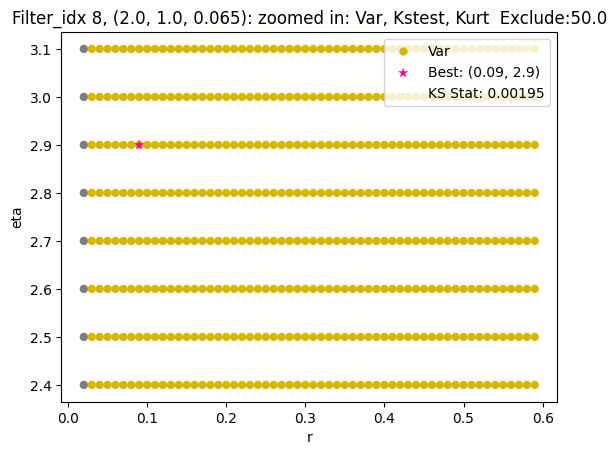

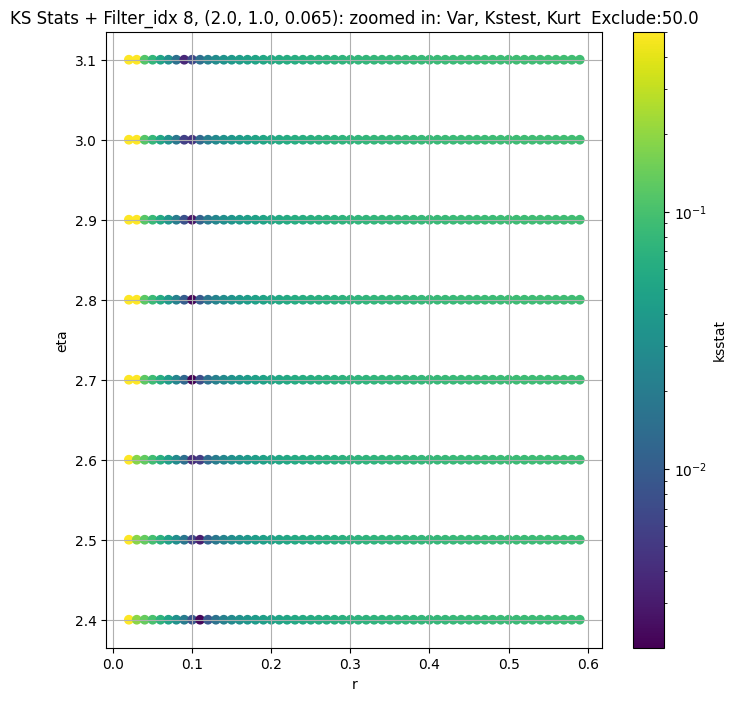

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 100 = 200, ksstat: 0.003921441276997027, var: 15.006648063659668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 75 = 175, ksstat: 0.0032133682510553374, var: 15.369041442871094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 50 = 150, ksstat: 0.0025672803095853278, var: 15.790267944335938


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 25 = 125, ksstat: 0.0019130744077094919, var: 16.29595947265625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 0 = 100, ksstat: 0.0015993250553353877, var: 16.93231773376465


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -25 = 75, ksstat: 0.0014530355673819106, var: 17.78517723083496


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -50 = 50, ksstat: 0.00267675275368634, var: 19.0205020904541


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -75 = 25, ksstat: 0.005540844385378718, var: 21.25867462158203


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -100 = 0, ksstat: 0.01360771816688345, var: 31.001405715942383
Number of samples: 100000, Without approximation : 262144000.0


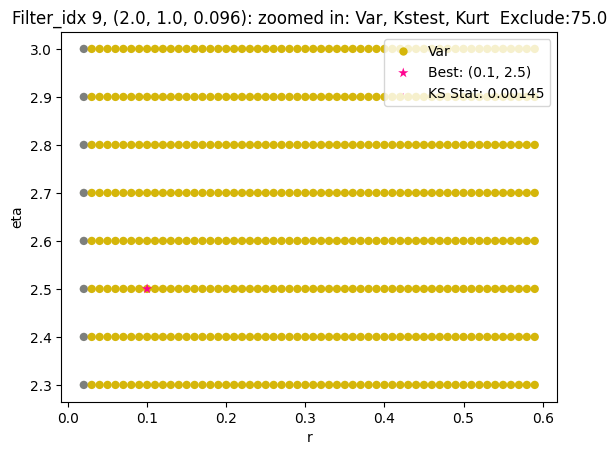

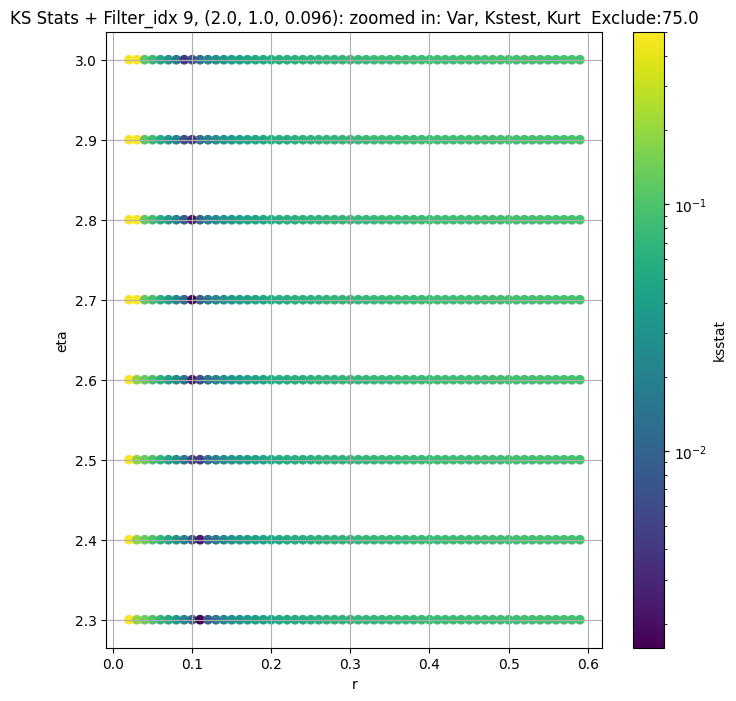

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 100 = 150, ksstat: 0.004286467115926285, var: 7.416655540466309


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 75 = 125, ksstat: 0.003589728939785826, var: 7.584106922149658


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 50 = 100, ksstat: 0.0030081360515406552, var: 7.77589750289917


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 25 = 75, ksstat: 0.002262912322833502, var: 8.002735137939453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 0 = 50, ksstat: 0.0012714170606353825, var: 8.286582946777344


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + -25 = 25, ksstat: 0.0010331277981527887, var: 8.681044578552246


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + -50 = 0, ksstat: 0.0040615665624357256, var: 10.070578575134277
Number of samples: 100000, Without approximation : 262144000.0


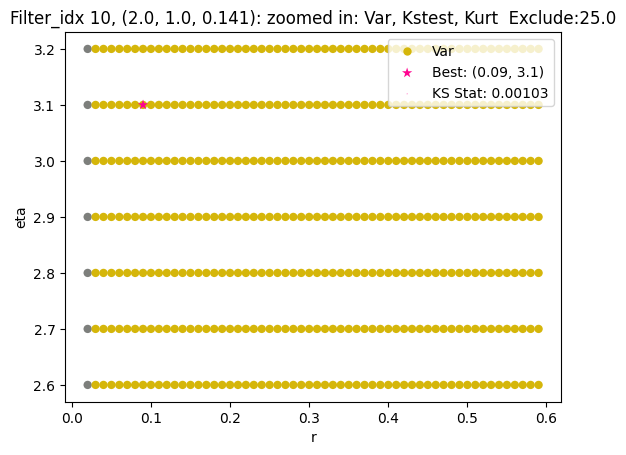

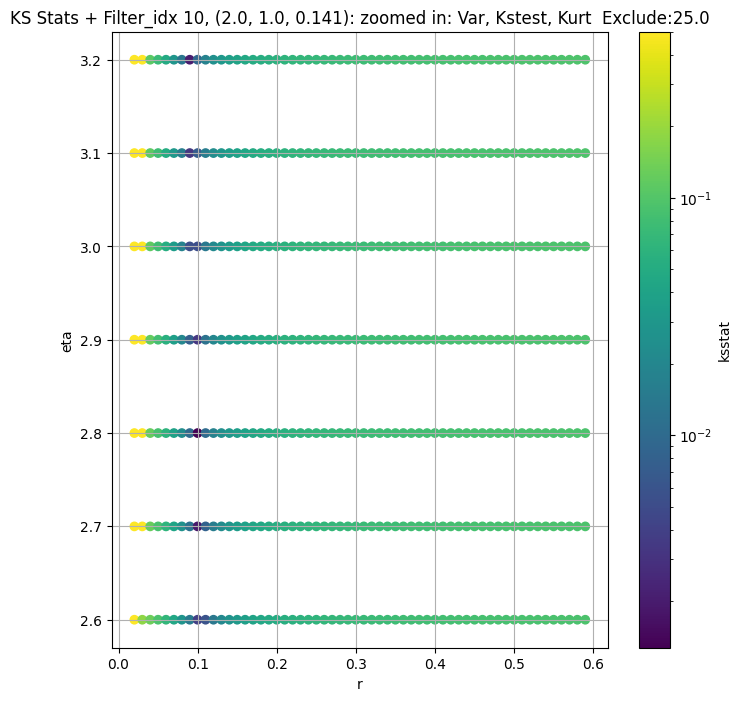

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + 100 = 200, ksstat: 0.0035759787754956474, var: 2.8987128734588623


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + 75 = 175, ksstat: 0.002949039981998469, var: 2.9666941165924072


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + 50 = 150, ksstat: 0.002435748507413127, var: 3.0430033206939697


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + 25 = 125, ksstat: 0.002046593551663034, var: 3.130152940750122


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + 0 = 100, ksstat: 0.0017244390765911444, var: 3.2317678928375244


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + -25 = 75, ksstat: 0.002547269928607654, var: 3.3541245460510254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + -50 = 50, ksstat: 0.0029458013230029972, var: 3.5098373889923096


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + -75 = 25, ksstat: 0.004529278257131009, var: 3.741868734359741


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 100.0 + -100 = 0, ksstat: 0.00910202534033884, var: 4.699251651763916
Number of samples: 100000, Without approximation : 262144000.0


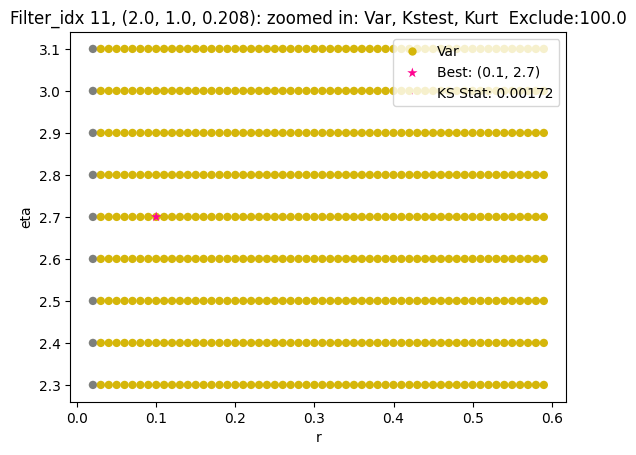

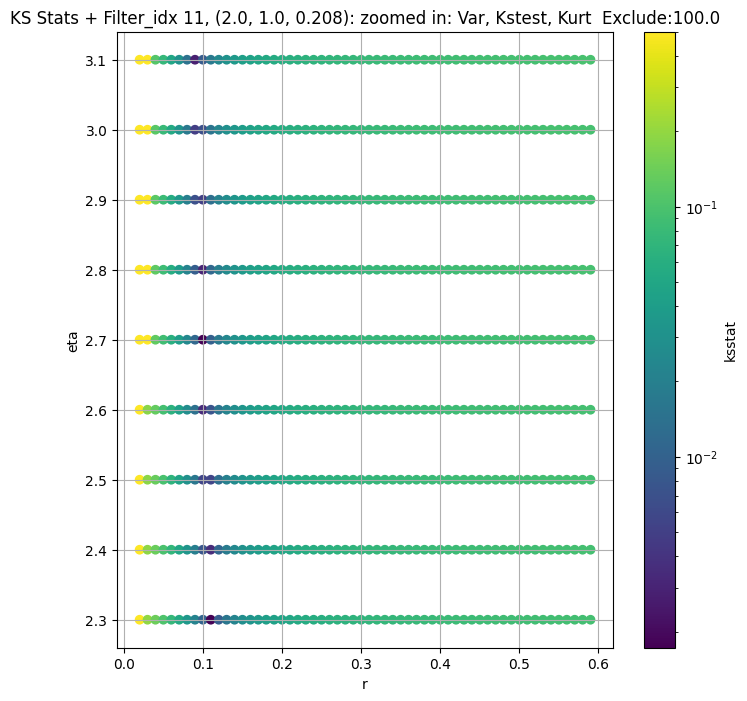

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 100 = 300, ksstat: 0.00505187034847052, var: 0.7499287128448486


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 75 = 275, ksstat: 0.004554290410288025, var: 0.7647730708122253


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 50 = 250, ksstat: 0.004056119005880654, var: 0.7810525894165039


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 25 = 225, ksstat: 0.0035988103025899054, var: 0.7990959882736206


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 0 = 200, ksstat: 0.0030832816013798142, var: 0.8193545937538147


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -25 = 175, ksstat: 0.002681816504224407, var: 0.8425098657608032


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -50 = 150, ksstat: 0.0023040469102734162, var: 0.8696199655532837


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -75 = 125, ksstat: 0.002502855590592823, var: 0.9025689959526062


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -100 = 100, ksstat: 0.0036574236580547703, var: 0.9448180794715881
Number of samples: 100000, Without approximation : 262144000.0


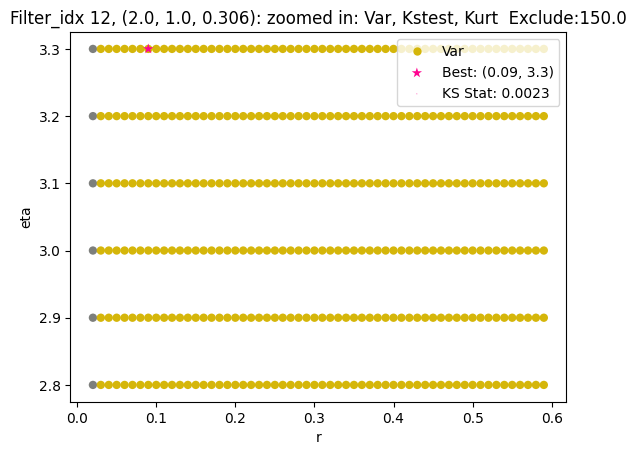

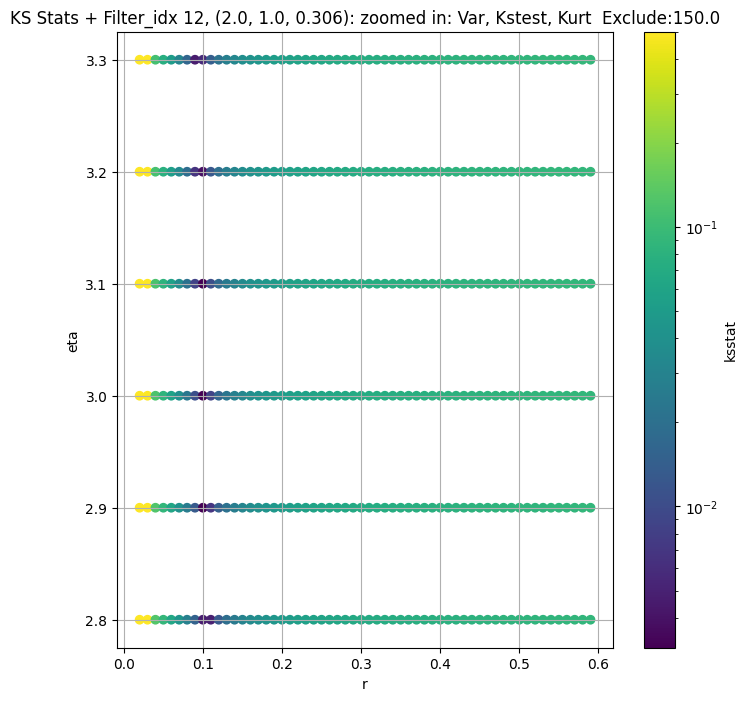

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 100 = 300, ksstat: 0.00449176296115783, var: 0.24697524309158325


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 75 = 275, ksstat: 0.004125036644646184, var: 0.2536616921424866


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 50 = 250, ksstat: 0.0037479587473504463, var: 0.2610974907875061


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 25 = 225, ksstat: 0.00398369190775405, var: 0.26944899559020996


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 0 = 200, ksstat: 0.0043958734927842524, var: 0.2789384424686432


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -25 = 175, ksstat: 0.0050772161282243156, var: 0.28985708951950073


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -50 = 150, ksstat: 0.006533374030626149, var: 0.3026290833950043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -75 = 125, ksstat: 0.006750146430890225, var: 0.3179510831832886


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -100 = 100, ksstat: 0.00787431445122383, var: 0.3372061252593994
Number of samples: 100000, Without approximation : 262144000.0


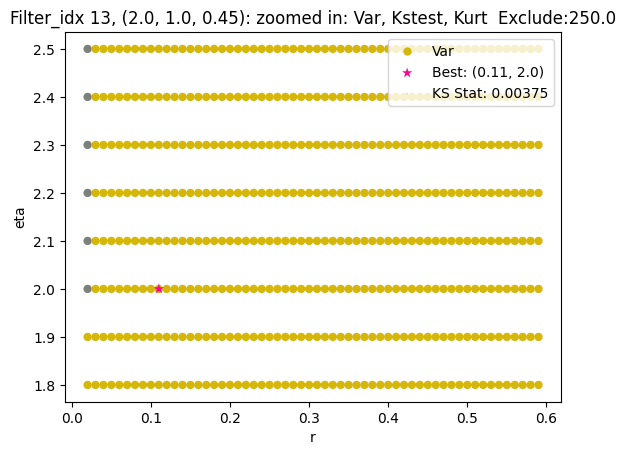

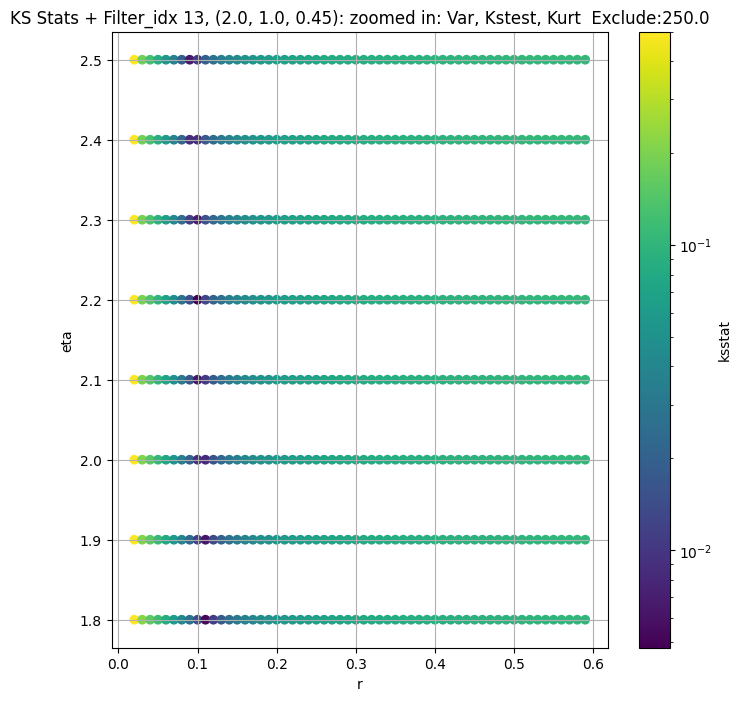

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + 100 = 300, ksstat: 0.004396704164794207, var: 42.64371109008789


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + 75 = 275, ksstat: 0.004020863282610421, var: 43.4893913269043


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + 50 = 250, ksstat: 0.0036061999093935926, var: 44.42434310913086


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + 25 = 225, ksstat: 0.0032428702992932656, var: 45.46975326538086


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + 0 = 200, ksstat: 0.0028622358219260787, var: 46.65258026123047


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + -25 = 175, ksstat: 0.002498351299935031, var: 48.00868225097656


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + -50 = 150, ksstat: 0.002285188443903574, var: 49.59205627441406


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + -75 = 125, ksstat: 0.003364621721416536, var: 51.491146087646484


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 14, 200.0 + -100 = 100, ksstat: 0.004832325825940398, var: 53.85295486450195
Number of samples: 100000, Without approximation : 262144000.0


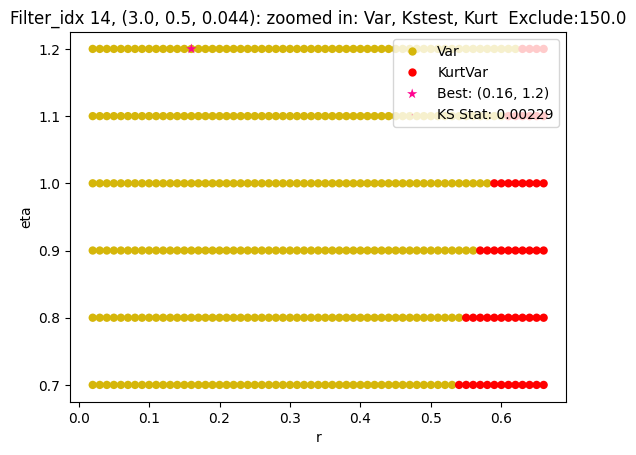

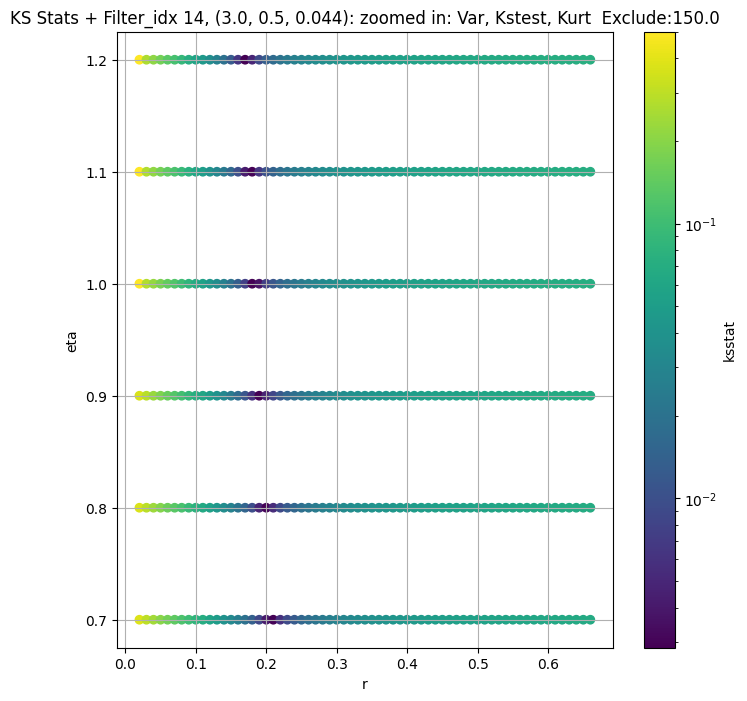

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + 100 = 300, ksstat: 0.004100101965459886, var: 22.86382484436035


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + 75 = 275, ksstat: 0.0036565253527626844, var: 23.3446102142334


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + 50 = 250, ksstat: 0.0033032388228202373, var: 23.88098907470703


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + 25 = 225, ksstat: 0.0029451537039935083, var: 24.487625122070312


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + 0 = 200, ksstat: 0.0026167180967164947, var: 25.185068130493164


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + -25 = 175, ksstat: 0.0023092325944745417, var: 26.002235412597656


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + -50 = 150, ksstat: 0.002068672291733824, var: 26.98332405090332


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + -75 = 125, ksstat: 0.002792238152010462, var: 28.19908332824707


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 15, 200.0 + -100 = 100, ksstat: 0.003938096985568462, var: 29.771320343017578
Number of samples: 100000, Without approximation : 262144000.0


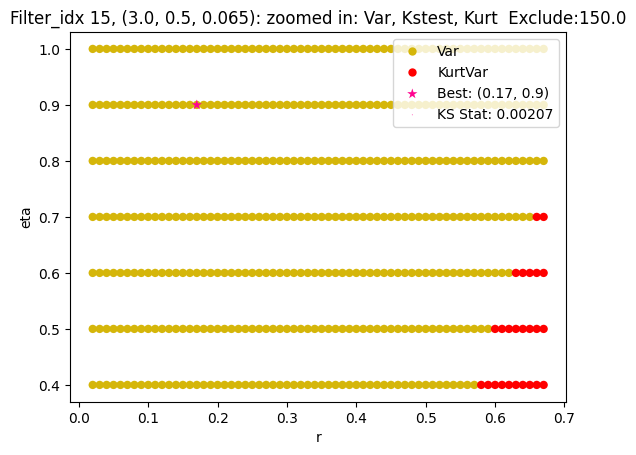

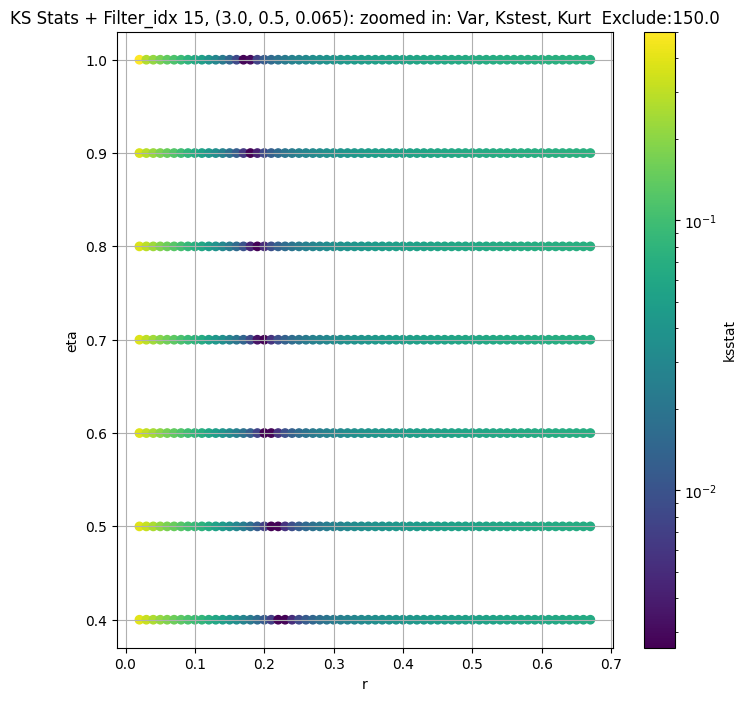

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 100 = 150, ksstat: 0.003515038092776236, var: 13.659652709960938


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 75 = 125, ksstat: 0.0027102117046466923, var: 14.024406433105469


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 50 = 100, ksstat: 0.002190697808407624, var: 14.454061508178711


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 25 = 75, ksstat: 0.0015654317863338374, var: 14.977909088134766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + 0 = 50, ksstat: 0.0012638621053716603, var: 15.65315055847168


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + -25 = 25, ksstat: 0.0017657065100911418, var: 16.64208984375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 50.0 + -50 = 0, ksstat: 0.007710976837531414, var: 21.17571449279785
Number of samples: 100000, Without approximation : 262144000.0


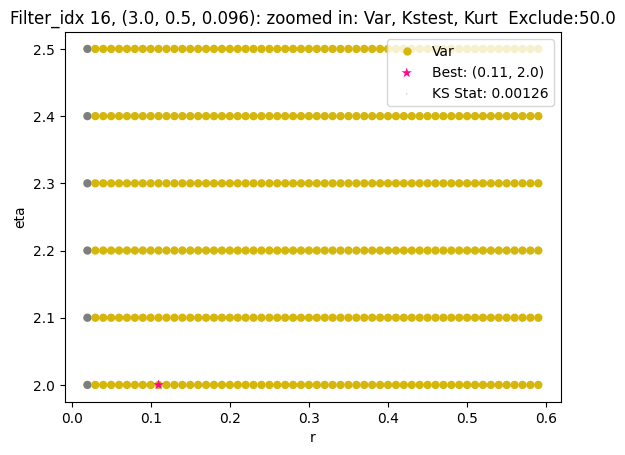

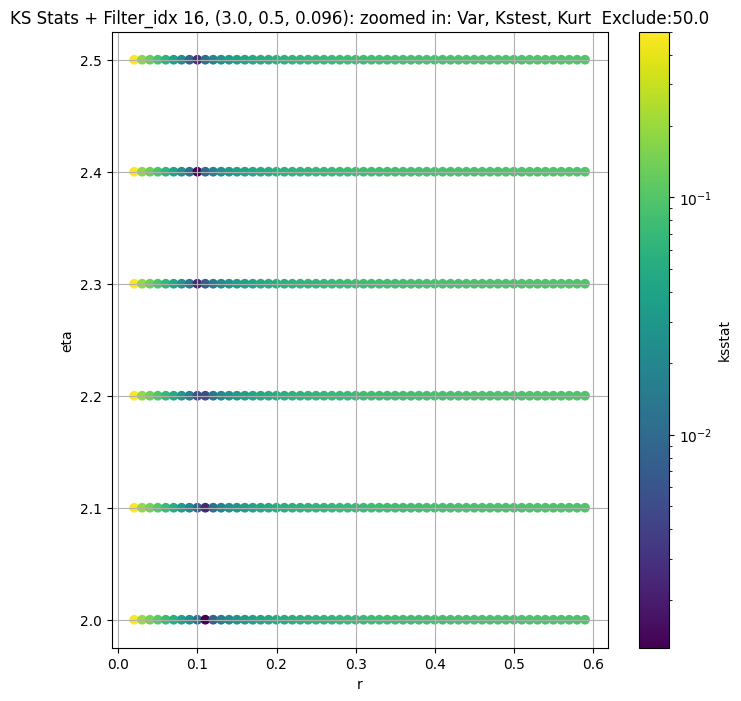

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + 100 = 150, ksstat: 0.0044317267980696975, var: 6.11712121963501


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + 75 = 125, ksstat: 0.003914795845653636, var: 6.263221263885498


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + 50 = 100, ksstat: 0.0032157421261909125, var: 6.428760051727295


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + 25 = 75, ksstat: 0.002631511752389626, var: 6.620270252227783


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + 0 = 50, ksstat: 0.0026049980934901296, var: 6.85029411315918


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + -25 = 25, ksstat: 0.0026567972384514693, var: 7.148820877075195


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 50.0 + -50 = 0, ksstat: 0.004078300247758848, var: 7.99675178527832
Number of samples: 100000, Without approximation : 262144000.0


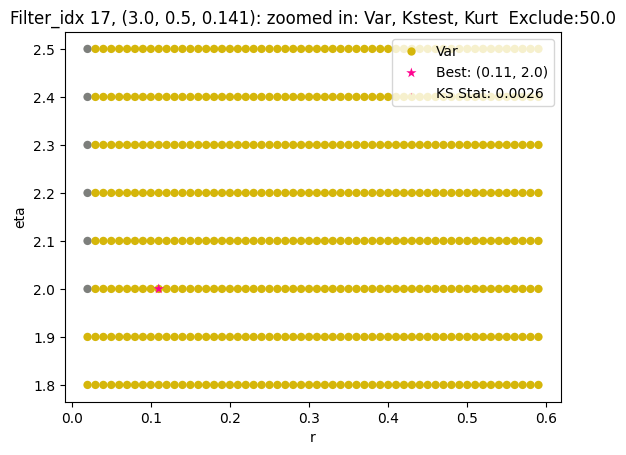

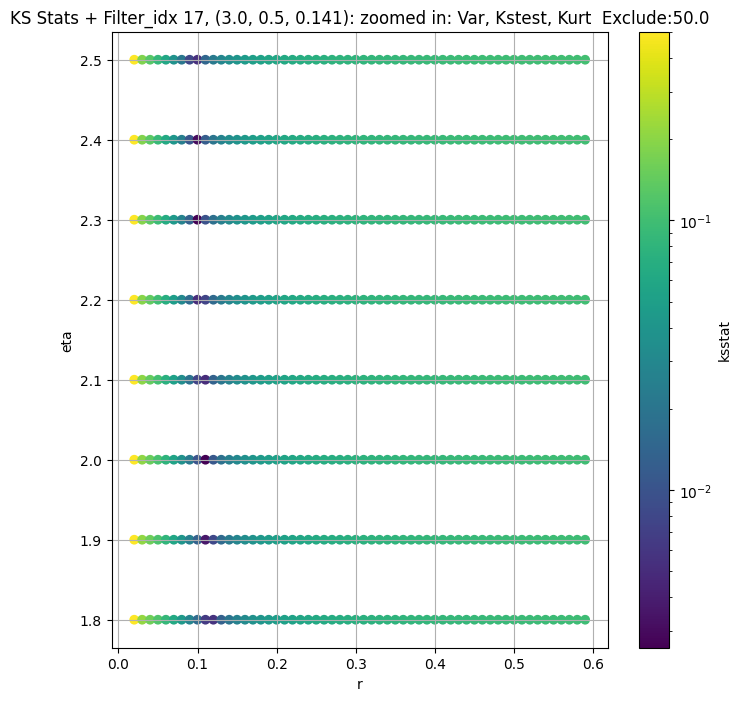

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 100 = 300, ksstat: 0.0043628386321275595, var: 1.6580017805099487


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 75 = 275, ksstat: 0.003985915224422281, var: 1.6983568668365479


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 50 = 250, ksstat: 0.003673700196811014, var: 1.7431684732437134


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 25 = 225, ksstat: 0.0033325324053511407, var: 1.7933892011642456


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 0 = 200, ksstat: 0.003173406965632758, var: 1.8502700328826904


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -25 = 175, ksstat: 0.004228781738853993, var: 1.9154353141784668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -50 = 150, ksstat: 0.004687780552518589, var: 1.9911123514175415


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -75 = 125, ksstat: 0.005540868853162573, var: 2.0808753967285156


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -100 = 100, ksstat: 0.006756157560846132, var: 2.1906909942626953
Number of samples: 100000, Without approximation : 262144000.0


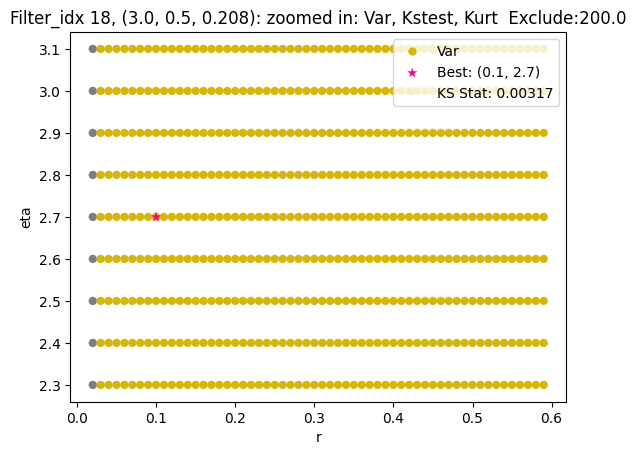

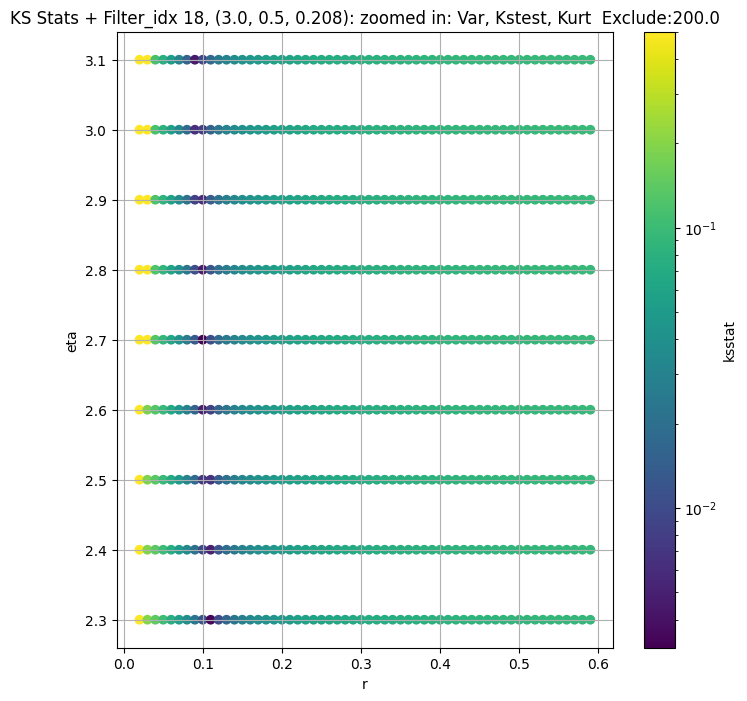

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 100 = 300, ksstat: 0.005563238484187383, var: 0.4808477461338043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 75 = 275, ksstat: 0.006136897628354732, var: 0.4945794343948364


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 50 = 250, ksstat: 0.007367990786685263, var: 0.5097659826278687


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 25 = 225, ksstat: 0.007602810988341507, var: 0.5267289876937866


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 0 = 200, ksstat: 0.00797594181763725, var: 0.5458975434303284


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -25 = 175, ksstat: 0.008523711440146076, var: 0.5678771734237671


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -50 = 150, ksstat: 0.009295354196942246, var: 0.593513548374176


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -75 = 125, ksstat: 0.01035055205645885, var: 0.6240500211715698


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -100 = 100, ksstat: 0.011417973365704215, var: 0.6614713072776794
Number of samples: 100000, Without approximation : 262144000.0


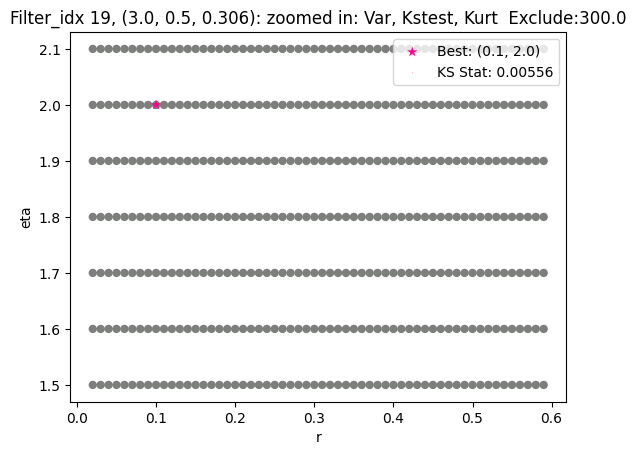

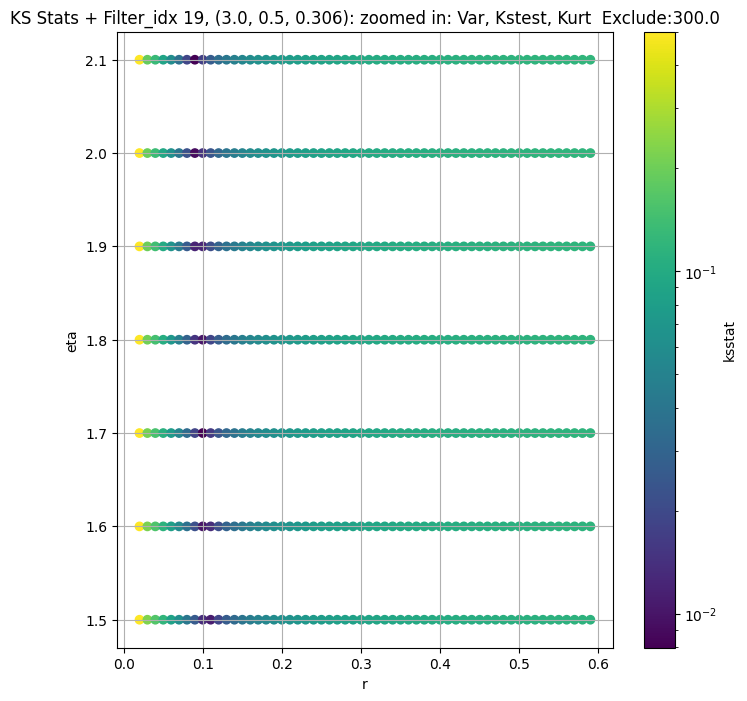

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 100 = 300, ksstat: 0.006475134872146904, var: 0.10665205866098404


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 75 = 275, ksstat: 0.006347371659788159, var: 0.10961232334375381


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 50 = 250, ksstat: 0.0069404095770495555, var: 0.11287654936313629


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 25 = 225, ksstat: 0.007371221073878609, var: 0.11650747060775757


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 0 = 200, ksstat: 0.008259114393852629, var: 0.12059587985277176


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -25 = 175, ksstat: 0.009117217734235794, var: 0.1252540946006775


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -50 = 150, ksstat: 0.009827514376306495, var: 0.13065332174301147


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -75 = 125, ksstat: 0.010595013836978362, var: 0.13705699145793915


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -100 = 100, ksstat: 0.01106273648384759, var: 0.14493727684020996
Number of samples: 100000, Without approximation : 262144000.0


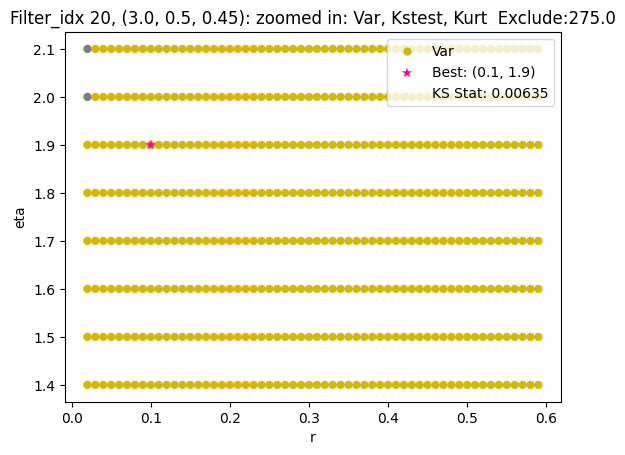

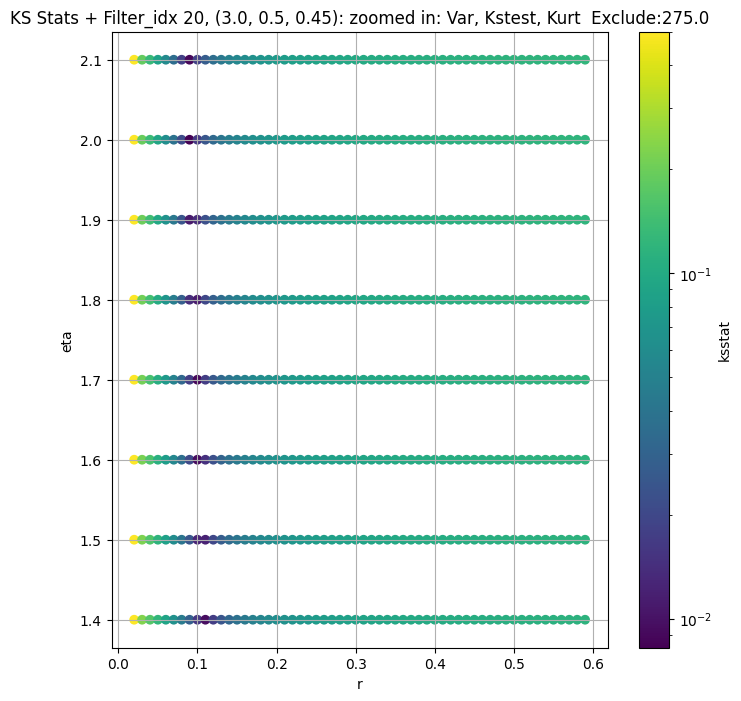

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + 100 = 200, ksstat: 0.003002520702307141, var: 47.712257385253906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + 75 = 175, ksstat: 0.002643644228073949, var: 49.03687286376953


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + 50 = 150, ksstat: 0.0023379962893388395, var: 50.5551643371582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + 25 = 125, ksstat: 0.0020367373152349044, var: 52.33551025390625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + 0 = 100, ksstat: 0.0026650256880321327, var: 54.4913444519043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + -25 = 75, ksstat: 0.003927384527047287, var: 57.237430572509766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + -50 = 50, ksstat: 0.005533992057594639, var: 61.0405387878418


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + -75 = 25, ksstat: 0.007287941327178193, var: 67.14484405517578


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 100.0 + -100 = 0, ksstat: 0.01360851730550694, var: 90.024658203125
Number of samples: 100000, Without approximation : 262144000.0


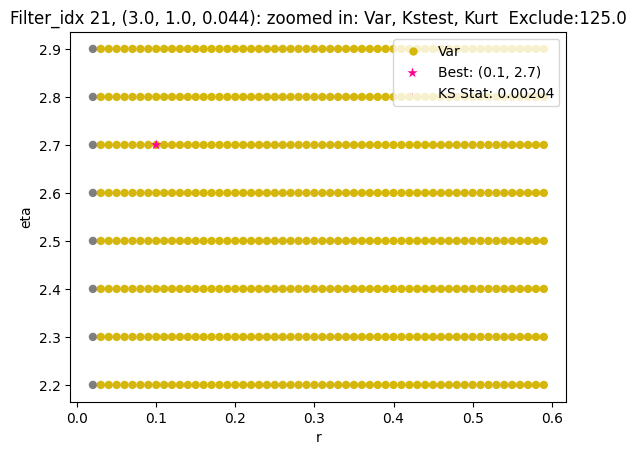

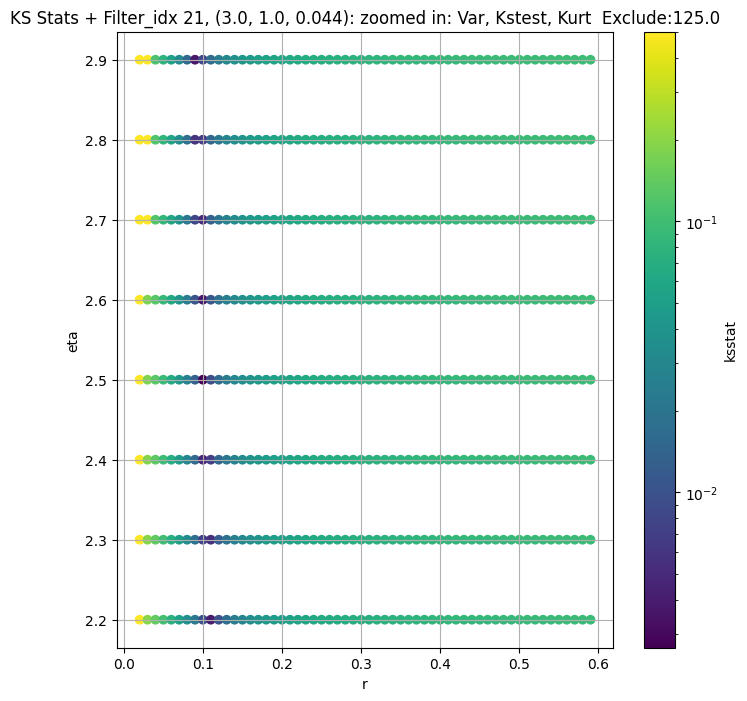

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 100 = 300, ksstat: 0.0045074000232252255, var: 25.930883407592773


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 75 = 275, ksstat: 0.0040211844422652215, var: 26.482616424560547


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 50 = 250, ksstat: 0.003549750080429792, var: 27.093170166015625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 25 = 225, ksstat: 0.003108792905937973, var: 27.776512145996094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + 0 = 200, ksstat: 0.0027807932572784244, var: 28.551712036132812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -25 = 175, ksstat: 0.0024585812390189865, var: 29.445266723632812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -50 = 150, ksstat: 0.002143600129810436, var: 30.49429702758789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -75 = 125, ksstat: 0.001996302306254541, var: 31.755348205566406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 200.0 + -100 = 100, ksstat: 0.0033183306461119083, var: 33.32173156738281
Number of samples: 100000, Without approximation : 262144000.0


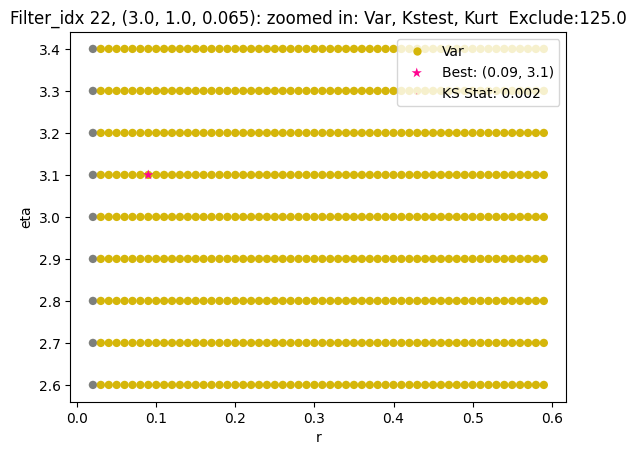

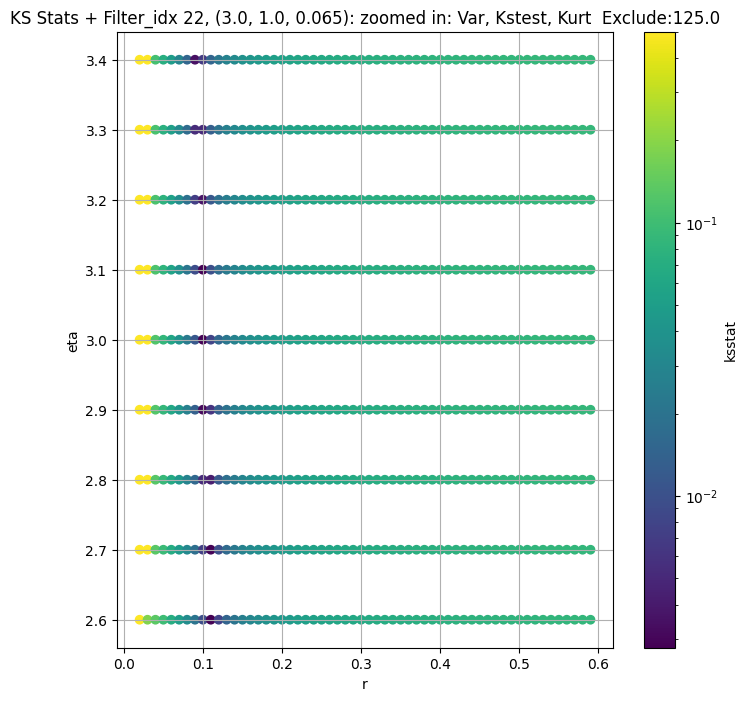

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 100 = 200, ksstat: 0.0034534571608877407, var: 15.125155448913574


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 75 = 175, ksstat: 0.002896963813805848, var: 15.521944046020508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 50 = 150, ksstat: 0.002416311636550027, var: 15.988122940063477


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 25 = 125, ksstat: 0.00197117644169602, var: 16.556875228881836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 0 = 100, ksstat: 0.001675707756114031, var: 17.292667388916016


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -25 = 75, ksstat: 0.002435367414439074, var: 18.359865188598633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -50 = 50, ksstat: 0.0047252937044992005, var: 20.318870544433594


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -75 = 25, ksstat: 0.010084553815990188, var: 25.834352493286133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -100 = 0, ksstat: 0.024828386466271946, var: 59.83329391479492
Number of samples: 100000, Without approximation : 262144000.0


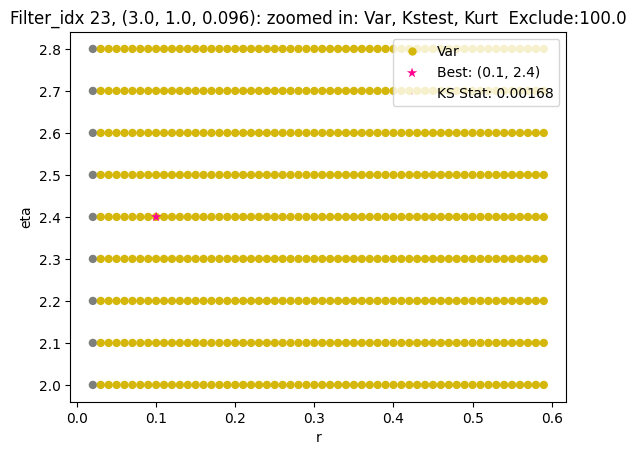

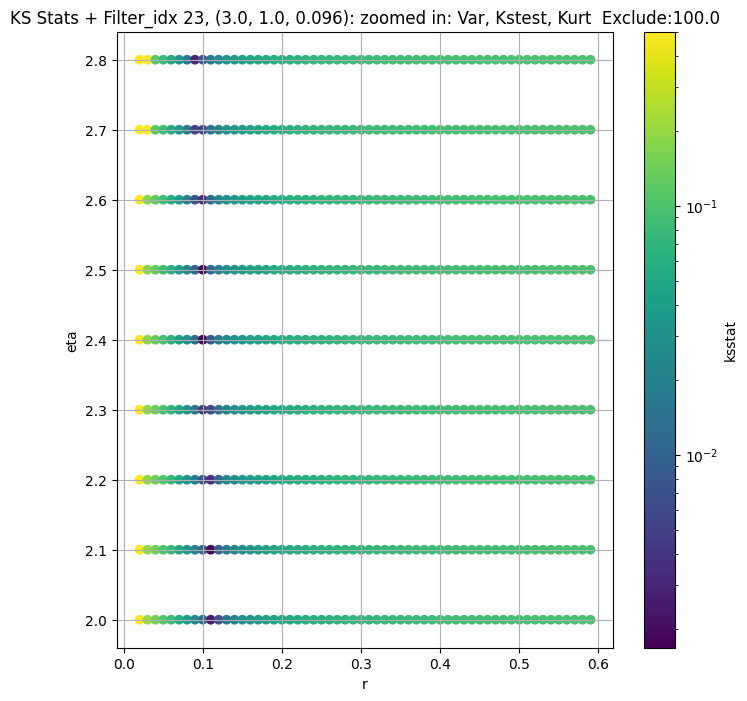

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 100 = 200, ksstat: 0.004318378486254937, var: 6.633737564086914


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 75 = 175, ksstat: 0.003786966847175499, var: 6.787219524383545


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 50 = 150, ksstat: 0.00326830520737368, var: 6.964470386505127


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 25 = 125, ksstat: 0.002715556112063533, var: 7.178948402404785


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 0 = 100, ksstat: 0.0026571560440473985, var: 7.458524703979492


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -25 = 75, ksstat: 0.0038230710515552713, var: 7.8638176918029785


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -50 = 50, ksstat: 0.005103896140926351, var: 8.51721477508545


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -75 = 25, ksstat: 0.00789952599431383, var: 9.717506408691406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -100 = 0, ksstat: 0.015591931485368138, var: 14.663283348083496
Number of samples: 100000, Without approximation : 262144000.0


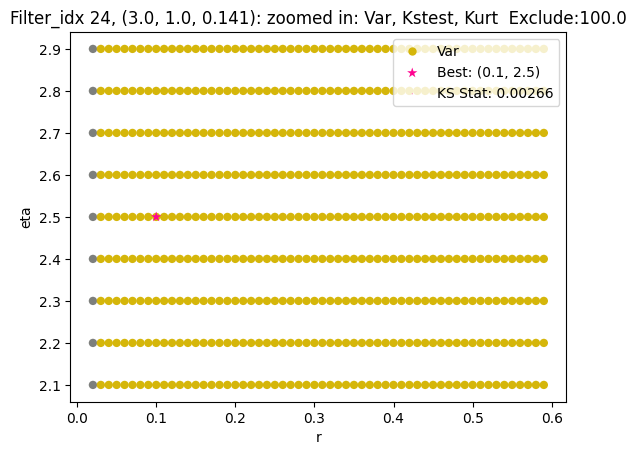

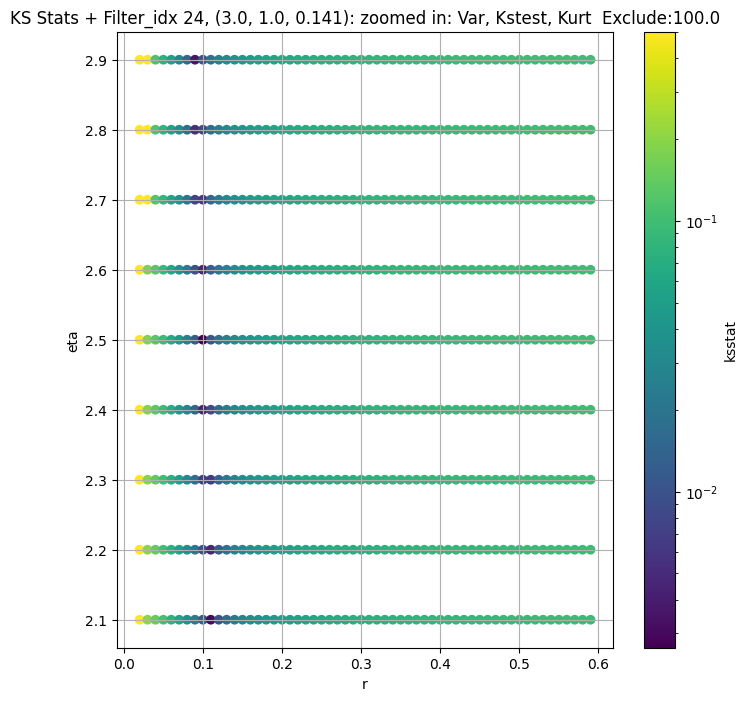

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 100 = 300, ksstat: 0.004479954051237134, var: 2.0312182903289795


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 75 = 275, ksstat: 0.003968321354379774, var: 2.0845839977264404


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 50 = 250, ksstat: 0.003494959841724321, var: 2.1455535888671875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 25 = 225, ksstat: 0.0030883221243291903, var: 2.2165908813476562


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + 0 = 200, ksstat: 0.0036657320690957618, var: 2.30141544342041


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -25 = 175, ksstat: 0.004227620897432255, var: 2.40596866607666


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -50 = 150, ksstat: 0.005212071803876173, var: 2.539949893951416


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -75 = 125, ksstat: 0.006458904766550963, var: 2.720003843307495


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 200.0 + -100 = 100, ksstat: 0.008365863028213183, var: 2.975776433944702
Number of samples: 100000, Without approximation : 262144000.0


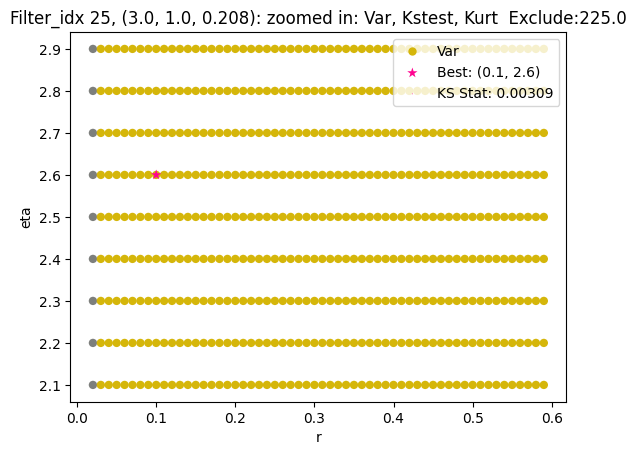

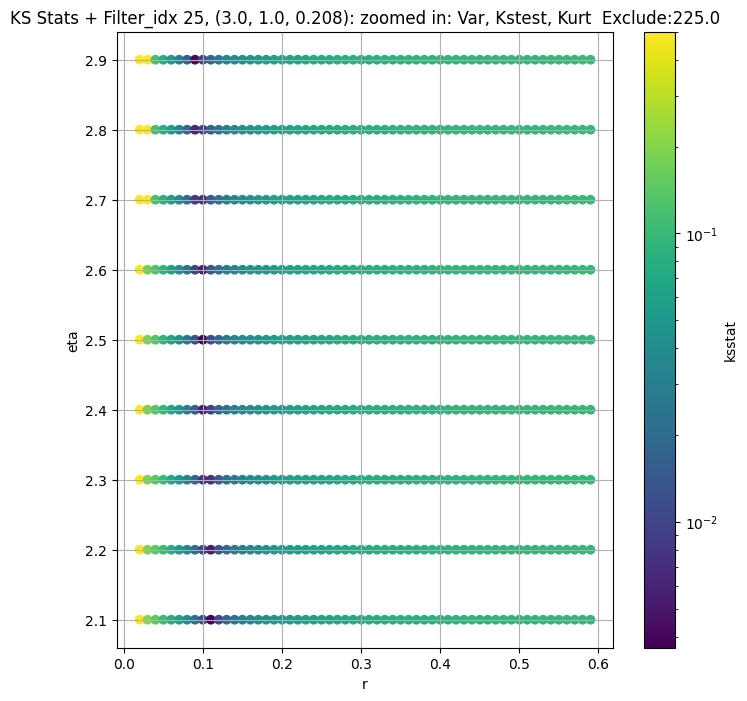

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 100 = 300, ksstat: 0.005591534284062016, var: 0.48175695538520813


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 75 = 275, ksstat: 0.005179908554170123, var: 0.49112823605537415


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 50 = 250, ksstat: 0.004775824613544229, var: 0.5012834668159485


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 25 = 225, ksstat: 0.004374732308971785, var: 0.5123758316040039


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 0 = 200, ksstat: 0.003946634032694574, var: 0.5246151685714722


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -25 = 175, ksstat: 0.003499339087855491, var: 0.5382941365242004


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -50 = 150, ksstat: 0.0036956249239623318, var: 0.5538393259048462


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -75 = 125, ksstat: 0.004050523418055396, var: 0.5719243288040161


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -100 = 100, ksstat: 0.00474316744081435, var: 0.5937250852584839
Number of samples: 100000, Without approximation : 262144000.0


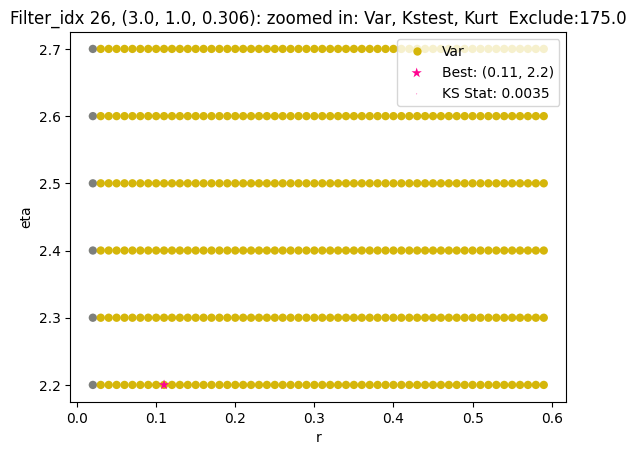

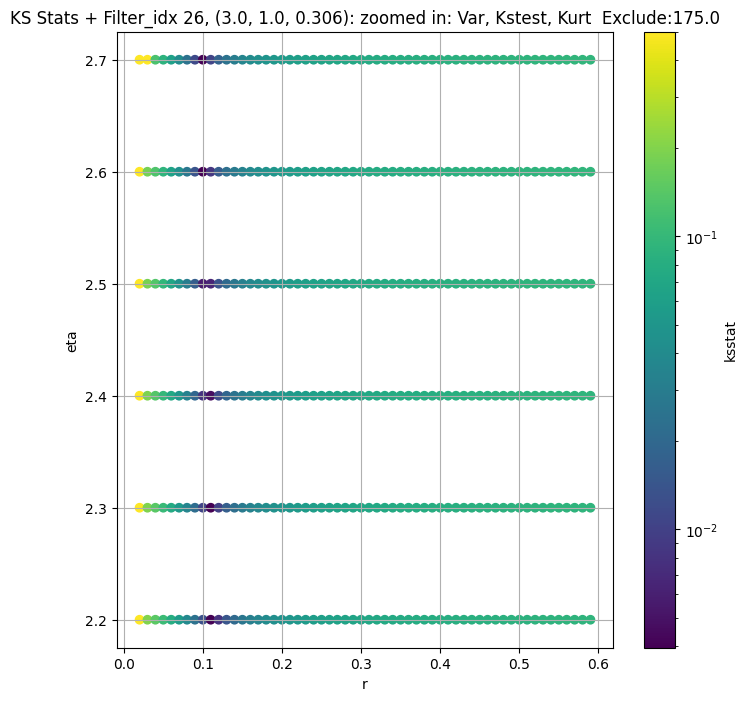

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 100 = 300, ksstat: 0.005636206642941656, var: 0.0905396118760109


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 75 = 275, ksstat: 0.0053363385290023935, var: 0.09257885068655014


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 50 = 250, ksstat: 0.005651244083997753, var: 0.0947960913181305


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 25 = 225, ksstat: 0.006129063903997145, var: 0.09722673892974854


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 0 = 200, ksstat: 0.006146047480732941, var: 0.09992443770170212


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -25 = 175, ksstat: 0.006754123388408917, var: 0.1029643565416336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -50 = 150, ksstat: 0.007420219853703225, var: 0.10645979642868042


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -75 = 125, ksstat: 0.007898870307796568, var: 0.11059241741895676


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -100 = 100, ksstat: 0.008799893961448757, var: 0.11568829417228699
Number of samples: 100000, Without approximation : 262144000.0


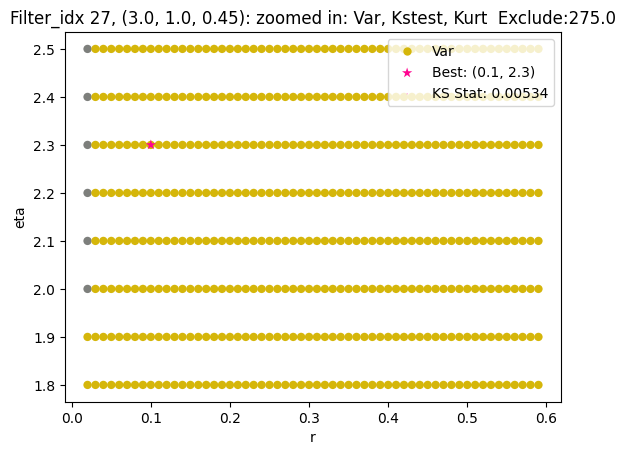

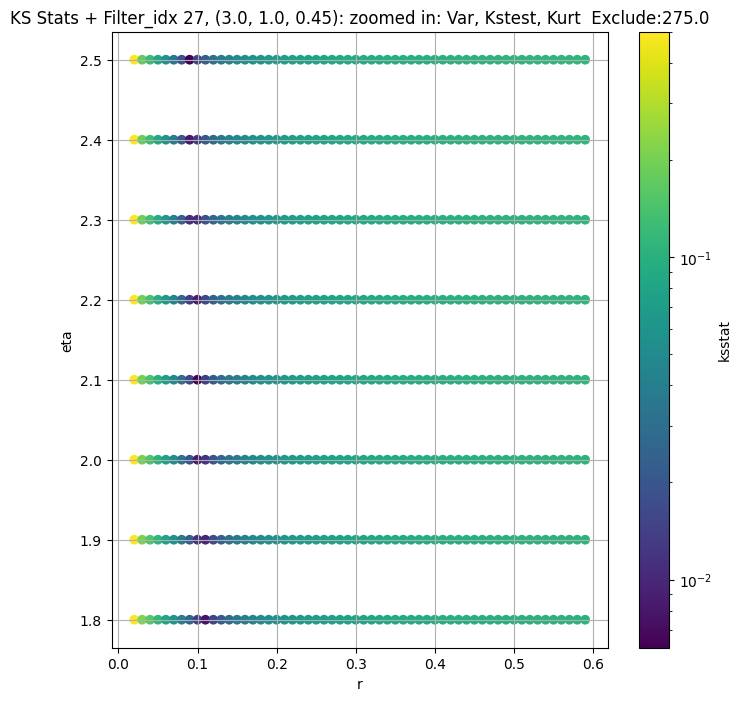

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 100 = 200, ksstat: 0.004010619336118938, var: 41.80055618286133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 75 = 175, ksstat: 0.0033887673024893816, var: 42.68504333496094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 50 = 150, ksstat: 0.002814507681928702, var: 43.68812561035156


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 25 = 125, ksstat: 0.0021787700903410853, var: 44.8495979309082


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 0 = 100, ksstat: 0.001596028959345656, var: 46.23830032348633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -25 = 75, ksstat: 0.0012239469772132305, var: 47.98770523071289


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -50 = 50, ksstat: 0.0019486468911063537, var: 50.39744567871094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -75 = 25, ksstat: 0.0038486522849020544, var: 54.38323211669922


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -100 = 0, ksstat: 0.0104968198727442, var: 72.07771301269531
Number of samples: 100000, Without approximation : 262144000.0


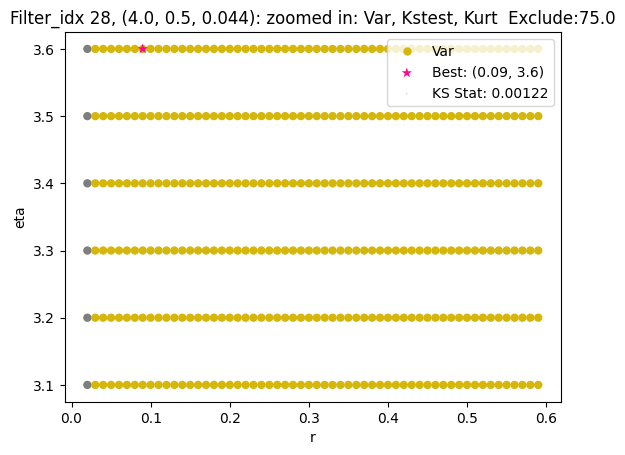

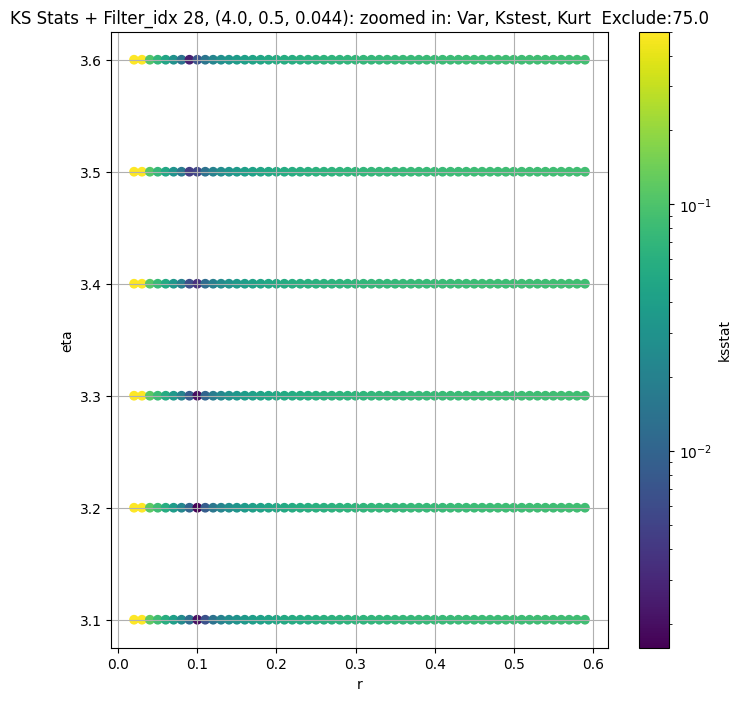

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 100 = 200, ksstat: 0.004390344509533239, var: 21.46057891845703


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 75 = 175, ksstat: 0.003888803631027747, var: 21.887975692749023


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 50 = 150, ksstat: 0.0031623646325668053, var: 22.373476028442383


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 25 = 125, ksstat: 0.0023946627598051863, var: 22.939178466796875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 0 = 100, ksstat: 0.0017130970241207022, var: 23.622920989990234


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -25 = 75, ksstat: 0.001079585140241049, var: 24.496583938598633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -50 = 50, ksstat: 0.0013103076510397882, var: 25.720172882080078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -75 = 25, ksstat: 0.0031190660446962504, var: 27.8427791595459


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -100 = 0, ksstat: 0.013177925961272915, var: 42.393470764160156
Number of samples: 100000, Without approximation : 262144000.0


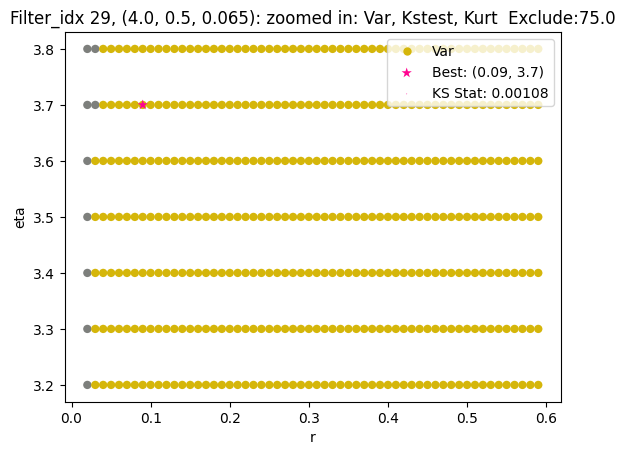

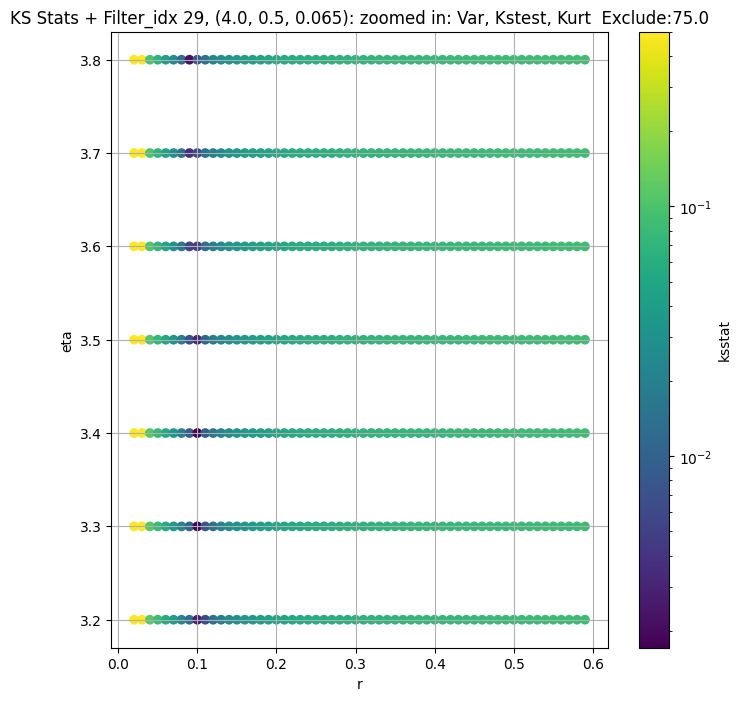

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 0.0 + 100 = 100, ksstat: 0.004793036073294399, var: 12.877274513244629


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 0.0 + 75 = 75, ksstat: 0.004155589934159987, var: 13.17918872833252


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 0.0 + 50 = 50, ksstat: 0.003334844344318799, var: 13.547257423400879


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 0.0 + 25 = 25, ksstat: 0.002678912534445188, var: 14.049064636230469


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 0.0 + 0 = 0, ksstat: 0.0017001500510342993, var: 16.312196731567383
Number of samples: 100000, Without approximation : 262144000.0


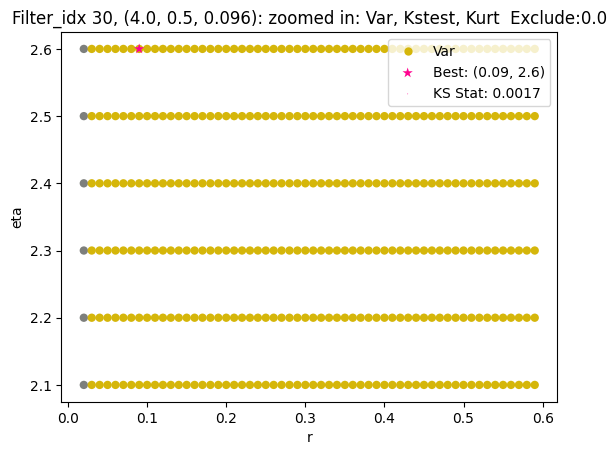

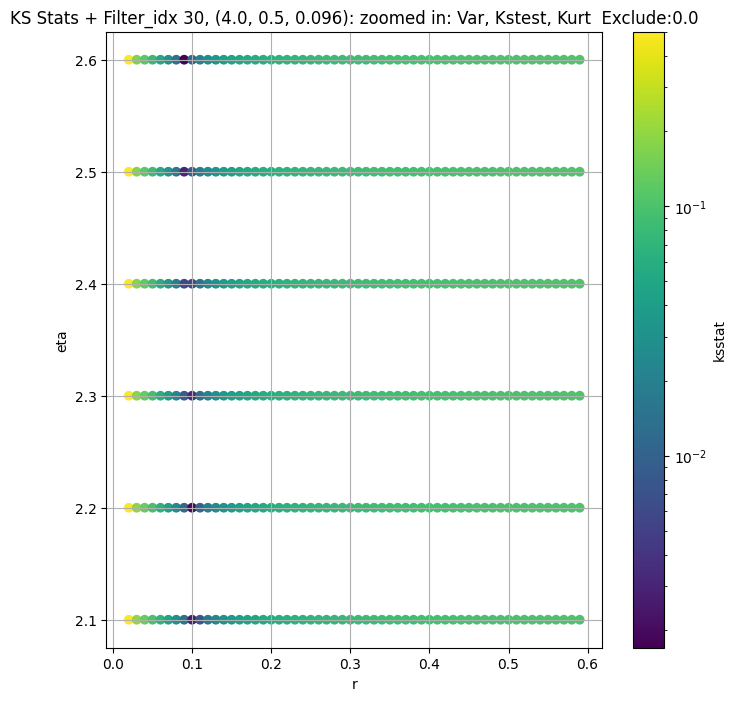

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 100 = 300, ksstat: 0.005982846897349514, var: 6.088301181793213


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 75 = 275, ksstat: 0.005488613543694811, var: 6.211545944213867


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 50 = 250, ksstat: 0.005101936411273544, var: 6.346925735473633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 25 = 225, ksstat: 0.004564418411249993, var: 6.497556686401367


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 0 = 200, ksstat: 0.003991677597919074, var: 6.667716026306152


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -25 = 175, ksstat: 0.003506112448126375, var: 6.863757133483887


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -50 = 150, ksstat: 0.0029518664605510114, var: 7.096118450164795


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -75 = 125, ksstat: 0.0037700451640289012, var: 7.382498264312744


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -100 = 100, ksstat: 0.003851754635962823, var: 7.758280277252197
Number of samples: 100000, Without approximation : 262144000.0


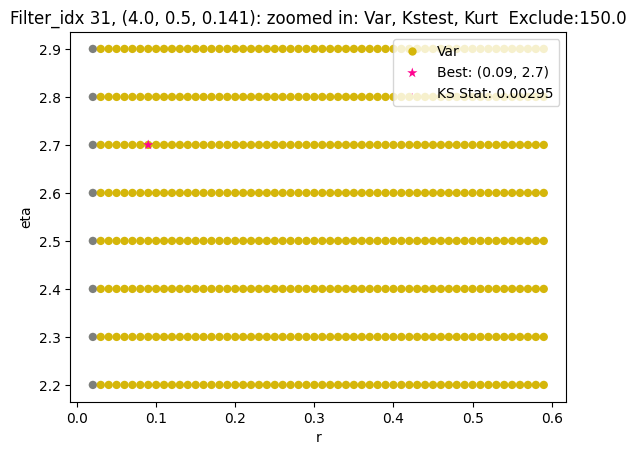

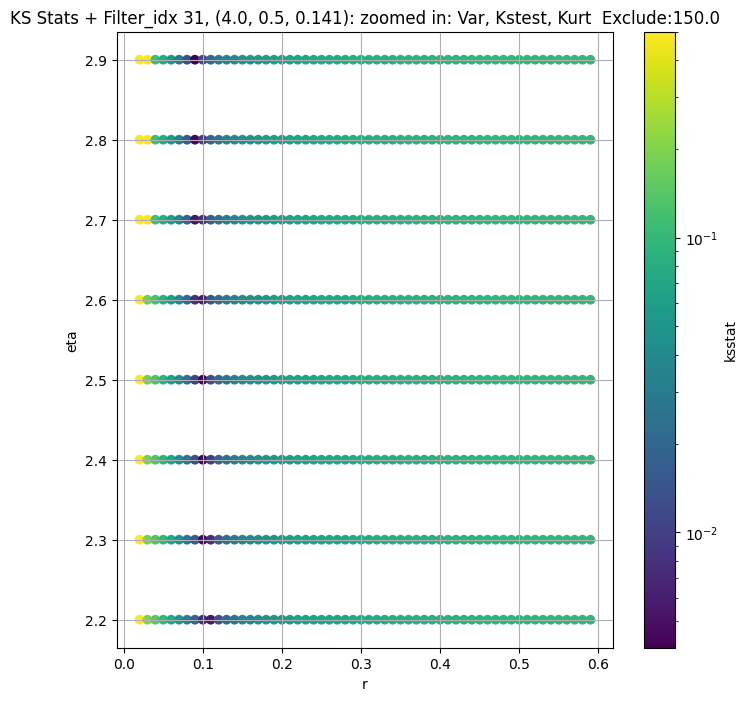

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 100 = 300, ksstat: 0.0048145062545429385, var: 1.6322259902954102


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 75 = 275, ksstat: 0.004398696284009684, var: 1.676220417022705


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 50 = 250, ksstat: 0.004345475679801147, var: 1.7255762815475464


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 25 = 225, ksstat: 0.004839708046020047, var: 1.7815951108932495


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 0 = 200, ksstat: 0.005214278967320546, var: 1.8461004495620728


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -25 = 175, ksstat: 0.006518982864609502, var: 1.9215608835220337


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -50 = 150, ksstat: 0.006616604124138503, var: 2.0114803314208984


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -75 = 125, ksstat: 0.008116154695813393, var: 2.121262788772583


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -100 = 100, ksstat: 0.009287430009167666, var: 2.259056329727173
Number of samples: 100000, Without approximation : 262144000.0


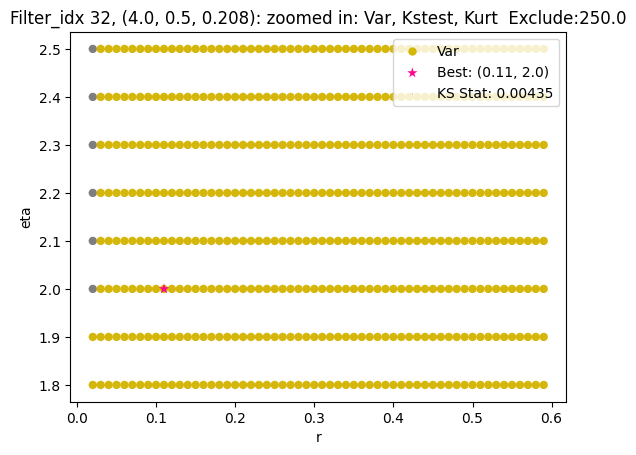

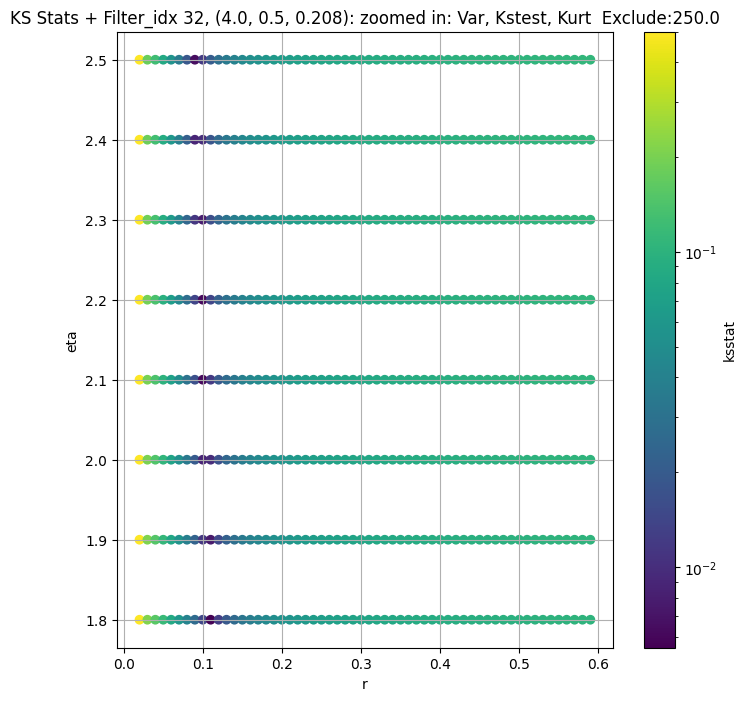

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 100 = 300, ksstat: 0.005916673390606753, var: 0.37252405285835266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 75 = 275, ksstat: 0.005595451142703656, var: 0.3818899393081665


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 50 = 250, ksstat: 0.006600271433337412, var: 0.39217111468315125


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 25 = 225, ksstat: 0.006368245288663643, var: 0.4035617411136627


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 0 = 200, ksstat: 0.0063322551861320076, var: 0.41631880402565


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -25 = 175, ksstat: 0.006904438942360258, var: 0.4308052659034729


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -50 = 150, ksstat: 0.007746045503213006, var: 0.4475589692592621


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -75 = 125, ksstat: 0.008483706468965235, var: 0.46742716431617737


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -100 = 100, ksstat: 0.009036445362318568, var: 0.4917377829551697
Number of samples: 100000, Without approximation : 262144000.0


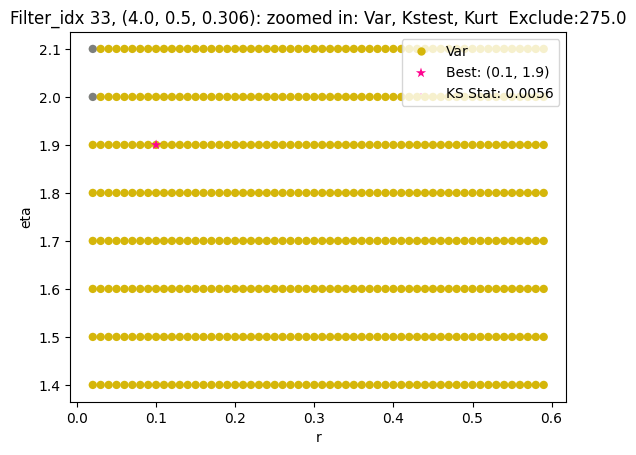

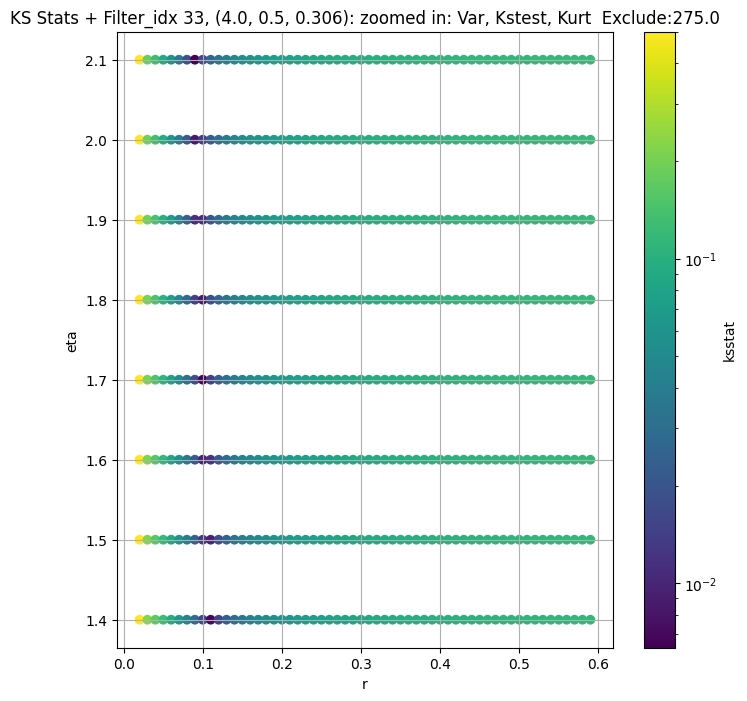

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 100 = 300, ksstat: 0.006704106393019438, var: 0.045123860239982605


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 75 = 275, ksstat: 0.006322853879910717, var: 0.04595637694001198


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 50 = 250, ksstat: 0.005931272157284749, var: 0.04684622958302498


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 25 = 225, ksstat: 0.005870811885513638, var: 0.04780242219567299


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + 0 = 200, ksstat: 0.00567975860754566, var: 0.04883669316768646


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -25 = 175, ksstat: 0.006418349416422886, var: 0.04996684566140175


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -50 = 150, ksstat: 0.006689352238452684, var: 0.05121505260467529


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -75 = 125, ksstat: 0.007547395014399411, var: 0.05261481925845146


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 200.0 + -100 = 100, ksstat: 0.008008919589082675, var: 0.05421888828277588
Number of samples: 100000, Without approximation : 262144000.0


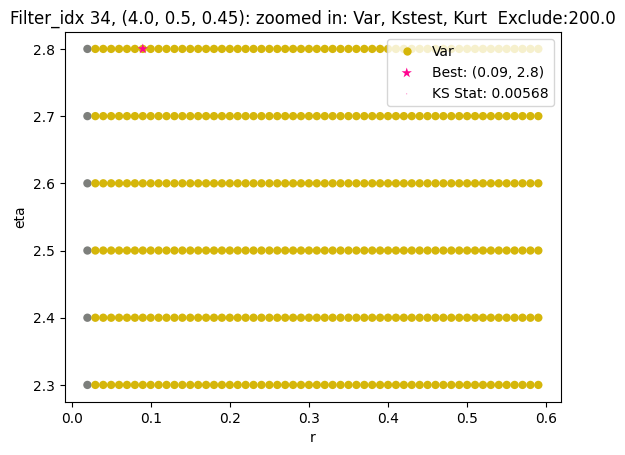

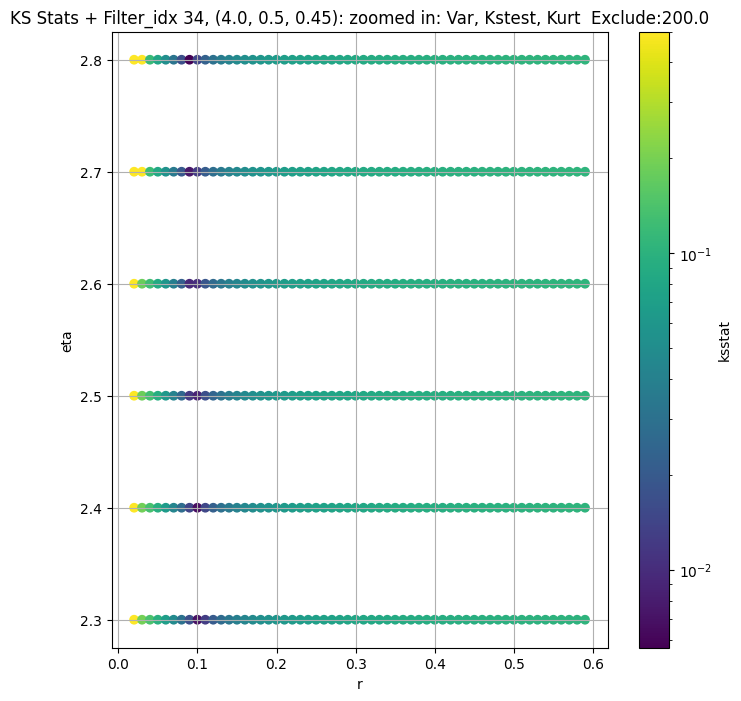

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 100 = 300, ksstat: 0.0042621855546573426, var: 41.76737976074219


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 75 = 275, ksstat: 0.003877318590919252, var: 42.68702697753906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 50 = 250, ksstat: 0.0034932025511519305, var: 43.70784378051758


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 25 = 225, ksstat: 0.003171313122377617, var: 44.85325622558594


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + 0 = 200, ksstat: 0.0028848718423248876, var: 46.155452728271484


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -25 = 175, ksstat: 0.0025685405449825584, var: 47.65989303588867


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -50 = 150, ksstat: 0.0028614759521590205, var: 49.433921813964844


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -75 = 125, ksstat: 0.004033241639140206, var: 51.58505630493164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 200.0 + -100 = 100, ksstat: 0.005380549878615581, var: 54.29775619506836
Number of samples: 100000, Without approximation : 262144000.0


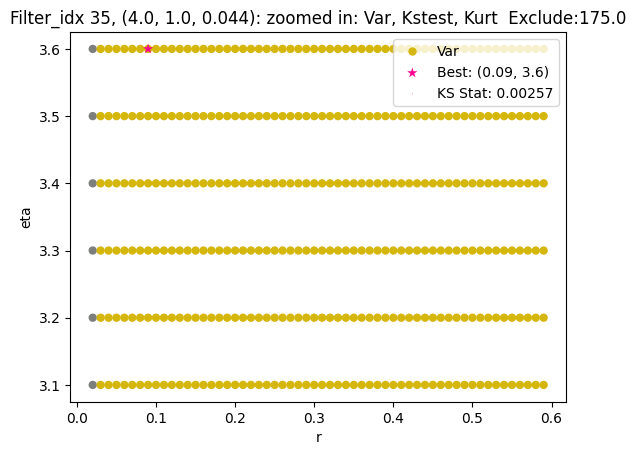

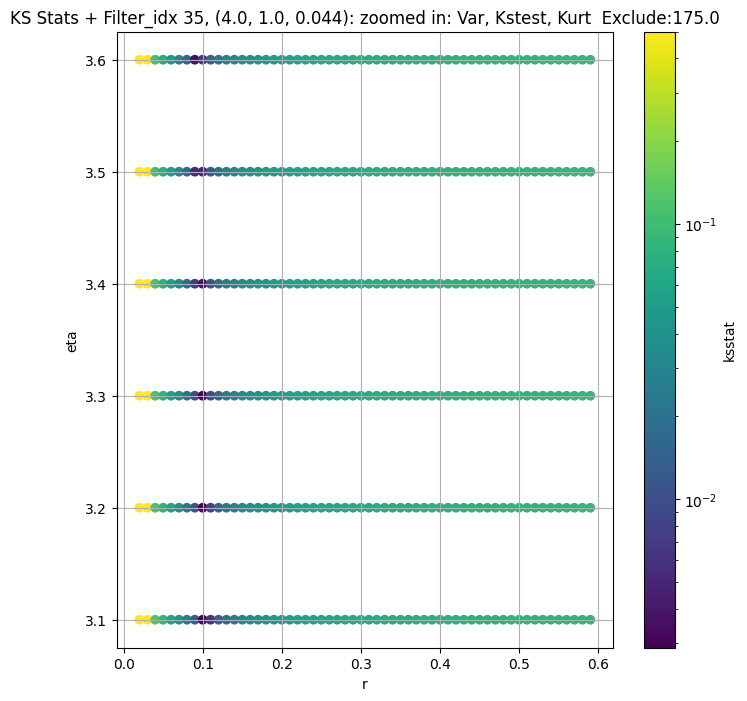

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 100 = 200, ksstat: 0.0031397923554706917, var: 25.414804458618164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 75 = 175, ksstat: 0.002725286795211142, var: 26.081024169921875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 50 = 150, ksstat: 0.0023696597485995674, var: 26.841947555541992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 25 = 125, ksstat: 0.002017314105554613, var: 27.726797103881836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 0 = 100, ksstat: 0.002136945675978996, var: 28.782344818115234


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -25 = 75, ksstat: 0.0029634630802737594, var: 30.08484649658203


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -50 = 50, ksstat: 0.004527726435995874, var: 31.7928524017334


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -75 = 25, ksstat: 0.006263237283781309, var: 34.35988235473633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -100 = 0, ksstat: 0.014115683572098026, var: 48.4910888671875
Number of samples: 100000, Without approximation : 262144000.0


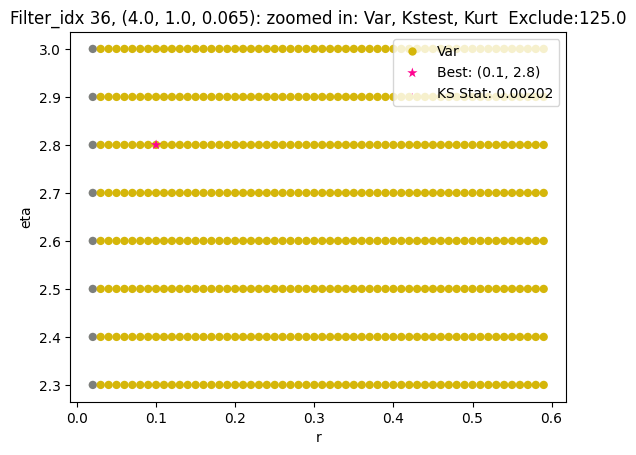

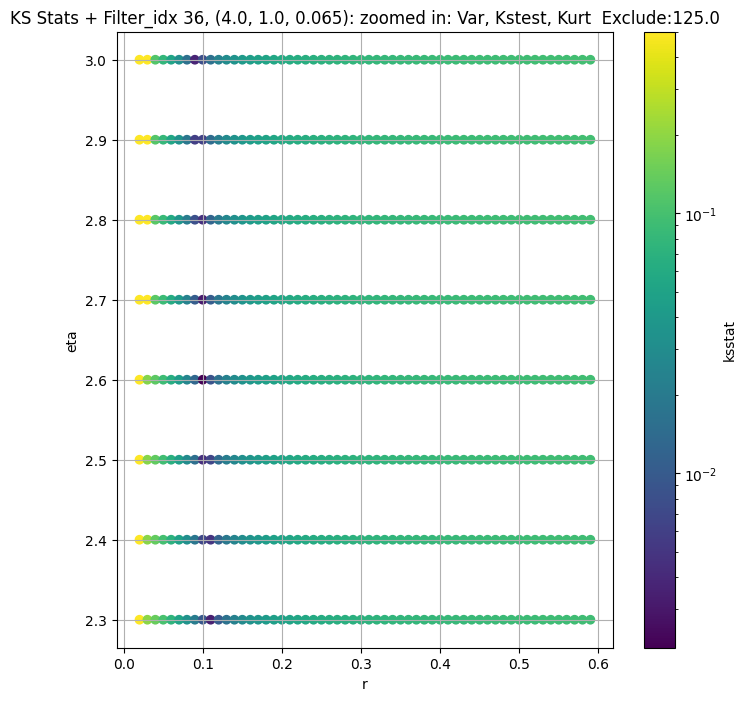

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + 100 = 200, ksstat: 0.0036196381280736434, var: 13.004505157470703


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + 75 = 175, ksstat: 0.003154566185941187, var: 13.280547142028809


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + 50 = 150, ksstat: 0.002714548761963753, var: 13.583549499511719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + 25 = 125, ksstat: 0.0023174280963123017, var: 13.920388221740723


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + 0 = 100, ksstat: 0.001960485370569684, var: 14.301468849182129


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + -25 = 75, ksstat: 0.001633385156761591, var: 14.74366569519043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + -50 = 50, ksstat: 0.0022130366222893327, var: 15.276776313781738


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + -75 = 25, ksstat: 0.0031848692476754564, var: 15.991275787353516


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 100.0 + -100 = 0, ksstat: 0.0058200147171482974, var: 18.18012809753418
Number of samples: 100000, Without approximation : 262144000.0


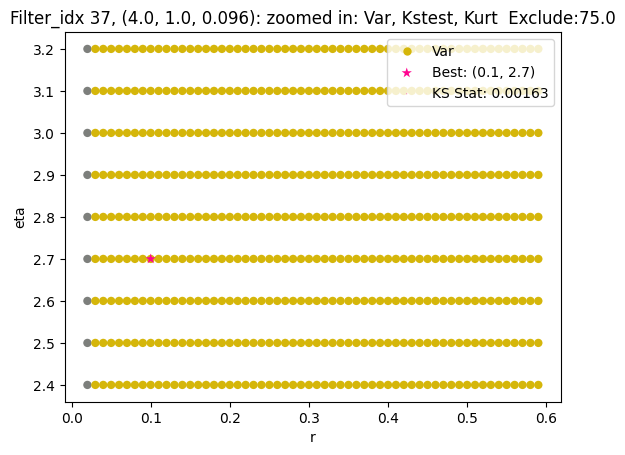

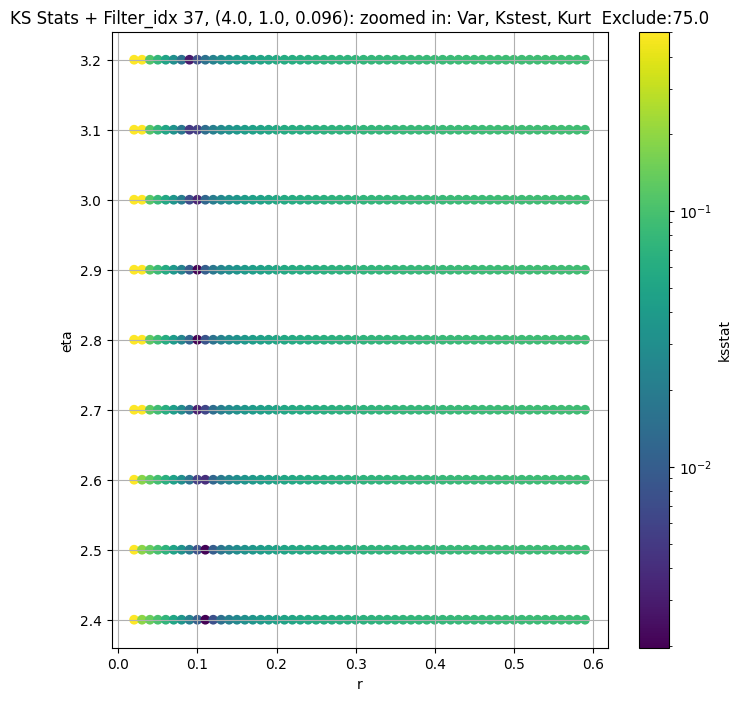

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 100 = 300, ksstat: 0.005070905284313266, var: 5.9260993003845215


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 75 = 275, ksstat: 0.004713828604812176, var: 6.05517578125


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 50 = 250, ksstat: 0.004369456620608947, var: 6.19624662399292


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 25 = 225, ksstat: 0.004007330525469326, var: 6.351888656616211


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + 0 = 200, ksstat: 0.0036535901426645867, var: 6.525689601898193


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -25 = 175, ksstat: 0.0032550405806106575, var: 6.723169803619385


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -50 = 150, ksstat: 0.0028722855687486337, var: 6.953457832336426


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -75 = 125, ksstat: 0.0037297508459222806, var: 7.2319560050964355


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 38, 200.0 + -100 = 100, ksstat: 0.005002319652107734, var: 7.585324287414551
Number of samples: 100000, Without approximation : 262144000.0


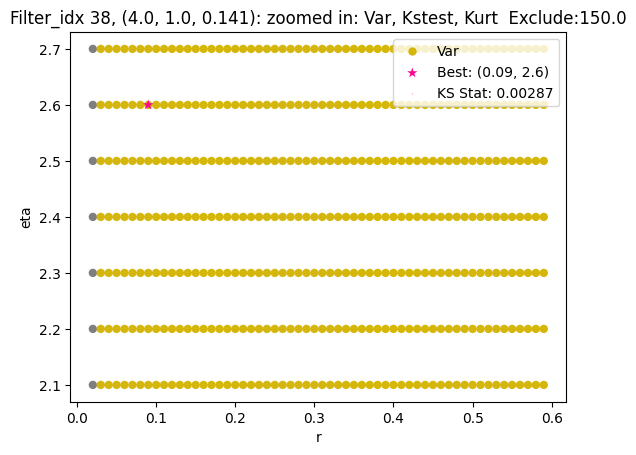

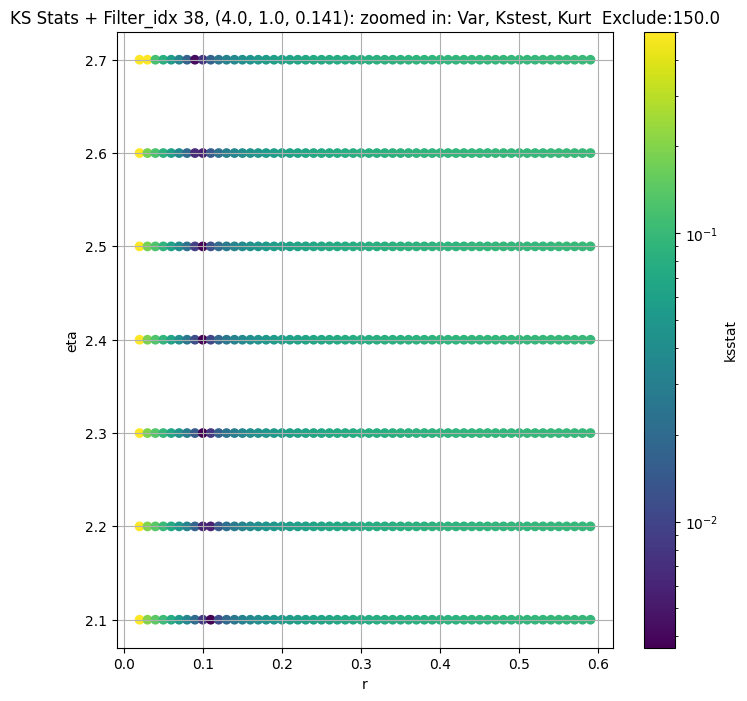

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 100 = 300, ksstat: 0.004639311491108857, var: 1.5928140878677368


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 75 = 275, ksstat: 0.00420983403980657, var: 1.6314454078674316


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 50 = 250, ksstat: 0.0038001966635370366, var: 1.6746405363082886


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 25 = 225, ksstat: 0.0033823779784195717, var: 1.7236617803573608


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 0 = 200, ksstat: 0.0032961886424546227, var: 1.7803200483322144


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -25 = 175, ksstat: 0.004115077836697345, var: 1.8474745750427246


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -50 = 150, ksstat: 0.0049359726771577295, var: 1.9300484657287598


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -75 = 125, ksstat: 0.006447165579839709, var: 2.037061929702759


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -100 = 100, ksstat: 0.007820390059976867, var: 2.1864688396453857
Number of samples: 100000, Without approximation : 262144000.0


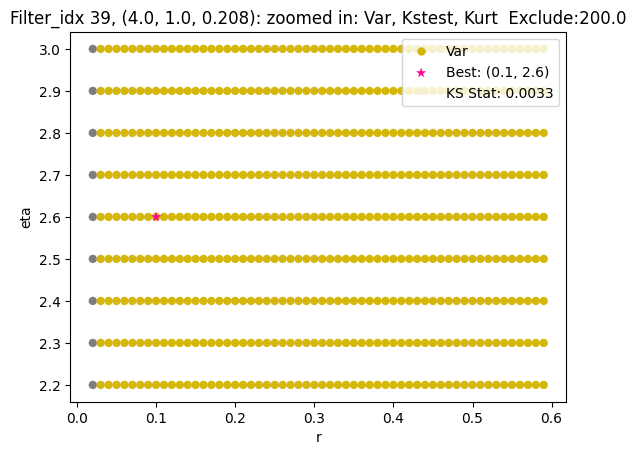

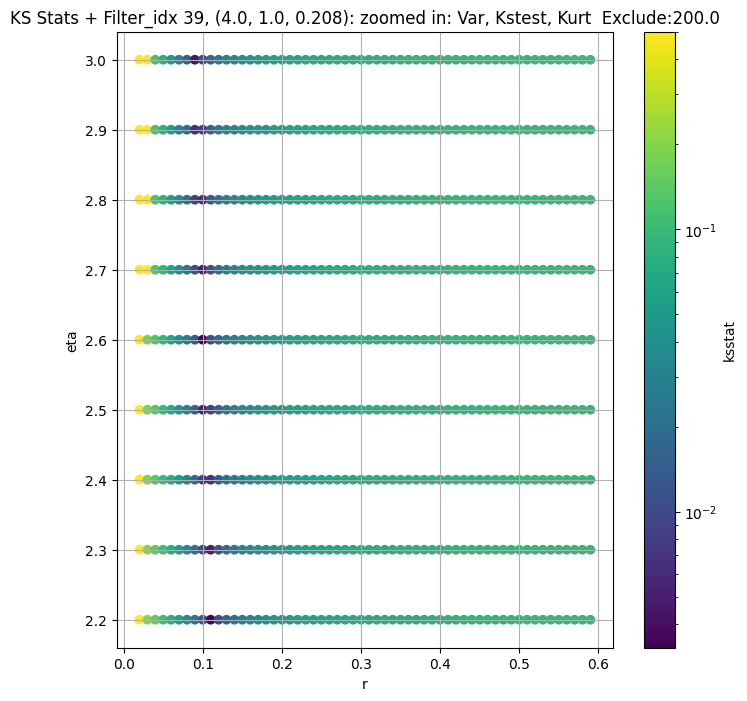

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 100 = 300, ksstat: 0.005724205894381069, var: 0.3979661464691162


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 75 = 275, ksstat: 0.005303526603154363, var: 0.40680477023124695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 50 = 250, ksstat: 0.004933028023817343, var: 0.4164372384548187


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 25 = 225, ksstat: 0.004480264270457335, var: 0.4270436465740204


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 0 = 200, ksstat: 0.004055523040633391, var: 0.43885067105293274


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -25 = 175, ksstat: 0.004174020942075751, var: 0.45220527052879333


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -50 = 150, ksstat: 0.005192035890793534, var: 0.4676291048526764


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -75 = 125, ksstat: 0.0057720278987913876, var: 0.48594537377357483


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -100 = 100, ksstat: 0.00613456107957655, var: 0.5085790157318115
Number of samples: 100000, Without approximation : 262144000.0


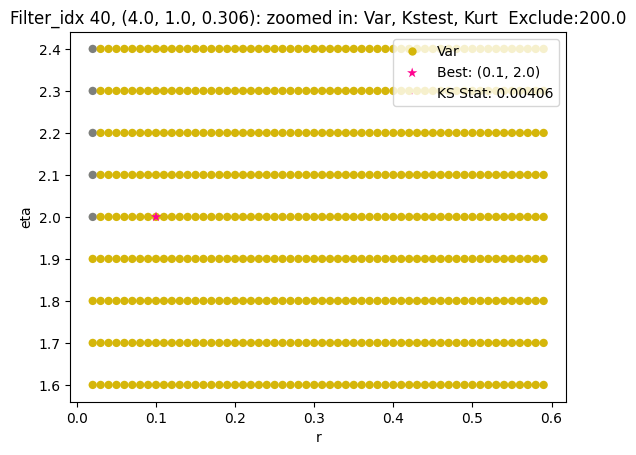

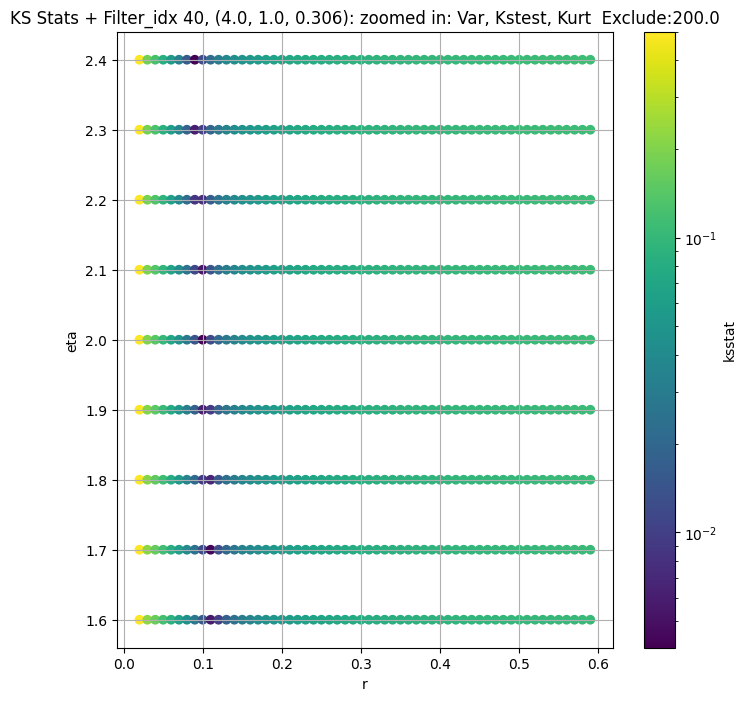

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 100 = 300, ksstat: 0.0066496292952181735, var: 0.05139854922890663


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 75 = 275, ksstat: 0.006390024821101625, var: 0.05245481804013252


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 50 = 250, ksstat: 0.006914062112252428, var: 0.05359100177884102


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 25 = 225, ksstat: 0.007425641524526294, var: 0.05482078716158867


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 0 = 200, ksstat: 0.0070508986560137155, var: 0.056162696331739426


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -25 = 175, ksstat: 0.00796277564640252, var: 0.05764153227210045


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -50 = 150, ksstat: 0.008700287479361357, var: 0.059291791170835495


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -75 = 125, ksstat: 0.00894301468483616, var: 0.061164308339357376


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -100 = 100, ksstat: 0.0093322704839445, var: 0.06334392726421356
Number of samples: 100000, Without approximation : 262144000.0


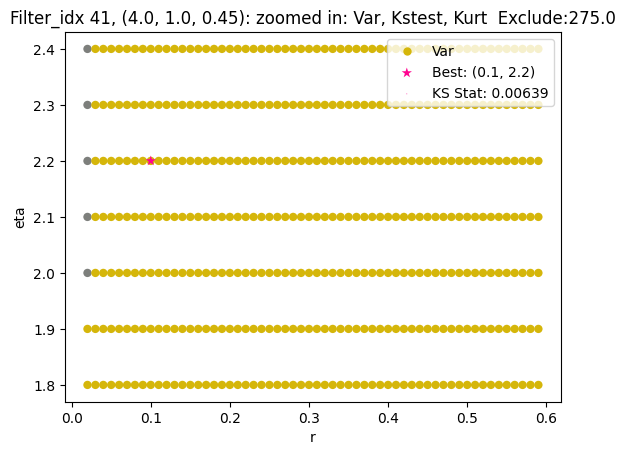

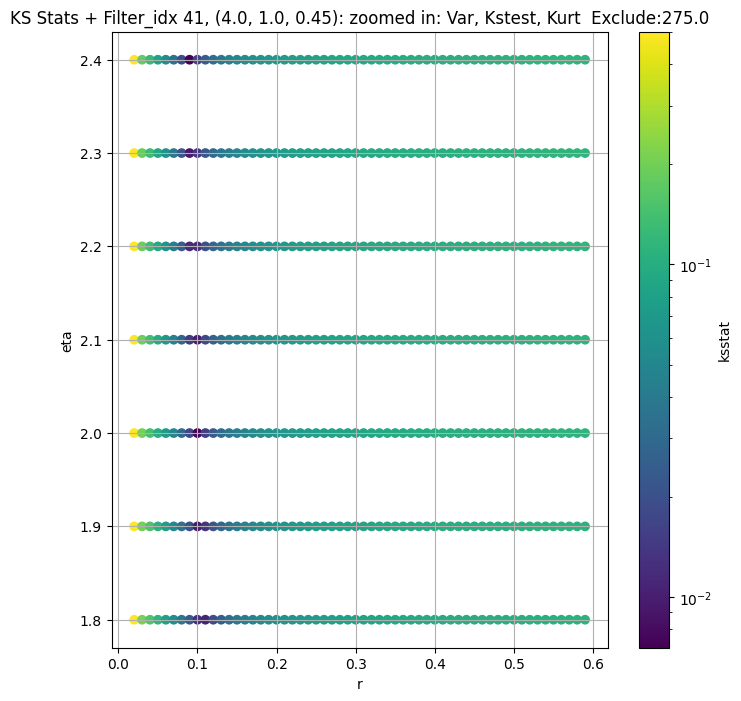

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",122.512850,39.769505,721.071700,689.621150,8.335084,762.91406,262144000.0,"(2.0, 0.5, 0.044)",0.002828,...,7.605296e-16,200.0,46.903862,0.000084,0.002124,0.09,3.1,1.739339e-18,150.0,432000
1,"(2.0, 0.5, 0.065)",41.206413,19.952644,273.712800,776.613460,5.031142,803.78830,262144000.0,"(2.0, 0.5, 0.065)",0.001371,...,7.352322e-16,50.0,25.992033,0.000084,0.001110,0.11,2.4,8.108917e-14,75.0,1536000
2,"(2.0, 0.5, 0.096)",31.351840,10.314682,229.798840,1246.370600,4.091756,876.93860,262144000.0,"(2.0, 0.5, 0.096)",0.001531,...,1.915566e-16,50.0,13.554227,0.000084,0.001531,0.10,2.9,1.915566e-16,50.0,768000
3,"(2.0, 0.5, 0.141)",22.116690,6.198631,92.711860,510.675540,8.659283,620.26135,262144000.0,"(2.0, 0.5, 0.141)",0.002684,...,3.518954e-05,200.0,7.054037,0.000084,0.002330,0.17,0.7,7.607189e-07,175.0,324000
4,"(2.0, 0.5, 0.208)",5.817891,1.947129,38.298820,865.975200,8.834655,852.49660,262144000.0,"(2.0, 0.5, 0.208)",0.003264,...,3.847158e-17,200.0,2.350580,0.000084,0.002255,0.09,3.0,1.089149e-19,150.0,384000
5,"(2.0, 0.5, 0.306)",0.948849,0.431888,5.817474,648.051760,7.456698,749.99900,262144000.0,"(2.0, 0.5, 0.306)",0.003789,...,8.693630e-18,200.0,0.499081,0.000084,0.003789,0.10,2.8,8.693630e-18,200.0,128000
6,"(2.0, 0.5, 0.45)",0.544168,0.224286,3.753008,738.979430,10.107155,794.04407,262144000.0,"(2.0, 0.5, 0.45)",0.003486,...,1.089984e-17,200.0,0.258707,0.000084,0.003456,0.11,2.0,1.950199e-15,200.0,162000
7,"(2.0, 1.0, 0.044)",96.786000,44.159317,881.038800,1494.333400,6.239370,873.81110,262144000.0,"(2.0, 1.0, 0.044)",0.001588,...,6.266096e-16,100.0,54.414635,0.000084,0.001588,0.10,3.0,6.266096e-16,100.0,768000
8,"(2.0, 1.0, 0.065)",51.278526,25.238693,393.370060,982.398000,6.040555,813.75590,262144000.0,"(2.0, 1.0, 0.065)",0.002019,...,6.808280e-16,100.0,34.460594,0.000084,0.001950,0.09,2.9,2.004277e-18,50.0,512000


In [14]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

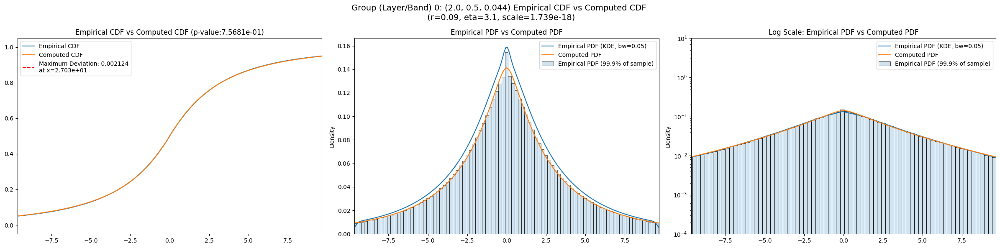

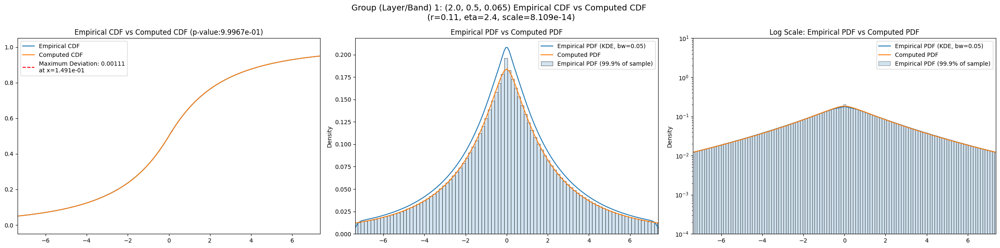

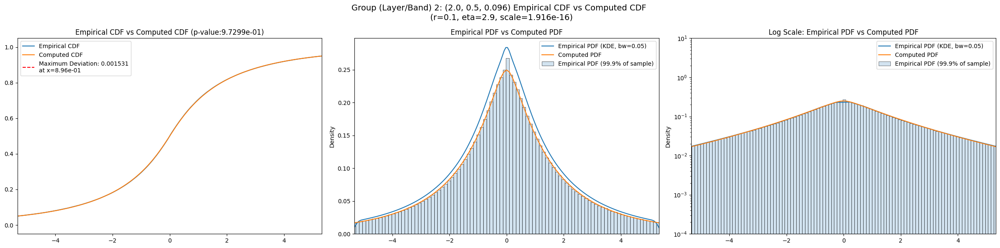

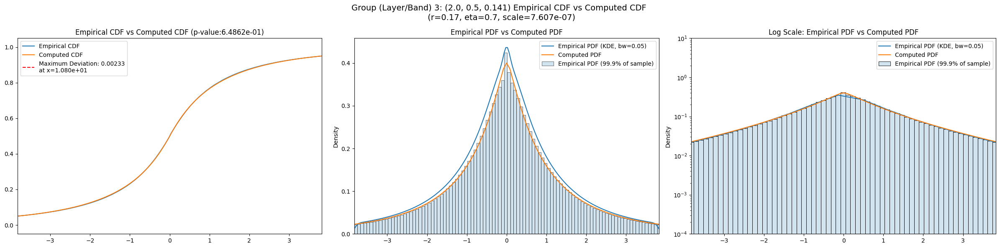

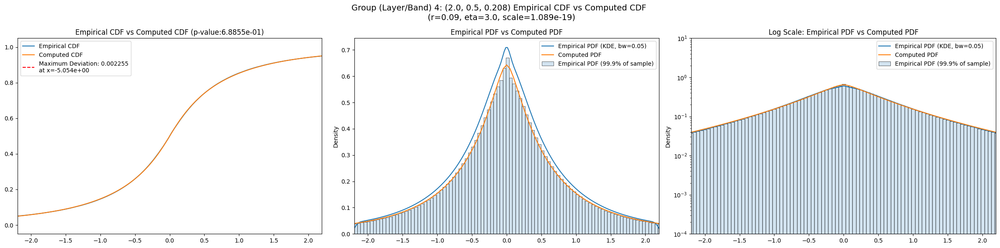

...

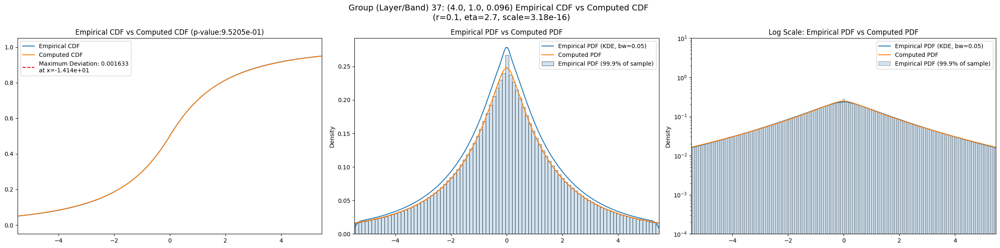

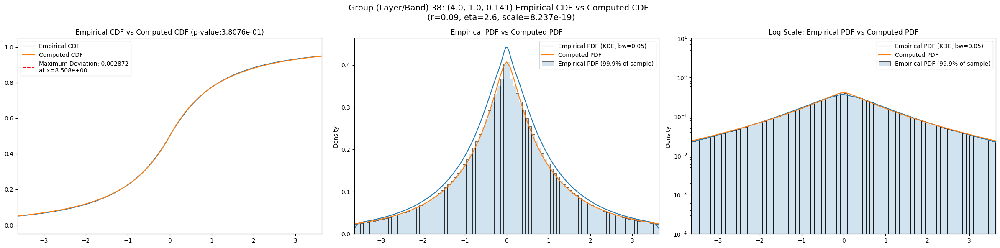

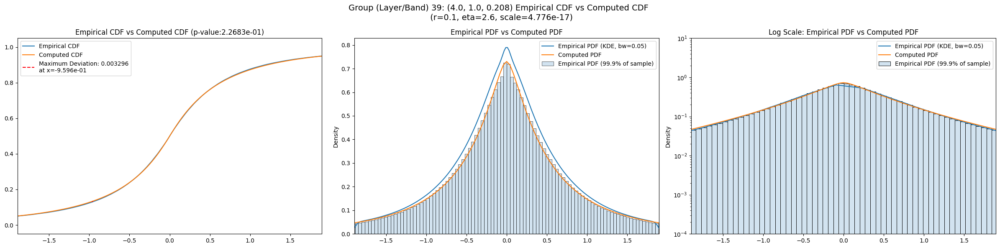

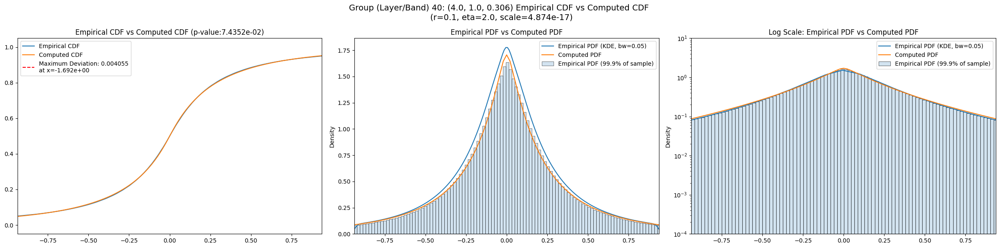

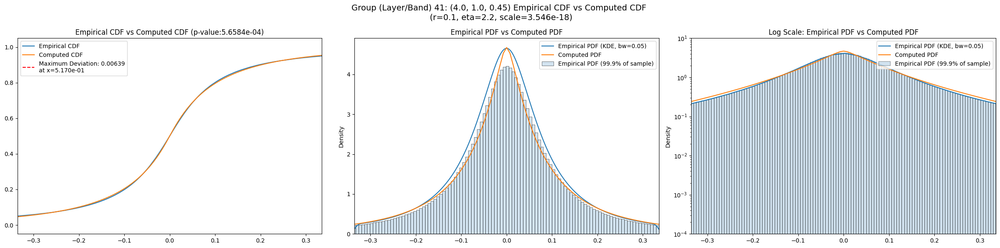

In [15]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [16]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [17]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",122.512850,39.769505,721.071700,689.621150,8.335084,762.91406,262144000.0,"(2.0, 0.5, 0.044)",0.002828,...,4.253100,0.039704,0.0,3.759780,0.013594,0.0,3.001620,0.011990,0.0,0.000000e+00
1,"(2.0, 0.5, 0.065)",41.206413,19.952644,273.712800,776.613460,5.031142,803.78830,262144000.0,"(2.0, 0.5, 0.065)",0.001371,...,3.242260,0.040000,0.0,2.860060,0.013178,0.0,2.290150,0.013028,0.0,6.471197e-281
2,"(2.0, 0.5, 0.096)",31.351840,10.314682,229.798840,1246.370600,4.091756,876.93860,262144000.0,"(2.0, 0.5, 0.096)",0.001531,...,2.344050,0.040329,0.0,2.060890,0.013102,0.0,1.662980,0.013218,0.0,0.000000e+00
3,"(2.0, 0.5, 0.141)",22.116690,6.198631,92.711860,510.675540,8.659283,620.26135,262144000.0,"(2.0, 0.5, 0.141)",0.002684,...,1.606390,0.043828,0.0,1.418310,0.017200,0.0,1.130780,0.015601,0.0,0.000000e+00
4,"(2.0, 0.5, 0.208)",5.817891,1.947129,38.298820,865.975200,8.834655,852.49660,262144000.0,"(2.0, 0.5, 0.208)",0.003264,...,0.945851,0.041447,0.0,0.835462,0.015353,0.0,0.667347,0.012811,0.0,0.000000e+00
5,"(2.0, 0.5, 0.306)",0.948849,0.431888,5.817474,648.051760,7.456698,749.99900,262144000.0,"(2.0, 0.5, 0.306)",0.003789,...,0.450237,0.040287,0.0,0.397290,0.015389,0.0,0.317770,0.010418,0.0,0.000000e+00
6,"(2.0, 0.5, 0.45)",0.544168,0.224286,3.753008,738.979430,10.107155,794.04407,262144000.0,"(2.0, 0.5, 0.45)",0.003486,...,0.307329,0.041600,0.0,0.272710,0.016383,0.0,0.216253,0.012523,0.0,0.000000e+00
7,"(2.0, 1.0, 0.044)",96.786000,44.159317,881.038800,1494.333400,6.239370,873.81110,262144000.0,"(2.0, 1.0, 0.044)",0.001588,...,4.739950,0.038358,0.0,4.184750,0.012043,0.0,3.355570,0.011150,0.0,0.000000e+00
8,"(2.0, 1.0, 0.065)",51.278526,25.238693,393.370060,982.398000,6.040555,813.75590,262144000.0,"(2.0, 1.0, 0.065)",0.002019,...,3.553720,0.040599,0.0,3.136260,0.013910,0.0,2.508680,0.013328,0.0,0.000000e+00


## Results

In [18]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [19]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.002828,0.000084,0.002124,0.039704,0.013594,0.011990
1,0.001371,0.000084,0.001110,0.040000,0.013178,0.013028
2,0.001531,0.000084,0.001531,0.040329,0.013102,0.013218
3,0.002684,0.000084,0.002330,0.043828,0.017200,0.015601
4,0.003264,0.000084,0.002255,0.041447,0.015353,0.012811
5,0.003789,0.000084,0.003789,0.040287,0.015389,0.010418
6,0.003486,0.000084,0.003456,0.041600,0.016383,0.012523
7,0.001588,0.000084,0.001588,0.038358,0.012043,0.011150
8,0.002019,0.000084,0.001950,0.040599,0.013910,0.013328


In [20]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,46.903862,0.002124,0.09,3.1,1.739339e-18,150.0
1,25.992033,0.001110,0.11,2.4,8.108917e-14,75.0
2,13.554227,0.001531,0.10,2.9,1.915566e-16,50.0
3,7.054037,0.002330,0.17,0.7,7.607189e-07,175.0
4,2.350580,0.002255,0.09,3.0,1.089149e-19,150.0
5,0.499081,0.003789,0.10,2.8,8.693630e-18,200.0
6,0.258707,0.003456,0.11,2.0,1.950199e-15,200.0
7,54.414635,0.001588,0.10,3.0,6.266096e-16,100.0
8,34.460594,0.001950,0.09,2.9,2.004277e-18,50.0
